# MSc in Data Science 
# Machine Learning 
# Academic Year: 2017-2018

## Linear Regression for white wines dataset

In [5]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib import cm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from mpl_toolkits.mplot3d import Axes3D
from numpy import set_printoptions
from sklearn.preprocessing import MinMaxScaler
import collections

%matplotlib inline

We are going to treat the problem as a regression problem and build some linear regression object that will predict the quality of the wine.

Linear regresion is an aprroach for modeling the relationship between a dependent variable (Y) and one or many independent variables (X) and it assumes that the relationship between the dependent and the independent variables is linear, thus the model is of the following form:

Y = W0 + W1X1 + W2X2 + ... + WnXn. 

In our dataset, we had observed that there is some correlation between the "density" feature and the "residual sugar" feature, which means that this might cause the linear regression to "behave" incorrectly, as we have assumed that the variables are independent to apply it. But for the scope of this exercise we are going to ignore this correlation.

First of all, we load the white wine dataset and assign the eleven features/values to X and the target value which is the quality of the wine to Y. 

In [7]:
balance_data = pd.read_csv('http://mlr.cs.umass.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv', sep = ";", header = 0)
X = balance_data.values[:,0:11]
Y = balance_data.values[:,11:12]

Then we create a multiple linear regression object and we fit the above 11 X features and target Y, to make a model that can predict the quality of the wine from all its other features. The model has the form:

Y = W0 + W1X1 + W2X2 + W3X3 + W4X4 + W5X5 + W6X6 + W7X7 + W8X8 + W9X9 + W10X10 + W11X11

In [8]:
regr = LinearRegression()
regr.fit(X, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

Using the model that we have created, we can try to "predict" the wine quality of the whole dataset, so as to check how accurate our model is. 

In [9]:
pred = regr.predict(X)
print(pred)[0:10]

[[ 5.5626578 ]
 [ 5.21687319]
 [ 5.7664803 ]
 [ 5.77818339]
 [ 5.77818339]
 [ 5.7664803 ]
 [ 5.45775994]
 [ 5.5626578 ]
 [ 5.21687319]
 [ 5.77215929]]


Now we can get the coefficients (W1, ..., W11) and the intercept (W0) of the linear regression and the model takes the form:

Y = 150,19284248 + 6.55199614e-02 * X1 + -1.86317709e+00 * X2 + 2.20902007e-02 * X3 + 8.14828026e-02 * X4 + -2.47276537e-01 * X5 + 3.73276519e-03 * X6 + -2.85747419e-04 * X7 + -1.50284181e+02 * X8  + 6.86343742e-01 * X9 + 6.31476473e-01 * X10 + 1.93475697e-01 * X11

Using the predicted values we can also calculate the mean squared error which is the average of the squares of the errors and the variance score which shows the accuracy of the model. If variance score is 1 then the model predicts the values perfectly.

In [10]:
print 'Coefficients: \n', regr.coef_
intercept = regr.intercept_[0]
print("\nThe intercept for our model is {}".format(intercept))
# The mean squared error
print("\nMean squared error: %.2f" % mean_squared_error(Y, pred))
# Explained variance score: 1 is perfect prediction
print('\nVariance score: %.2f' % r2_score(Y, pred))

Coefficients: 
[[  6.55199614e-02  -1.86317709e+00   2.20902007e-02   8.14828026e-02
   -2.47276537e-01   3.73276519e-03  -2.85747419e-04  -1.50284181e+02
    6.86343742e-01   6.31476473e-01   1.93475697e-01]]

The intercept for our model is 150.192842481

Mean squared error: 0.56

Variance score: 0.28


We are going to choose the most prominent feature of the previous question of the exercise and apply linear regression again. The most prominent feature is feature number 10 (X[10] - "alcohol"). 

So, we assign the values of this feature to a variable (X10) and plot a scatter plot that shows how the data is distributed according to their "alcohol" and "quality".  By observing the plot of the data and the values of the features we can conclude that the plot would be somehow the same even if we choose another feature of them.

In [11]:
X10 = balance_data.values[:,10:11]
print len(X10)

4898


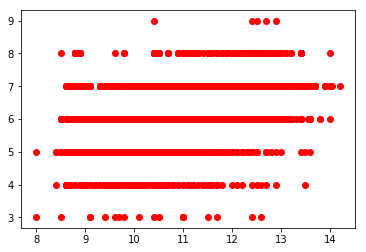

In [12]:
plt.scatter(X10, Y,  color='red')
plt.show()

Then we create a linear regression object and we fit the above X10 feature and target Y, to make a model that can predict the quality of the wine only from its alcohol. The model has the form:

Y = W0 + W1X1

In [13]:
regr10 = LinearRegression()
regr10.fit(X10, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

Using the model that we have created, we can try to "predict" the wine quality of the whole dataset, so as to check how accurate our model is. 

In [14]:
pred10 = regr10.predict(X10)
print pred10

[[ 5.34053926]
 [ 5.55996777]
 [ 5.74804935]
 ..., 
 [ 5.52862084]
 [ 6.59441646]
 [ 6.28094716]]


Now we can get the coefficient (W1) and the intercept (W0) of the linear regression and the model takes the form:

Y = 2.58200939917 + 0.3134693 * X1

Using the predicted values we can also calculate the mean squared error which is the average of the squares of the errors and the variance score which shows the accuracy of the model.

In [15]:
print 'Coefficients: \n', regr10.coef_
intercept10 = regr10.intercept_[0]
w1 = regr10.coef_
print("\nThe intercept for our model is {}".format(intercept10))
# The mean squared error
print("\nMean squared error: %.2f" % mean_squared_error(Y, pred10))
# Explained variance score: 1 is perfect prediction
print('\nVariance score: %.2f' % r2_score(Y, pred10))
# edw ftiaxnw ti synartisi y = w0 + w1x1 + ... + w11x11 kai chekarw ena paradeigma na dw ti prediction mou kanei

Coefficients: 
[[ 0.3134693]]

The intercept for our model is 2.58200939917

Mean squared error: 0.64

Variance score: 0.19


Now we can plot the data with the line that the linear regression have predicted. As we mentioned before, because of the nature of the values of the features and the target, we can observe that even if we would choose another feature to apply the linear regression, the plot and specifically the line would be somehow the same. This means that the classes below 5 and above 7 would never be predicted, because most of the values of quality is between 5 and 7.

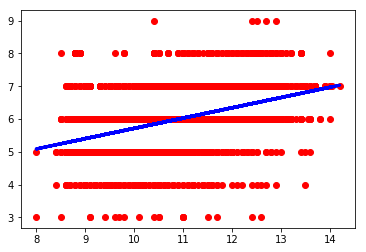

In [16]:
plt.scatter(X10, Y,  color='red')
plt.plot(X10, pred10, color='blue', linewidth=3)
plt.show()

The model doesn't seem to predict the quality very well, so we need a cost function so we can start optimizing our weights. We are using Mean Squared Error as our cost function. MSE measures the average squared difference between an observation’s actual and predicted values. Our goal is to minimize MSE to improve the accuracy of our model. For that purpose, we use Gradient Descent to calculate the gradient of our cost function. The implementation below, performs Gradient Descent and returns the optimum w0 and w1 for the MSE to be the least possible. 

In [17]:
def gradient_descent(training_examples, alpha):
    """
    Apply gradient descent on the training examples to learn a line that fits through the examples
    :param examples: set of all examples in (x,y) format
    :param alpha = learning rate
    :return:
    """
    # initialize w0 and w1 to some small value, here just using 0 for simplicity
    w0 = 0
    w1 = 0
    iterat = 0
    iters_list = []
    w0list = []
    w1list = []
    cost = []

    # repeat until "convergence", meaning that w0 and w1 aren't changing very much
    # --> need to define what 'not very much' means, and that may depend on problem domain
    convergence = False
    while not convergence:
        # initialize temporary variables, and set them to 0
        iterat += 1
        iters_list.append(iterat)
        delta_w0 = 0
        delta_w1 = 0

        for pair in training_examples:
            # grab our data points from the example
            x_i = pair[0]
            y_i = pair[1]

            # calculate a prediction, and find the error
            h_of_x_i = model_prediction(w0,w1,x_i)
            delta_w0 += prediction_error(w0,w1, x_i, y_i)
            delta_w1 += prediction_error(w0,w1,x_i,y_i)*x_i

        # store previous weighting values
        prev_w0 = w0
        prev_w1 = w1

        # get new weighting values
        w0 = w0 + alpha*delta_w0
        w1 = w1 + alpha*delta_w1
        w0list.append(w0)
        w1list.append(w1)
        #alpha -= 0.001

        # every few iterations print out current model
        #     1.  -->  (w0 + w1x1 + w2x2 + ... + wnxn)
        print "Current model is: ("+str(w0)+" + "+str(w1)+"x1)"
        #     2.  -->  averaged squared error over training set, using the current line
        summed_error = sum_of_squared_error_over_entire_dataset(w0, w1, training_examples)
        avg_error = summed_error/len(training_examples)
        cost.append(avg_error)
        print "Average Squared Error="+str(avg_error)
        print "Iteration:"+str(iterat)


        # check if we have converged
        if abs(prev_w0 - w0) < 0.00001 and abs(prev_w1 - w1) < 0.00001:
            convergence = True
        if iterat > 40000:
            convergence = True
            

    # after convergence, print out the parameters of the trained model (w0, ... wn)
    print "Parameters of trained model are: w0="+str(w0)+", w1="+str(w1)
    return w0list, w1list, cost, iters_list


############################
##### TRAINING HELPERS #####
############################
def model_prediction(w0, w1, x_i):
    return w0 + (w1 * x_i)

def prediction_error(w0, w1, x_i, y_i):
    # basically, we just take the true value (y_i)
    # and we subtract the predicted value from it
    # this gives us an error, or J(w0,w1) value
    return y_i - model_prediction(w0, w1, x_i)

def sum_of_squared_error_over_entire_dataset(w0, w1, training_examples):
    # find the squared error over the whole training set
    sum = 0
    for pair in training_examples:
        x_i = pair[0]
        y_i = pair[1]
        sum += prediction_error(w0,w1,x_i,y_i) ** 2
    return sum

The Gradient Descent estimates the weights of the model in many iterations by minimizing a cost function at every step. In order for Gradient Descent to work we must set the learning rate (alpha) to an appropriate value. This parameter determines how fast or slow we will "move" towards the minimum cost. If alpha is very large we will skip the optimal solution. If it is too small we will need too many iterations to converge to the best values. 

So we try 3 different values for alpha (0.001, 0.01 and 0.1), run the code, plot the cost with respect to the training epochs and check how many iterations (training epochs) are needed for the model to converge.

As we can observe value 0.001 for alpha is too small and the model needs 35.437 training epochs to converge to the best weights. Value 0.1 for alpha is too large and not only do we skip the optimal solution, but the cost seems to increase, whereas our objective is to minimize it. Finally, value 0.01 for alpha seems to be more suitable, because the model needs fewer training epochs to converge to the best weights (6.931).

In [18]:
w0, w1, cost, iters = gradient_descent((X10, Y), 0.001)

Current model is: ([ 0.0155] + [ 0.1196]x1)
Average Squared Error=[ 49.41959845]
Iteration:1
Current model is: ([ 0.02919892] + [ 0.22540318]x1)
Average Squared Error=[ 38.69420599]
Iteration:2
Current model is: ([ 0.04130456] + [ 0.3190013]x1)
Average Squared Error=[ 30.30086916]
Iteration:3
Current model is: ([ 0.05200073] + [ 0.40180248]x1)
Average Squared Error=[ 23.73252123]
Iteration:4
Current model is: ([ 0.06145005] + [ 0.4750524]x1)
Average Squared Error=[ 18.59234868]
Iteration:5
Current model is: ([ 0.06979637] + [ 0.53985299]x1)
Average Squared Error=[ 14.56981851]
Iteration:6
Current model is: ([ 0.07716696] + [ 0.59717908]x1)
Average Squared Error=[ 11.42191795]
Iteration:7
Current model is: ([ 0.08367437] + [ 0.64789302]x1)
Average Squared Error=[ 8.95847334]
Iteration:8
Current model is: ([ 0.08941821] + [ 0.69275765]x1)
Average Squared Error=[ 7.03066109]
Iteration:9
Current model is: ([ 0.09448656] + [ 0.73244783]x1)
Average Squared Error=[ 5.52201686]
Iteration:10
Cu

Iteration:93
Current model is: ([ 0.12489692] + [ 1.0378696]x1)
Average Squared Error=[ 0.09123817]
Iteration:94
Current model is: ([ 0.12478665] + [ 1.0378852]x1)
Average Squared Error=[ 0.09122577]
Iteration:95
Current model is: ([ 0.12467638] + [ 1.03790066]x1)
Average Squared Error=[ 0.09121337]
Iteration:96
Current model is: ([ 0.1245661] + [ 1.037916]x1)
Average Squared Error=[ 0.09120098]
Iteration:97
Current model is: ([ 0.12445581] + [ 1.03793123]x1)
Average Squared Error=[ 0.09118858]
Iteration:98
Current model is: ([ 0.12434551] + [ 1.03794637]x1)
Average Squared Error=[ 0.09117619]
Iteration:99
Current model is: ([ 0.12423522] + [ 1.03796142]x1)
Average Squared Error=[ 0.0911638]
Iteration:100
Current model is: ([ 0.12412492] + [ 1.03797639]x1)
Average Squared Error=[ 0.09115141]
Iteration:101
Current model is: ([ 0.12401462] + [ 1.0379913]x1)
Average Squared Error=[ 0.09113902]
Iteration:102
Current model is: ([ 0.12390432] + [ 1.03800615]x1)
Average Squared Error=[ 0.0911

Iteration:174
Current model is: ([ 0.11597863] + [ 1.03904426]x1)
Average Squared Error=[ 0.09023924]
Iteration:175
Current model is: ([ 0.11586882] + [ 1.0390586]x1)
Average Squared Error=[ 0.09022698]
Iteration:176
Current model is: ([ 0.11575901] + [ 1.03907293]x1)
Average Squared Error=[ 0.09021472]
Iteration:177
Current model is: ([ 0.11564921] + [ 1.03908726]x1)
Average Squared Error=[ 0.09020245]
Iteration:178
Current model is: ([ 0.11553942] + [ 1.0391016]x1)
Average Squared Error=[ 0.0901902]
Iteration:179
Current model is: ([ 0.11542964] + [ 1.03911593]x1)
Average Squared Error=[ 0.09017794]
Iteration:180
Current model is: ([ 0.11531987] + [ 1.03913026]x1)
Average Squared Error=[ 0.09016568]
Iteration:181
Current model is: ([ 0.1152101] + [ 1.03914459]x1)
Average Squared Error=[ 0.09015343]
Iteration:182
Current model is: ([ 0.11510034] + [ 1.03915892]x1)
Average Squared Error=[ 0.09014118]
Iteration:183
Current model is: ([ 0.11499059] + [ 1.03917324]x1)
Average Squared Erro

Average Squared Error=[ 0.08911792]
Iteration:267
Current model is: ([ 0.10579794] + [ 1.04037329]x1)
Average Squared Error=[ 0.08910581]
Iteration:268
Current model is: ([ 0.10568882] + [ 1.04038753]x1)
Average Squared Error=[ 0.0890937]
Iteration:269
Current model is: ([ 0.10557971] + [ 1.04040177]x1)
Average Squared Error=[ 0.08908159]
Iteration:270
Current model is: ([ 0.1054706] + [ 1.04041602]x1)
Average Squared Error=[ 0.08906948]
Iteration:271
Current model is: ([ 0.1053615] + [ 1.04043026]x1)
Average Squared Error=[ 0.08905738]
Iteration:272
Current model is: ([ 0.10525241] + [ 1.0404445]x1)
Average Squared Error=[ 0.08904527]
Iteration:273
Current model is: ([ 0.10514333] + [ 1.04045874]x1)
Average Squared Error=[ 0.08903317]
Iteration:274
Current model is: ([ 0.10503425] + [ 1.04047298]x1)
Average Squared Error=[ 0.08902107]
Iteration:275
Current model is: ([ 0.10492518] + [ 1.04048722]x1)
Average Squared Error=[ 0.08900897]
Iteration:276
Current model is: ([ 0.10481612] + [

Iteration:397
Current model is: ([ 0.09167427] + [ 1.04221704]x1)
Average Squared Error=[ 0.08754525]
Iteration:398
Current model is: ([ 0.09156611] + [ 1.04223116]x1)
Average Squared Error=[ 0.08753336]
Iteration:399
Current model is: ([ 0.09145796] + [ 1.04224528]x1)
Average Squared Error=[ 0.08752146]
Iteration:400
Current model is: ([ 0.09134981] + [ 1.0422594]x1)
Average Squared Error=[ 0.08750956]
Iteration:401
Current model is: ([ 0.09124167] + [ 1.04227351]x1)
Average Squared Error=[ 0.08749767]
Iteration:402
Current model is: ([ 0.09113354] + [ 1.04228763]x1)
Average Squared Error=[ 0.08748578]
Iteration:403
Current model is: ([ 0.09102542] + [ 1.04230174]x1)
Average Squared Error=[ 0.08747389]
Iteration:404
Current model is: ([ 0.0909173] + [ 1.04231586]x1)
Average Squared Error=[ 0.087462]
Iteration:405
Current model is: ([ 0.09080919] + [ 1.04232997]x1)
Average Squared Error=[ 0.08745012]
Iteration:406
Current model is: ([ 0.09070109] + [ 1.04234408]x1)
Average Squared Erro

Iteration:485
Current model is: ([ 0.08218421] + [ 1.04345591]x1)
Average Squared Error=[ 0.08650442]
Iteration:486
Current model is: ([ 0.08207669] + [ 1.04346994]x1)
Average Squared Error=[ 0.08649266]
Iteration:487
Current model is: ([ 0.08196918] + [ 1.04348398]x1)
Average Squared Error=[ 0.08648091]
Iteration:488
Current model is: ([ 0.08186168] + [ 1.04349801]x1)
Average Squared Error=[ 0.08646916]
Iteration:489
Current model is: ([ 0.08175419] + [ 1.04351204]x1)
Average Squared Error=[ 0.0864574]
Iteration:490
Current model is: ([ 0.0816467] + [ 1.04352608]x1)
Average Squared Error=[ 0.08644565]
Iteration:491
Current model is: ([ 0.08153922] + [ 1.04354011]x1)
Average Squared Error=[ 0.08643391]
Iteration:492
Current model is: ([ 0.08143175] + [ 1.04355414]x1)
Average Squared Error=[ 0.08642216]
Iteration:493
Current model is: ([ 0.08132428] + [ 1.04356817]x1)
Average Squared Error=[ 0.08641041]
Iteration:494
Current model is: ([ 0.08121683] + [ 1.04358219]x1)
Average Squared Er

Iteration:590
Current model is: ([ 0.07093484] + [ 1.04492444]x1)
Average Squared Error=[ 0.0852787]
Iteration:591
Current model is: ([ 0.07082809] + [ 1.04493838]x1)
Average Squared Error=[ 0.08526711]
Iteration:592
Current model is: ([ 0.07072135] + [ 1.04495231]x1)
Average Squared Error=[ 0.08525552]
Iteration:593
Current model is: ([ 0.07061461] + [ 1.04496625]x1)
Average Squared Error=[ 0.08524393]
Iteration:594
Current model is: ([ 0.07050788] + [ 1.04498018]x1)
Average Squared Error=[ 0.08523235]
Iteration:595
Current model is: ([ 0.07040116] + [ 1.04499411]x1)
Average Squared Error=[ 0.08522076]
Iteration:596
Current model is: ([ 0.07029444] + [ 1.04500804]x1)
Average Squared Error=[ 0.08520918]
Iteration:597
Current model is: ([ 0.07018773] + [ 1.04502197]x1)
Average Squared Error=[ 0.0851976]
Iteration:598
Current model is: ([ 0.07008103] + [ 1.0450359]x1)
Average Squared Error=[ 0.08518602]
Iteration:599
Current model is: ([ 0.06997434] + [ 1.04504983]x1)
Average Squared Err

Average Squared Error=[ 0.08395616]
Iteration:706
Current model is: ([ 0.05859994] + [ 1.04653468]x1)
Average Squared Error=[ 0.08394475]
Iteration:707
Current model is: ([ 0.05849402] + [ 1.04654851]x1)
Average Squared Error=[ 0.08393334]
Iteration:708
Current model is: ([ 0.05838812] + [ 1.04656234]x1)
Average Squared Error=[ 0.08392193]
Iteration:709
Current model is: ([ 0.05828222] + [ 1.04657616]x1)
Average Squared Error=[ 0.08391053]
Iteration:710
Current model is: ([ 0.05817633] + [ 1.04658998]x1)
Average Squared Error=[ 0.08389912]
Iteration:711
Current model is: ([ 0.05807044] + [ 1.04660381]x1)
Average Squared Error=[ 0.08388772]
Iteration:712
Current model is: ([ 0.05796457] + [ 1.04661763]x1)
Average Squared Error=[ 0.08387632]
Iteration:713
Current model is: ([ 0.0578587] + [ 1.04663145]x1)
Average Squared Error=[ 0.08386492]
Iteration:714
Current model is: ([ 0.05775283] + [ 1.04664527]x1)
Average Squared Error=[ 0.08385352]
Iteration:715
Current model is: ([ 0.05764698] 

Average Squared Error=[ 0.08193828]
Iteration:885
Current model is: ([ 0.03975567] + [ 1.04899468]x1)
Average Squared Error=[ 0.08192715]
Iteration:886
Current model is: ([ 0.03965104] + [ 1.04900834]x1)
Average Squared Error=[ 0.08191601]
Iteration:887
Current model is: ([ 0.03954642] + [ 1.049022]x1)
Average Squared Error=[ 0.08190488]
Iteration:888
Current model is: ([ 0.0394418] + [ 1.04903566]x1)
Average Squared Error=[ 0.08189375]
Iteration:889
Current model is: ([ 0.03933719] + [ 1.04904931]x1)
Average Squared Error=[ 0.08188262]
Iteration:890
Current model is: ([ 0.03923258] + [ 1.04906297]x1)
Average Squared Error=[ 0.08187149]
Iteration:891
Current model is: ([ 0.03912798] + [ 1.04907662]x1)
Average Squared Error=[ 0.08186037]
Iteration:892
Current model is: ([ 0.03902339] + [ 1.04909028]x1)
Average Squared Error=[ 0.08184924]
Iteration:893
Current model is: ([ 0.03891881] + [ 1.04910393]x1)
Average Squared Error=[ 0.08183812]
Iteration:894
Current model is: ([ 0.03881424] + 

Current model is: ([ 0.01278919] + [ 1.05251499]x1)
Average Squared Error=[ 0.07908262]
Iteration:1146
Current model is: ([ 0.01268639] + [ 1.05252841]x1)
Average Squared Error=[ 0.07907187]
Iteration:1147
Current model is: ([ 0.0125836] + [ 1.05254183]x1)
Average Squared Error=[ 0.07906112]
Iteration:1148
Current model is: ([ 0.01248081] + [ 1.05255524]x1)
Average Squared Error=[ 0.07905038]
Iteration:1149
Current model is: ([ 0.01237803] + [ 1.05256866]x1)
Average Squared Error=[ 0.07903964]
Iteration:1150
Current model is: ([ 0.01227526] + [ 1.05258208]x1)
Average Squared Error=[ 0.07902889]
Iteration:1151
Current model is: ([ 0.01217249] + [ 1.05259549]x1)
Average Squared Error=[ 0.07901815]
Iteration:1152
Current model is: ([ 0.01206973] + [ 1.05260891]x1)
Average Squared Error=[ 0.07900741]
Iteration:1153
Current model is: ([ 0.01196698] + [ 1.05262232]x1)
Average Squared Error=[ 0.07899668]
Iteration:1154
Current model is: ([ 0.01186424] + [ 1.05263573]x1)
Average Squared Error=

Iteration:1385
Current model is: ([-0.01168358] + [ 1.05570975]x1)
Average Squared Error=[ 0.07654463]
Iteration:1386
Current model is: ([-0.01178472] + [ 1.05572295]x1)
Average Squared Error=[ 0.07653423]
Iteration:1387
Current model is: ([-0.01188585] + [ 1.05573616]x1)
Average Squared Error=[ 0.07652383]
Iteration:1388
Current model is: ([-0.01198697] + [ 1.05574936]x1)
Average Squared Error=[ 0.07651343]
Iteration:1389
Current model is: ([-0.01208809] + [ 1.05576256]x1)
Average Squared Error=[ 0.07650303]
Iteration:1390
Current model is: ([-0.0121892] + [ 1.05577576]x1)
Average Squared Error=[ 0.07649264]
Iteration:1391
Current model is: ([-0.0122903] + [ 1.05578895]x1)
Average Squared Error=[ 0.07648224]
Iteration:1392
Current model is: ([-0.0123914] + [ 1.05580215]x1)
Average Squared Error=[ 0.07647185]
Iteration:1393
Current model is: ([-0.01249249] + [ 1.05581535]x1)
Average Squared Error=[ 0.07646145]
Iteration:1394
Current model is: ([-0.01259357] + [ 1.05582854]x1)
Average S

Average Squared Error=[ 0.07352635]
Iteration:1682
Current model is: ([-0.04142123] + [ 1.05959181]x1)
Average Squared Error=[ 0.07351636]
Iteration:1683
Current model is: ([-0.04152035] + [ 1.05960475]x1)
Average Squared Error=[ 0.07350637]
Iteration:1684
Current model is: ([-0.04161945] + [ 1.05961769]x1)
Average Squared Error=[ 0.07349638]
Iteration:1685
Current model is: ([-0.04171856] + [ 1.05963063]x1)
Average Squared Error=[ 0.07348639]
Iteration:1686
Current model is: ([-0.04181765] + [ 1.05964356]x1)
Average Squared Error=[ 0.0734764]
Iteration:1687
Current model is: ([-0.04191674] + [ 1.0596565]x1)
Average Squared Error=[ 0.07346642]
Iteration:1688
Current model is: ([-0.04201583] + [ 1.05966943]x1)
Average Squared Error=[ 0.07345643]
Iteration:1689
Current model is: ([-0.0421149] + [ 1.05968237]x1)
Average Squared Error=[ 0.07344645]
Iteration:1690
Current model is: ([-0.04221397] + [ 1.0596953]x1)
Average Squared Error=[ 0.07343647]
Iteration:1691
Current model is: ([-0.042

Current model is: ([-0.07521979] + [ 1.064004]x1)
Average Squared Error=[ 0.07014875]
Iteration:2028
Current model is: ([-0.0753166] + [ 1.06401664]x1)
Average Squared Error=[ 0.07013922]
Iteration:2029
Current model is: ([-0.07541342] + [ 1.06402928]x1)
Average Squared Error=[ 0.07012969]
Iteration:2030
Current model is: ([-0.07551022] + [ 1.06404191]x1)
Average Squared Error=[ 0.07012016]
Iteration:2031
Current model is: ([-0.07560702] + [ 1.06405455]x1)
Average Squared Error=[ 0.07011063]
Iteration:2032
Current model is: ([-0.07570382] + [ 1.06406719]x1)
Average Squared Error=[ 0.0701011]
Iteration:2033
Current model is: ([-0.0758006] + [ 1.06407982]x1)
Average Squared Error=[ 0.07009157]
Iteration:2034
Current model is: ([-0.07589738] + [ 1.06409246]x1)
Average Squared Error=[ 0.07008205]
Iteration:2035
Current model is: ([-0.07599416] + [ 1.06410509]x1)
Average Squared Error=[ 0.07007252]
Iteration:2036
Current model is: ([-0.07609092] + [ 1.06411772]x1)
Average Squared Error=[ 0.

Average Squared Error=[ 0.06725458]
Iteration:2338
Current model is: ([-0.10501574] + [ 1.06789367]x1)
Average Squared Error=[ 0.06724544]
Iteration:2339
Current model is: ([-0.10511053] + [ 1.06790605]x1)
Average Squared Error=[ 0.0672363]
Iteration:2340
Current model is: ([-0.10520532] + [ 1.06791842]x1)
Average Squared Error=[ 0.06722716]
Iteration:2341
Current model is: ([-0.1053001] + [ 1.06793079]x1)
Average Squared Error=[ 0.06721802]
Iteration:2342
Current model is: ([-0.10539488] + [ 1.06794317]x1)
Average Squared Error=[ 0.06720889]
Iteration:2343
Current model is: ([-0.10548965] + [ 1.06795554]x1)
Average Squared Error=[ 0.06719976]
Iteration:2344
Current model is: ([-0.10558441] + [ 1.06796791]x1)
Average Squared Error=[ 0.06719062]
Iteration:2345
Current model is: ([-0.10567917] + [ 1.06798028]x1)
Average Squared Error=[ 0.06718149]
Iteration:2346
Current model is: ([-0.10577392] + [ 1.06799265]x1)
Average Squared Error=[ 0.06717236]
Iteration:2347
Current model is: ([-0.1

Average Squared Error=[ 0.06485775]
Iteration:2605
Current model is: ([-0.13009858] + [ 1.07116808]x1)
Average Squared Error=[ 0.06484893]
Iteration:2606
Current model is: ([-0.13019167] + [ 1.07118023]x1)
Average Squared Error=[ 0.06484012]
Iteration:2607
Current model is: ([-0.13028476] + [ 1.07119238]x1)
Average Squared Error=[ 0.06483131]
Iteration:2608
Current model is: ([-0.13037783] + [ 1.07120453]x1)
Average Squared Error=[ 0.0648225]
Iteration:2609
Current model is: ([-0.1304709] + [ 1.07121668]x1)
Average Squared Error=[ 0.06481369]
Iteration:2610
Current model is: ([-0.13056397] + [ 1.07122883]x1)
Average Squared Error=[ 0.06480488]
Iteration:2611
Current model is: ([-0.13065703] + [ 1.07124098]x1)
Average Squared Error=[ 0.06479607]
Iteration:2612
Current model is: ([-0.13075008] + [ 1.07125313]x1)
Average Squared Error=[ 0.06478727]
Iteration:2613
Current model is: ([-0.13084313] + [ 1.07126527]x1)
Average Squared Error=[ 0.06477846]
Iteration:2614
Current model is: ([-0.1

Average Squared Error=[ 0.06281896]
Iteration:2840
Current model is: ([-0.1518018] + [ 1.07400129]x1)
Average Squared Error=[ 0.06281042]
Iteration:2841
Current model is: ([-0.15189342] + [ 1.07401325]x1)
Average Squared Error=[ 0.06280188]
Iteration:2842
Current model is: ([-0.15198503] + [ 1.07402521]x1)
Average Squared Error=[ 0.06279335]
Iteration:2843
Current model is: ([-0.15207663] + [ 1.07403717]x1)
Average Squared Error=[ 0.06278481]
Iteration:2844
Current model is: ([-0.15216823] + [ 1.07404913]x1)
Average Squared Error=[ 0.06277628]
Iteration:2845
Current model is: ([-0.15225982] + [ 1.07406109]x1)
Average Squared Error=[ 0.06276775]
Iteration:2846
Current model is: ([-0.1523514] + [ 1.07407304]x1)
Average Squared Error=[ 0.06275922]
Iteration:2847
Current model is: ([-0.15244298] + [ 1.074085]x1)
Average Squared Error=[ 0.06275069]
Iteration:2848
Current model is: ([-0.15253455] + [ 1.07409695]x1)
Average Squared Error=[ 0.06274216]
Iteration:2849
Current model is: ([-0.152

Iteration:3142
Current model is: ([-0.17918865] + [ 1.07757647]x1)
Average Squared Error=[ 0.06028452]
Iteration:3143
Current model is: ([-0.17927841] + [ 1.07758819]x1)
Average Squared Error=[ 0.06027632]
Iteration:3144
Current model is: ([-0.17936816] + [ 1.07759991]x1)
Average Squared Error=[ 0.06026813]
Iteration:3145
Current model is: ([-0.1794579] + [ 1.07761162]x1)
Average Squared Error=[ 0.06025994]
Iteration:3146
Current model is: ([-0.17954763] + [ 1.07762334]x1)
Average Squared Error=[ 0.06025175]
Iteration:3147
Current model is: ([-0.17963736] + [ 1.07763505]x1)
Average Squared Error=[ 0.06024356]
Iteration:3148
Current model is: ([-0.17972709] + [ 1.07764676]x1)
Average Squared Error=[ 0.06023538]
Iteration:3149
Current model is: ([-0.17981681] + [ 1.07765848]x1)
Average Squared Error=[ 0.06022719]
Iteration:3150
Current model is: ([-0.17990652] + [ 1.07767019]x1)
Average Squared Error=[ 0.06021901]
Iteration:3151
Current model is: ([-0.17999622] + [ 1.0776819]x1)
Average 

Average Squared Error=[ 0.05834189]
Iteration:3384
Current model is: ([-0.20073235] + [ 1.08038887]x1)
Average Squared Error=[ 0.05833396]
Iteration:3385
Current model is: ([-0.20082064] + [ 1.08040039]x1)
Average Squared Error=[ 0.05832603]
Iteration:3386
Current model is: ([-0.20090892] + [ 1.08041192]x1)
Average Squared Error=[ 0.05831811]
Iteration:3387
Current model is: ([-0.2009972] + [ 1.08042344]x1)
Average Squared Error=[ 0.05831018]
Iteration:3388
Current model is: ([-0.20108547] + [ 1.08043496]x1)
Average Squared Error=[ 0.05830226]
Iteration:3389
Current model is: ([-0.20117374] + [ 1.08044649]x1)
Average Squared Error=[ 0.05829433]
Iteration:3390
Current model is: ([-0.201262] + [ 1.08045801]x1)
Average Squared Error=[ 0.05828641]
Iteration:3391
Current model is: ([-0.20135026] + [ 1.08046953]x1)
Average Squared Error=[ 0.05827849]
Iteration:3392
Current model is: ([-0.2014385] + [ 1.08048105]x1)
Average Squared Error=[ 0.05827057]
Iteration:3393
Current model is: ([-0.201

Iteration:3672
Current model is: ([-0.22591366] + [ 1.08367613]x1)
Average Squared Error=[ 0.05609471]
Iteration:3673
Current model is: ([-0.22600024] + [ 1.08368743]x1)
Average Squared Error=[ 0.05608709]
Iteration:3674
Current model is: ([-0.22608681] + [ 1.08369873]x1)
Average Squared Error=[ 0.05607947]
Iteration:3675
Current model is: ([-0.22617338] + [ 1.08371003]x1)
Average Squared Error=[ 0.05607185]
Iteration:3676
Current model is: ([-0.22625994] + [ 1.08372133]x1)
Average Squared Error=[ 0.05606422]
Iteration:3677
Current model is: ([-0.2263465] + [ 1.08373263]x1)
Average Squared Error=[ 0.05605661]
Iteration:3678
Current model is: ([-0.22643305] + [ 1.08374393]x1)
Average Squared Error=[ 0.05604899]
Iteration:3679
Current model is: ([-0.22651959] + [ 1.08375523]x1)
Average Squared Error=[ 0.05604137]
Iteration:3680
Current model is: ([-0.22660613] + [ 1.08376652]x1)
Average Squared Error=[ 0.05603375]
Iteration:3681
Current model is: ([-0.22669266] + [ 1.08377782]x1)
Average

Iteration:4003
Current model is: ([-0.25425249] + [ 1.08737558]x1)
Average Squared Error=[ 0.05362709]
Iteration:4004
Current model is: ([-0.25433714] + [ 1.08738663]x1)
Average Squared Error=[ 0.05361981]
Iteration:4005
Current model is: ([-0.25442179] + [ 1.08739768]x1)
Average Squared Error=[ 0.05361252]
Iteration:4006
Current model is: ([-0.25450643] + [ 1.08740873]x1)
Average Squared Error=[ 0.05360523]
Iteration:4007
Current model is: ([-0.25459107] + [ 1.08741978]x1)
Average Squared Error=[ 0.05359795]
Iteration:4008
Current model is: ([-0.2546757] + [ 1.08743083]x1)
Average Squared Error=[ 0.05359066]
Iteration:4009
Current model is: ([-0.25476032] + [ 1.08744187]x1)
Average Squared Error=[ 0.05358338]
Iteration:4010
Current model is: ([-0.25484494] + [ 1.08745292]x1)
Average Squared Error=[ 0.0535761]
Iteration:4011
Current model is: ([-0.25492955] + [ 1.08746397]x1)
Average Squared Error=[ 0.05356882]
Iteration:4012
Current model is: ([-0.25501416] + [ 1.08747501]x1)
Average 

Average Squared Error=[ 0.05128894]
Iteration:4332
Current model is: ([-0.28179543] + [ 1.09097114]x1)
Average Squared Error=[ 0.05128197]
Iteration:4333
Current model is: ([-0.28187821] + [ 1.09098194]x1)
Average Squared Error=[ 0.051275]
Iteration:4334
Current model is: ([-0.28196098] + [ 1.09099275]x1)
Average Squared Error=[ 0.05126803]
Iteration:4335
Current model is: ([-0.28204375] + [ 1.09100355]x1)
Average Squared Error=[ 0.05126106]
Iteration:4336
Current model is: ([-0.28212652] + [ 1.09101436]x1)
Average Squared Error=[ 0.05125409]
Iteration:4337
Current model is: ([-0.28220928] + [ 1.09102516]x1)
Average Squared Error=[ 0.05124713]
Iteration:4338
Current model is: ([-0.28229203] + [ 1.09103596]x1)
Average Squared Error=[ 0.05124016]
Iteration:4339
Current model is: ([-0.28237478] + [ 1.09104677]x1)
Average Squared Error=[ 0.0512332]
Iteration:4340
Current model is: ([-0.28245752] + [ 1.09105757]x1)
Average Squared Error=[ 0.05122624]
Iteration:4341
Current model is: ([-0.28

Average Squared Error=[ 0.04930672]
Iteration:4622
Current model is: ([-0.30556799] + [ 1.09407449]x1)
Average Squared Error=[ 0.04930002]
Iteration:4623
Current model is: ([-0.30564916] + [ 1.09408509]x1)
Average Squared Error=[ 0.04929332]
Iteration:4624
Current model is: ([-0.30573032] + [ 1.09409568]x1)
Average Squared Error=[ 0.04928662]
Iteration:4625
Current model is: ([-0.30581148] + [ 1.09410628]x1)
Average Squared Error=[ 0.04927992]
Iteration:4626
Current model is: ([-0.30589263] + [ 1.09411687]x1)
Average Squared Error=[ 0.04927322]
Iteration:4627
Current model is: ([-0.30597377] + [ 1.09412746]x1)
Average Squared Error=[ 0.04926653]
Iteration:4628
Current model is: ([-0.30605491] + [ 1.09413806]x1)
Average Squared Error=[ 0.04925983]
Iteration:4629
Current model is: ([-0.30613604] + [ 1.09414865]x1)
Average Squared Error=[ 0.04925314]
Iteration:4630
Current model is: ([-0.30621717] + [ 1.09415924]x1)
Average Squared Error=[ 0.04924644]
Iteration:4631
Current model is: ([-0

Iteration:4778
Current model is: ([-0.31816352] + [ 1.09571876]x1)
Average Squared Error=[ 0.04826574]
Iteration:4779
Current model is: ([-0.31824383] + [ 1.09572924]x1)
Average Squared Error=[ 0.04825918]
Iteration:4780
Current model is: ([-0.31832413] + [ 1.09573973]x1)
Average Squared Error=[ 0.04825262]
Iteration:4781
Current model is: ([-0.31840443] + [ 1.09575021]x1)
Average Squared Error=[ 0.04824607]
Iteration:4782
Current model is: ([-0.31848473] + [ 1.09576069]x1)
Average Squared Error=[ 0.04823951]
Iteration:4783
Current model is: ([-0.31856502] + [ 1.09577117]x1)
Average Squared Error=[ 0.04823295]
Iteration:4784
Current model is: ([-0.3186453] + [ 1.09578165]x1)
Average Squared Error=[ 0.0482264]
Iteration:4785
Current model is: ([-0.31872558] + [ 1.09579213]x1)
Average Squared Error=[ 0.04821985]
Iteration:4786
Current model is: ([-0.31880585] + [ 1.09580261]x1)
Average Squared Error=[ 0.04821329]
Iteration:4787
Current model is: ([-0.31888612] + [ 1.09581309]x1)
Average 

Current model is: ([-0.33030831] + [ 1.09730418]x1)
Average Squared Error=[ 0.04727886]
Iteration:4931
Current model is: ([-0.3303878] + [ 1.09731456]x1)
Average Squared Error=[ 0.04727244]
Iteration:4932
Current model is: ([-0.33046728] + [ 1.09732494]x1)
Average Squared Error=[ 0.04726601]
Iteration:4933
Current model is: ([-0.33054675] + [ 1.09733531]x1)
Average Squared Error=[ 0.04725959]
Iteration:4934
Current model is: ([-0.33062622] + [ 1.09734569]x1)
Average Squared Error=[ 0.04725317]
Iteration:4935
Current model is: ([-0.33070568] + [ 1.09735606]x1)
Average Squared Error=[ 0.04724674]
Iteration:4936
Current model is: ([-0.33078514] + [ 1.09736643]x1)
Average Squared Error=[ 0.04724032]
Iteration:4937
Current model is: ([-0.33086459] + [ 1.0973768]x1)
Average Squared Error=[ 0.0472339]
Iteration:4938
Current model is: ([-0.33094404] + [ 1.09738718]x1)
Average Squared Error=[ 0.04722748]
Iteration:4939
Current model is: ([-0.33102348] + [ 1.09739755]x1)
Average Squared Error=[ 

Average Squared Error=[ 0.04633105]
Iteration:5080
Current model is: ([-0.34217095] + [ 1.09885278]x1)
Average Squared Error=[ 0.04632475]
Iteration:5081
Current model is: ([-0.34224963] + [ 1.09886305]x1)
Average Squared Error=[ 0.04631846]
Iteration:5082
Current model is: ([-0.3423283] + [ 1.09887332]x1)
Average Squared Error=[ 0.04631216]
Iteration:5083
Current model is: ([-0.34240697] + [ 1.09888359]x1)
Average Squared Error=[ 0.04630587]
Iteration:5084
Current model is: ([-0.34248563] + [ 1.09889386]x1)
Average Squared Error=[ 0.04629957]
Iteration:5085
Current model is: ([-0.34256429] + [ 1.09890412]x1)
Average Squared Error=[ 0.04629328]
Iteration:5086
Current model is: ([-0.34264294] + [ 1.09891439]x1)
Average Squared Error=[ 0.04628699]
Iteration:5087
Current model is: ([-0.34272159] + [ 1.09892466]x1)
Average Squared Error=[ 0.0462807]
Iteration:5088
Current model is: ([-0.34280023] + [ 1.09893493]x1)
Average Squared Error=[ 0.04627441]
Iteration:5089
Current model is: ([-0.3

Current model is: ([-0.35040314] + [ 1.09992744]x1)
Average Squared Error=[ 0.04566835]
Iteration:5186
Current model is: ([-0.35048126] + [ 1.09993763]x1)
Average Squared Error=[ 0.04566215]
Iteration:5187
Current model is: ([-0.35055937] + [ 1.09994783]x1)
Average Squared Error=[ 0.04565594]
Iteration:5188
Current model is: ([-0.35063748] + [ 1.09995803]x1)
Average Squared Error=[ 0.04564974]
Iteration:5189
Current model is: ([-0.35071559] + [ 1.09996822]x1)
Average Squared Error=[ 0.04564353]
Iteration:5190
Current model is: ([-0.35079369] + [ 1.09997842]x1)
Average Squared Error=[ 0.04563733]
Iteration:5191
Current model is: ([-0.35087178] + [ 1.09998861]x1)
Average Squared Error=[ 0.04563113]
Iteration:5192
Current model is: ([-0.35094987] + [ 1.09999881]x1)
Average Squared Error=[ 0.04562492]
Iteration:5193
Current model is: ([-0.35102795] + [ 1.100009]x1)
Average Squared Error=[ 0.04561872]
Iteration:5194
Current model is: ([-0.35110603] + [ 1.10001919]x1)
Average Squared Error=[

Average Squared Error=[ 0.04460708]
Iteration:5359
Current model is: ([-0.36391639] + [ 1.10169151]x1)
Average Squared Error=[ 0.04460102]
Iteration:5360
Current model is: ([-0.3639936] + [ 1.10170158]x1)
Average Squared Error=[ 0.04459496]
Iteration:5361
Current model is: ([-0.36407079] + [ 1.10171166]x1)
Average Squared Error=[ 0.0445889]
Iteration:5362
Current model is: ([-0.36414798] + [ 1.10172174]x1)
Average Squared Error=[ 0.04458284]
Iteration:5363
Current model is: ([-0.36422517] + [ 1.10173181]x1)
Average Squared Error=[ 0.04457678]
Iteration:5364
Current model is: ([-0.36430235] + [ 1.10174189]x1)
Average Squared Error=[ 0.04457072]
Iteration:5365
Current model is: ([-0.36437952] + [ 1.10175196]x1)
Average Squared Error=[ 0.04456466]
Iteration:5366
Current model is: ([-0.36445669] + [ 1.10176204]x1)
Average Squared Error=[ 0.04455861]
Iteration:5367
Current model is: ([-0.36453386] + [ 1.10177211]x1)
Average Squared Error=[ 0.04455255]
Iteration:5368
Current model is: ([-0.3

Average Squared Error=[ 0.04327539]
Iteration:5582
Current model is: ([-0.38100312] + [ 1.10392207]x1)
Average Squared Error=[ 0.04326951]
Iteration:5583
Current model is: ([-0.38107916] + [ 1.103932]x1)
Average Squared Error=[ 0.04326363]
Iteration:5584
Current model is: ([-0.38115519] + [ 1.10394192]x1)
Average Squared Error=[ 0.04325775]
Iteration:5585
Current model is: ([-0.38123122] + [ 1.10395185]x1)
Average Squared Error=[ 0.04325187]
Iteration:5586
Current model is: ([-0.38130725] + [ 1.10396177]x1)
Average Squared Error=[ 0.04324599]
Iteration:5587
Current model is: ([-0.38138327] + [ 1.1039717]x1)
Average Squared Error=[ 0.04324011]
Iteration:5588
Current model is: ([-0.38145928] + [ 1.10398162]x1)
Average Squared Error=[ 0.04323424]
Iteration:5589
Current model is: ([-0.38153529] + [ 1.10399154]x1)
Average Squared Error=[ 0.04322836]
Iteration:5590
Current model is: ([-0.3816113] + [ 1.10400146]x1)
Average Squared Error=[ 0.04322249]
Iteration:5591
Current model is: ([-0.381

Iteration:5837
Current model is: ([-0.40022703] + [ 1.10643163]x1)
Average Squared Error=[ 0.04179557]
Iteration:5838
Current model is: ([-0.40030177] + [ 1.10644139]x1)
Average Squared Error=[ 0.04178989]
Iteration:5839
Current model is: ([-0.4003765] + [ 1.10645114]x1)
Average Squared Error=[ 0.04178421]
Iteration:5840
Current model is: ([-0.40045122] + [ 1.1064609]x1)
Average Squared Error=[ 0.04177854]
Iteration:5841
Current model is: ([-0.40052594] + [ 1.10647065]x1)
Average Squared Error=[ 0.04177286]
Iteration:5842
Current model is: ([-0.40060065] + [ 1.1064804]x1)
Average Squared Error=[ 0.04176718]
Iteration:5843
Current model is: ([-0.40067536] + [ 1.10649016]x1)
Average Squared Error=[ 0.0417615]
Iteration:5844
Current model is: ([-0.40075006] + [ 1.10649991]x1)
Average Squared Error=[ 0.04175583]
Iteration:5845
Current model is: ([-0.40082476] + [ 1.10650966]x1)
Average Squared Error=[ 0.04175015]
Iteration:5846
Current model is: ([-0.40089946] + [ 1.10651941]x1)
Average Sq

Average Squared Error=[ 0.03992441]
Iteration:6175
Current model is: ([-0.42520009] + [ 1.1096917]x1)
Average Squared Error=[ 0.03991898]
Iteration:6176
Current model is: ([-0.42527313] + [ 1.10970124]x1)
Average Squared Error=[ 0.03991356]
Iteration:6177
Current model is: ([-0.42534616] + [ 1.10971077]x1)
Average Squared Error=[ 0.03990813]
Iteration:6178
Current model is: ([-0.42541919] + [ 1.10972031]x1)
Average Squared Error=[ 0.03990271]
Iteration:6179
Current model is: ([-0.42549221] + [ 1.10972984]x1)
Average Squared Error=[ 0.03989728]
Iteration:6180
Current model is: ([-0.42556523] + [ 1.10973937]x1)
Average Squared Error=[ 0.03989186]
Iteration:6181
Current model is: ([-0.42563824] + [ 1.1097489]x1)
Average Squared Error=[ 0.03988644]
Iteration:6182
Current model is: ([-0.42571125] + [ 1.10975843]x1)
Average Squared Error=[ 0.03988102]
Iteration:6183
Current model is: ([-0.42578425] + [ 1.10976796]x1)
Average Squared Error=[ 0.0398756]
Iteration:6184
Current model is: ([-0.42

Average Squared Error=[ 0.03808004]
Iteration:6523
Current model is: ([-0.45031965] + [ 1.1129709]x1)
Average Squared Error=[ 0.03807486]
Iteration:6524
Current model is: ([-0.45039098] + [ 1.11298021]x1)
Average Squared Error=[ 0.03806969]
Iteration:6525
Current model is: ([-0.4504623] + [ 1.11298952]x1)
Average Squared Error=[ 0.03806451]
Iteration:6526
Current model is: ([-0.45053362] + [ 1.11299884]x1)
Average Squared Error=[ 0.03805934]
Iteration:6527
Current model is: ([-0.45060494] + [ 1.11300814]x1)
Average Squared Error=[ 0.03805417]
Iteration:6528
Current model is: ([-0.45067625] + [ 1.11301745]x1)
Average Squared Error=[ 0.038049]
Iteration:6529
Current model is: ([-0.45074756] + [ 1.11302676]x1)
Average Squared Error=[ 0.03804383]
Iteration:6530
Current model is: ([-0.45081886] + [ 1.11303607]x1)
Average Squared Error=[ 0.03803866]
Iteration:6531
Current model is: ([-0.45089015] + [ 1.11304538]x1)
Average Squared Error=[ 0.03803349]
Iteration:6532
Current model is: ([-0.450

Average Squared Error=[ 0.03648414]
Iteration:6838
Current model is: ([-0.47255059] + [ 1.11587301]x1)
Average Squared Error=[ 0.03647918]
Iteration:6839
Current model is: ([-0.47262041] + [ 1.11588212]x1)
Average Squared Error=[ 0.03647423]
Iteration:6840
Current model is: ([-0.47269022] + [ 1.11589124]x1)
Average Squared Error=[ 0.03646927]
Iteration:6841
Current model is: ([-0.47276003] + [ 1.11590035]x1)
Average Squared Error=[ 0.03646431]
Iteration:6842
Current model is: ([-0.47282984] + [ 1.11590946]x1)
Average Squared Error=[ 0.03645936]
Iteration:6843
Current model is: ([-0.47289964] + [ 1.11591858]x1)
Average Squared Error=[ 0.0364544]
Iteration:6844
Current model is: ([-0.47296943] + [ 1.11592769]x1)
Average Squared Error=[ 0.03644945]
Iteration:6845
Current model is: ([-0.47303923] + [ 1.1159368]x1)
Average Squared Error=[ 0.03644449]
Iteration:6846
Current model is: ([-0.47310901] + [ 1.11594591]x1)
Average Squared Error=[ 0.03643954]
Iteration:6847
Current model is: ([-0.4

Iteration:7154
Current model is: ([-0.49437905] + [ 1.11872258]x1)
Average Squared Error=[ 0.03494563]
Iteration:7155
Current model is: ([-0.49444738] + [ 1.1187315]x1)
Average Squared Error=[ 0.03494088]
Iteration:7156
Current model is: ([-0.49451571] + [ 1.11874042]x1)
Average Squared Error=[ 0.03493613]
Iteration:7157
Current model is: ([-0.49458404] + [ 1.11874934]x1)
Average Squared Error=[ 0.03493138]
Iteration:7158
Current model is: ([-0.49465236] + [ 1.11875826]x1)
Average Squared Error=[ 0.03492663]
Iteration:7159
Current model is: ([-0.49472068] + [ 1.11876717]x1)
Average Squared Error=[ 0.03492189]
Iteration:7160
Current model is: ([-0.49478899] + [ 1.11877609]x1)
Average Squared Error=[ 0.03491714]
Iteration:7161
Current model is: ([-0.4948573] + [ 1.11878501]x1)
Average Squared Error=[ 0.0349124]
Iteration:7162
Current model is: ([-0.4949256] + [ 1.11879393]x1)
Average Squared Error=[ 0.03490765]
Iteration:7163
Current model is: ([-0.4949939] + [ 1.11880284]x1)
Average Squ

Iteration:7450
Current model is: ([-0.51440511] + [ 1.12133685]x1)
Average Squared Error=[ 0.03356766]
Iteration:7451
Current model is: ([-0.51447209] + [ 1.12134559]x1)
Average Squared Error=[ 0.0335631]
Iteration:7452
Current model is: ([-0.51453906] + [ 1.12135434]x1)
Average Squared Error=[ 0.03355854]
Iteration:7453
Current model is: ([-0.51460602] + [ 1.12136308]x1)
Average Squared Error=[ 0.03355398]
Iteration:7454
Current model is: ([-0.51467299] + [ 1.12137182]x1)
Average Squared Error=[ 0.03354942]
Iteration:7455
Current model is: ([-0.51473994] + [ 1.12138056]x1)
Average Squared Error=[ 0.03354486]
Iteration:7456
Current model is: ([-0.51480689] + [ 1.1213893]x1)
Average Squared Error=[ 0.0335403]
Iteration:7457
Current model is: ([-0.51487384] + [ 1.12139804]x1)
Average Squared Error=[ 0.03353574]
Iteration:7458
Current model is: ([-0.51494079] + [ 1.12140678]x1)
Average Squared Error=[ 0.03353118]
Iteration:7459
Current model is: ([-0.51500772] + [ 1.12141552]x1)
Average S

Average Squared Error=[ 0.03252573]
Iteration:7683
Current model is: ([-0.52988796] + [ 1.12335804]x1)
Average Squared Error=[ 0.03252131]
Iteration:7684
Current model is: ([-0.52995388] + [ 1.12336665]x1)
Average Squared Error=[ 0.03251689]
Iteration:7685
Current model is: ([-0.5300198] + [ 1.12337525]x1)
Average Squared Error=[ 0.03251247]
Iteration:7686
Current model is: ([-0.53008572] + [ 1.12338385]x1)
Average Squared Error=[ 0.03250805]
Iteration:7687
Current model is: ([-0.53015163] + [ 1.12339246]x1)
Average Squared Error=[ 0.03250363]
Iteration:7688
Current model is: ([-0.53021753] + [ 1.12340106]x1)
Average Squared Error=[ 0.03249921]
Iteration:7689
Current model is: ([-0.53028343] + [ 1.12340967]x1)
Average Squared Error=[ 0.0324948]
Iteration:7690
Current model is: ([-0.53034933] + [ 1.12341827]x1)
Average Squared Error=[ 0.03249038]
Iteration:7691
Current model is: ([-0.53041522] + [ 1.12342687]x1)
Average Squared Error=[ 0.03248597]
Iteration:7692
Current model is: ([-0.5

Average Squared Error=[ 0.03167502]
Iteration:7878
Current model is: ([-0.54265859] + [ 1.12502516]x1)
Average Squared Error=[ 0.03167072]
Iteration:7879
Current model is: ([-0.54272365] + [ 1.12503366]x1)
Average Squared Error=[ 0.03166641]
Iteration:7880
Current model is: ([-0.5427887] + [ 1.12504215]x1)
Average Squared Error=[ 0.03166211]
Iteration:7881
Current model is: ([-0.54285374] + [ 1.12505064]x1)
Average Squared Error=[ 0.03165781]
Iteration:7882
Current model is: ([-0.54291879] + [ 1.12505913]x1)
Average Squared Error=[ 0.0316535]
Iteration:7883
Current model is: ([-0.54298382] + [ 1.12506762]x1)
Average Squared Error=[ 0.0316492]
Iteration:7884
Current model is: ([-0.54304886] + [ 1.12507611]x1)
Average Squared Error=[ 0.0316449]
Iteration:7885
Current model is: ([-0.54311389] + [ 1.1250846]x1)
Average Squared Error=[ 0.0316406]
Iteration:7886
Current model is: ([-0.54317891] + [ 1.12509309]x1)
Average Squared Error=[ 0.0316363]
Iteration:7887
Current model is: ([-0.543243

Current model is: ([-0.56127677] + [ 1.12745565]x1)
Average Squared Error=[ 0.03045084]
Iteration:8168
Current model is: ([-0.56134056] + [ 1.12746398]x1)
Average Squared Error=[ 0.03044671]
Iteration:8169
Current model is: ([-0.56140435] + [ 1.1274723]x1)
Average Squared Error=[ 0.03044257]
Iteration:8170
Current model is: ([-0.56146813] + [ 1.12748063]x1)
Average Squared Error=[ 0.03043843]
Iteration:8171
Current model is: ([-0.56153191] + [ 1.12748896]x1)
Average Squared Error=[ 0.03043429]
Iteration:8172
Current model is: ([-0.56159568] + [ 1.12749728]x1)
Average Squared Error=[ 0.03043016]
Iteration:8173
Current model is: ([-0.56165945] + [ 1.12750561]x1)
Average Squared Error=[ 0.03042602]
Iteration:8174
Current model is: ([-0.56172321] + [ 1.12751393]x1)
Average Squared Error=[ 0.03042189]
Iteration:8175
Current model is: ([-0.56178697] + [ 1.12752225]x1)
Average Squared Error=[ 0.03041775]
Iteration:8176
Current model is: ([-0.56185073] + [ 1.12753058]x1)
Average Squared Error=

Current model is: ([-0.5757093] + [ 1.12933972]x1)
Average Squared Error=[ 0.0295217]
Iteration:8396
Current model is: ([-0.57577211] + [ 1.12934792]x1)
Average Squared Error=[ 0.02951769]
Iteration:8397
Current model is: ([-0.57583492] + [ 1.12935612]x1)
Average Squared Error=[ 0.02951368]
Iteration:8398
Current model is: ([-0.57589772] + [ 1.12936432]x1)
Average Squared Error=[ 0.02950967]
Iteration:8399
Current model is: ([-0.57596051] + [ 1.12937252]x1)
Average Squared Error=[ 0.02950566]
Iteration:8400
Current model is: ([-0.57602331] + [ 1.12938072]x1)
Average Squared Error=[ 0.02950165]
Iteration:8401
Current model is: ([-0.5760861] + [ 1.12938891]x1)
Average Squared Error=[ 0.02949764]
Iteration:8402
Current model is: ([-0.57614888] + [ 1.12939711]x1)
Average Squared Error=[ 0.02949363]
Iteration:8403
Current model is: ([-0.57621166] + [ 1.1294053]x1)
Average Squared Error=[ 0.02948962]
Iteration:8404
Current model is: ([-0.57627443] + [ 1.1294135]x1)
Average Squared Error=[ 0.

Current model is: ([-0.58886795] + [ 1.1310575]x1)
Average Squared Error=[ 0.02868711]
Iteration:8607
Current model is: ([-0.58892987] + [ 1.13106559]x1)
Average Squared Error=[ 0.02868321]
Iteration:8608
Current model is: ([-0.58899178] + [ 1.13107367]x1)
Average Squared Error=[ 0.02867932]
Iteration:8609
Current model is: ([-0.58905369] + [ 1.13108175]x1)
Average Squared Error=[ 0.02867542]
Iteration:8610
Current model is: ([-0.58911559] + [ 1.13108983]x1)
Average Squared Error=[ 0.02867152]
Iteration:8611
Current model is: ([-0.58917749] + [ 1.13109791]x1)
Average Squared Error=[ 0.02866763]
Iteration:8612
Current model is: ([-0.58923938] + [ 1.13110599]x1)
Average Squared Error=[ 0.02866373]
Iteration:8613
Current model is: ([-0.58930127] + [ 1.13111407]x1)
Average Squared Error=[ 0.02865983]
Iteration:8614
Current model is: ([-0.58936316] + [ 1.13112215]x1)
Average Squared Error=[ 0.02865594]
Iteration:8615
Current model is: ([-0.58942504] + [ 1.13113023]x1)
Average Squared Error=

Average Squared Error=[ 0.02787612]
Iteration:8818
Current model is: ([-0.60190031] + [ 1.13275879]x1)
Average Squared Error=[ 0.02787233]
Iteration:8819
Current model is: ([-0.60196133] + [ 1.13276676]x1)
Average Squared Error=[ 0.02786854]
Iteration:8820
Current model is: ([-0.60202236] + [ 1.13277473]x1)
Average Squared Error=[ 0.02786476]
Iteration:8821
Current model is: ([-0.60208338] + [ 1.13278269]x1)
Average Squared Error=[ 0.02786097]
Iteration:8822
Current model is: ([-0.6021444] + [ 1.13279066]x1)
Average Squared Error=[ 0.02785718]
Iteration:8823
Current model is: ([-0.60220541] + [ 1.13279862]x1)
Average Squared Error=[ 0.0278534]
Iteration:8824
Current model is: ([-0.60226642] + [ 1.13280659]x1)
Average Squared Error=[ 0.02784961]
Iteration:8825
Current model is: ([-0.60232742] + [ 1.13281455]x1)
Average Squared Error=[ 0.02784583]
Iteration:8826
Current model is: ([-0.60238843] + [ 1.13282251]x1)
Average Squared Error=[ 0.02784204]
Iteration:8827
Current model is: ([-0.6

Current model is: ([-0.60864933] + [ 1.13363984]x1)
Average Squared Error=[ 0.027455]
Iteration:8930
Current model is: ([-0.6087099] + [ 1.13364774]x1)
Average Squared Error=[ 0.02745127]
Iteration:8931
Current model is: ([-0.60877046] + [ 1.13365565]x1)
Average Squared Error=[ 0.02744754]
Iteration:8932
Current model is: ([-0.60883103] + [ 1.13366355]x1)
Average Squared Error=[ 0.0274438]
Iteration:8933
Current model is: ([-0.60889159] + [ 1.13367146]x1)
Average Squared Error=[ 0.02744008]
Iteration:8934
Current model is: ([-0.60895214] + [ 1.13367937]x1)
Average Squared Error=[ 0.02743635]
Iteration:8935
Current model is: ([-0.60901269] + [ 1.13368727]x1)
Average Squared Error=[ 0.02743262]
Iteration:8936
Current model is: ([-0.60907324] + [ 1.13369517]x1)
Average Squared Error=[ 0.02742889]
Iteration:8937
Current model is: ([-0.60913378] + [ 1.13370308]x1)
Average Squared Error=[ 0.02742516]
Iteration:8938
Current model is: ([-0.60919432] + [ 1.13371098]x1)
Average Squared Error=[ 0

Iteration:9030
Current model is: ([-0.61474625] + [ 1.13443575]x1)
Average Squared Error=[ 0.02708069]
Iteration:9031
Current model is: ([-0.61480641] + [ 1.1344436]x1)
Average Squared Error=[ 0.02707701]
Iteration:9032
Current model is: ([-0.61486656] + [ 1.13445146]x1)
Average Squared Error=[ 0.02707333]
Iteration:9033
Current model is: ([-0.61492671] + [ 1.13445931]x1)
Average Squared Error=[ 0.02706965]
Iteration:9034
Current model is: ([-0.61498685] + [ 1.13446716]x1)
Average Squared Error=[ 0.02706597]
Iteration:9035
Current model is: ([-0.61504699] + [ 1.13447501]x1)
Average Squared Error=[ 0.0270623]
Iteration:9036
Current model is: ([-0.61510713] + [ 1.13448286]x1)
Average Squared Error=[ 0.02705862]
Iteration:9037
Current model is: ([-0.61516726] + [ 1.13449071]x1)
Average Squared Error=[ 0.02705494]
Iteration:9038
Current model is: ([-0.61522739] + [ 1.13449856]x1)
Average Squared Error=[ 0.02705126]
Iteration:9039
Current model is: ([-0.61528751] + [ 1.13450641]x1)
Average 

Current model is: ([-0.62008421] + [ 1.13513259]x1)
Average Squared Error=[ 0.02675509]
Iteration:9120
Current model is: ([-0.620144] + [ 1.13514039]x1)
Average Squared Error=[ 0.02675145]
Iteration:9121
Current model is: ([-0.62020379] + [ 1.1351482]x1)
Average Squared Error=[ 0.02674782]
Iteration:9122
Current model is: ([-0.62026358] + [ 1.135156]x1)
Average Squared Error=[ 0.02674418]
Iteration:9123
Current model is: ([-0.62032336] + [ 1.13516381]x1)
Average Squared Error=[ 0.02674055]
Iteration:9124
Current model is: ([-0.62038314] + [ 1.13517161]x1)
Average Squared Error=[ 0.02673692]
Iteration:9125
Current model is: ([-0.62044291] + [ 1.13517941]x1)
Average Squared Error=[ 0.02673328]
Iteration:9126
Current model is: ([-0.62050268] + [ 1.13518722]x1)
Average Squared Error=[ 0.02672965]
Iteration:9127
Current model is: ([-0.62056245] + [ 1.13519502]x1)
Average Squared Error=[ 0.02672602]
Iteration:9128
Current model is: ([-0.62062221] + [ 1.13520282]x1)
Average Squared Error=[ 0.

Iteration:9207
Current model is: ([-0.62533054] + [ 1.13581746]x1)
Average Squared Error=[ 0.026437]
Iteration:9208
Current model is: ([-0.62538998] + [ 1.13582522]x1)
Average Squared Error=[ 0.0264334]
Iteration:9209
Current model is: ([-0.62544942] + [ 1.13583298]x1)
Average Squared Error=[ 0.02642981]
Iteration:9210
Current model is: ([-0.62550884] + [ 1.13584074]x1)
Average Squared Error=[ 0.02642622]
Iteration:9211
Current model is: ([-0.62556827] + [ 1.1358485]x1)
Average Squared Error=[ 0.02642263]
Iteration:9212
Current model is: ([-0.62562769] + [ 1.13585625]x1)
Average Squared Error=[ 0.02641904]
Iteration:9213
Current model is: ([-0.62568711] + [ 1.13586401]x1)
Average Squared Error=[ 0.02641545]
Iteration:9214
Current model is: ([-0.62574652] + [ 1.13587177]x1)
Average Squared Error=[ 0.02641186]
Iteration:9215
Current model is: ([-0.62580593] + [ 1.13587952]x1)
Average Squared Error=[ 0.02640827]
Iteration:9216
Current model is: ([-0.62586534] + [ 1.13588728]x1)
Average Sq

Average Squared Error=[ 0.02603408]
Iteration:9321
Current model is: ([-0.63208045] + [ 1.13669862]x1)
Average Squared Error=[ 0.02603054]
Iteration:9322
Current model is: ([-0.63213943] + [ 1.13670632]x1)
Average Squared Error=[ 0.026027]
Iteration:9323
Current model is: ([-0.63219841] + [ 1.13671402]x1)
Average Squared Error=[ 0.02602346]
Iteration:9324
Current model is: ([-0.63225738] + [ 1.13672172]x1)
Average Squared Error=[ 0.02601993]
Iteration:9325
Current model is: ([-0.63231634] + [ 1.13672941]x1)
Average Squared Error=[ 0.02601639]
Iteration:9326
Current model is: ([-0.63237531] + [ 1.13673711]x1)
Average Squared Error=[ 0.02601285]
Iteration:9327
Current model is: ([-0.63243426] + [ 1.13674481]x1)
Average Squared Error=[ 0.02600932]
Iteration:9328
Current model is: ([-0.63249322] + [ 1.1367525]x1)
Average Squared Error=[ 0.02600578]
Iteration:9329
Current model is: ([-0.63255217] + [ 1.1367602]x1)
Average Squared Error=[ 0.02600225]
Iteration:9330
Current model is: ([-0.632

Iteration:9415
Current model is: ([-0.63760697] + [ 1.13742007]x1)
Average Squared Error=[ 0.02570009]
Iteration:9416
Current model is: ([-0.63766557] + [ 1.13742772]x1)
Average Squared Error=[ 0.0256966]
Iteration:9417
Current model is: ([-0.63772417] + [ 1.13743537]x1)
Average Squared Error=[ 0.02569311]
Iteration:9418
Current model is: ([-0.63778276] + [ 1.13744302]x1)
Average Squared Error=[ 0.02568962]
Iteration:9419
Current model is: ([-0.63784135] + [ 1.13745067]x1)
Average Squared Error=[ 0.02568612]
Iteration:9420
Current model is: ([-0.63789994] + [ 1.13745832]x1)
Average Squared Error=[ 0.02568263]
Iteration:9421
Current model is: ([-0.63795852] + [ 1.13746596]x1)
Average Squared Error=[ 0.02567914]
Iteration:9422
Current model is: ([-0.6380171] + [ 1.13747361]x1)
Average Squared Error=[ 0.02567565]
Iteration:9423
Current model is: ([-0.63807568] + [ 1.13748126]x1)
Average Squared Error=[ 0.02567216]
Iteration:9424
Current model is: ([-0.63813425] + [ 1.1374889]x1)
Average S

Average Squared Error=[ 0.0252397]
Iteration:9549
Current model is: ([-0.6454244] + [ 1.13844059]x1)
Average Squared Error=[ 0.02523627]
Iteration:9550
Current model is: ([-0.64548247] + [ 1.13844817]x1)
Average Squared Error=[ 0.02523284]
Iteration:9551
Current model is: ([-0.64554054] + [ 1.13845575]x1)
Average Squared Error=[ 0.02522941]
Iteration:9552
Current model is: ([-0.64559861] + [ 1.13846333]x1)
Average Squared Error=[ 0.02522598]
Iteration:9553
Current model is: ([-0.64565667] + [ 1.13847091]x1)
Average Squared Error=[ 0.02522256]
Iteration:9554
Current model is: ([-0.64571472] + [ 1.13847849]x1)
Average Squared Error=[ 0.02521913]
Iteration:9555
Current model is: ([-0.64577277] + [ 1.13848607]x1)
Average Squared Error=[ 0.0252157]
Iteration:9556
Current model is: ([-0.64583082] + [ 1.13849364]x1)
Average Squared Error=[ 0.02521227]
Iteration:9557
Current model is: ([-0.64588887] + [ 1.13850122]x1)
Average Squared Error=[ 0.02520885]
Iteration:9558
Current model is: ([-0.64

Average Squared Error=[ 0.02492607]
Iteration:9641
Current model is: ([-0.65075053] + [ 1.13913588]x1)
Average Squared Error=[ 0.02492268]
Iteration:9642
Current model is: ([-0.65080824] + [ 1.13914341]x1)
Average Squared Error=[ 0.02491929]
Iteration:9643
Current model is: ([-0.65086595] + [ 1.13915095]x1)
Average Squared Error=[ 0.02491591]
Iteration:9644
Current model is: ([-0.65092365] + [ 1.13915848]x1)
Average Squared Error=[ 0.02491252]
Iteration:9645
Current model is: ([-0.65098135] + [ 1.13916601]x1)
Average Squared Error=[ 0.02490914]
Iteration:9646
Current model is: ([-0.65103904] + [ 1.13917354]x1)
Average Squared Error=[ 0.02490575]
Iteration:9647
Current model is: ([-0.65109673] + [ 1.13918107]x1)
Average Squared Error=[ 0.02490237]
Iteration:9648
Current model is: ([-0.65115442] + [ 1.1391886]x1)
Average Squared Error=[ 0.02489898]
Iteration:9649
Current model is: ([-0.6512121] + [ 1.13919613]x1)
Average Squared Error=[ 0.0248956]
Iteration:9650
Current model is: ([-0.65

Average Squared Error=[ 0.02456954]
Iteration:9747
Current model is: ([-0.65684601] + [ 1.13993161]x1)
Average Squared Error=[ 0.0245662]
Iteration:9748
Current model is: ([-0.65690331] + [ 1.13993909]x1)
Average Squared Error=[ 0.02456286]
Iteration:9749
Current model is: ([-0.6569606] + [ 1.13994656]x1)
Average Squared Error=[ 0.02455952]
Iteration:9750
Current model is: ([-0.65701789] + [ 1.13995404]x1)
Average Squared Error=[ 0.02455619]
Iteration:9751
Current model is: ([-0.65707517] + [ 1.13996152]x1)
Average Squared Error=[ 0.02455285]
Iteration:9752
Current model is: ([-0.65713245] + [ 1.139969]x1)
Average Squared Error=[ 0.02454951]
Iteration:9753
Current model is: ([-0.65718973] + [ 1.13997648]x1)
Average Squared Error=[ 0.02454618]
Iteration:9754
Current model is: ([-0.657247] + [ 1.13998395]x1)
Average Squared Error=[ 0.02454284]
Iteration:9755
Current model is: ([-0.65730427] + [ 1.13999143]x1)
Average Squared Error=[ 0.0245395]
Iteration:9756
Current model is: ([-0.657361

Current model is: ([-0.66380743] + [ 1.14084038]x1)
Average Squared Error=[ 0.02416222]
Iteration:9870
Current model is: ([-0.66386426] + [ 1.14084779]x1)
Average Squared Error=[ 0.02415894]
Iteration:9871
Current model is: ([-0.66392108] + [ 1.14085521]x1)
Average Squared Error=[ 0.02415565]
Iteration:9872
Current model is: ([-0.66397789] + [ 1.14086263]x1)
Average Squared Error=[ 0.02415237]
Iteration:9873
Current model is: ([-0.6640347] + [ 1.14087004]x1)
Average Squared Error=[ 0.02414909]
Iteration:9874
Current model is: ([-0.66409151] + [ 1.14087746]x1)
Average Squared Error=[ 0.0241458]
Iteration:9875
Current model is: ([-0.66414831] + [ 1.14088487]x1)
Average Squared Error=[ 0.02414252]
Iteration:9876
Current model is: ([-0.66420511] + [ 1.14089229]x1)
Average Squared Error=[ 0.02413924]
Iteration:9877
Current model is: ([-0.66426191] + [ 1.1408997]x1)
Average Squared Error=[ 0.02413596]
Iteration:9878
Current model is: ([-0.6643187] + [ 1.14090712]x1)
Average Squared Error=[ 0

Current model is: ([-0.66884956] + [ 1.14149859]x1)
Average Squared Error=[ 0.02387171]
Iteration:9959
Current model is: ([-0.66890604] + [ 1.14150597]x1)
Average Squared Error=[ 0.02386846]
Iteration:9960
Current model is: ([-0.66896252] + [ 1.14151334]x1)
Average Squared Error=[ 0.02386522]
Iteration:9961
Current model is: ([-0.66901899] + [ 1.14152071]x1)
Average Squared Error=[ 0.02386198]
Iteration:9962
Current model is: ([-0.66907546] + [ 1.14152808]x1)
Average Squared Error=[ 0.02385873]
Iteration:9963
Current model is: ([-0.66913192] + [ 1.14153545]x1)
Average Squared Error=[ 0.02385549]
Iteration:9964
Current model is: ([-0.66918839] + [ 1.14154282]x1)
Average Squared Error=[ 0.02385225]
Iteration:9965
Current model is: ([-0.66924484] + [ 1.14155019]x1)
Average Squared Error=[ 0.02384901]
Iteration:9966
Current model is: ([-0.6693013] + [ 1.14155756]x1)
Average Squared Error=[ 0.02384577]
Iteration:9967
Current model is: ([-0.66935775] + [ 1.14156493]x1)
Average Squared Error=

Average Squared Error=[ 0.02350469]
Iteration:10073
Current model is: ([-0.67531968] + [ 1.14234323]x1)
Average Squared Error=[ 0.02350149]
Iteration:10074
Current model is: ([-0.67537572] + [ 1.14235054]x1)
Average Squared Error=[ 0.0234983]
Iteration:10075
Current model is: ([-0.67543175] + [ 1.14235786]x1)
Average Squared Error=[ 0.02349511]
Iteration:10076
Current model is: ([-0.67548778] + [ 1.14236517]x1)
Average Squared Error=[ 0.02349191]
Iteration:10077
Current model is: ([-0.67554381] + [ 1.14237249]x1)
Average Squared Error=[ 0.02348872]
Iteration:10078
Current model is: ([-0.67559984] + [ 1.1423798]x1)
Average Squared Error=[ 0.02348553]
Iteration:10079
Current model is: ([-0.67565586] + [ 1.14238711]x1)
Average Squared Error=[ 0.02348234]
Iteration:10080
Current model is: ([-0.67571188] + [ 1.14239442]x1)
Average Squared Error=[ 0.02347915]
Iteration:10081
Current model is: ([-0.67576789] + [ 1.14240174]x1)
Average Squared Error=[ 0.02347595]
Iteration:10082
Current model 

Average Squared Error=[ 0.02323471]
Iteration:10158
Current model is: ([-0.68006954] + [ 1.14296329]x1)
Average Squared Error=[ 0.02323155]
Iteration:10159
Current model is: ([-0.68012526] + [ 1.14297056]x1)
Average Squared Error=[ 0.0232284]
Iteration:10160
Current model is: ([-0.68018097] + [ 1.14297784]x1)
Average Squared Error=[ 0.02322524]
Iteration:10161
Current model is: ([-0.68023668] + [ 1.14298511]x1)
Average Squared Error=[ 0.02322208]
Iteration:10162
Current model is: ([-0.68029239] + [ 1.14299238]x1)
Average Squared Error=[ 0.02321893]
Iteration:10163
Current model is: ([-0.68034809] + [ 1.14299965]x1)
Average Squared Error=[ 0.02321577]
Iteration:10164
Current model is: ([-0.68040379] + [ 1.14300692]x1)
Average Squared Error=[ 0.02321262]
Iteration:10165
Current model is: ([-0.68045948] + [ 1.14301419]x1)
Average Squared Error=[ 0.02320946]
Iteration:10166
Current model is: ([-0.68051517] + [ 1.14302146]x1)
Average Squared Error=[ 0.02320631]
Iteration:10167
Current model

Average Squared Error=[ 0.02291171]
Iteration:10261
Current model is: ([-0.68578861] + [ 1.14370988]x1)
Average Squared Error=[ 0.0229086]
Iteration:10262
Current model is: ([-0.68584394] + [ 1.1437171]x1)
Average Squared Error=[ 0.02290549]
Iteration:10263
Current model is: ([-0.68589926] + [ 1.14372432]x1)
Average Squared Error=[ 0.02290237]
Iteration:10264
Current model is: ([-0.68595458] + [ 1.14373155]x1)
Average Squared Error=[ 0.02289926]
Iteration:10265
Current model is: ([-0.6860099] + [ 1.14373877]x1)
Average Squared Error=[ 0.02289615]
Iteration:10266
Current model is: ([-0.68606522] + [ 1.14374599]x1)
Average Squared Error=[ 0.02289304]
Iteration:10267
Current model is: ([-0.68612053] + [ 1.14375321]x1)
Average Squared Error=[ 0.02288993]
Iteration:10268
Current model is: ([-0.68617583] + [ 1.14376043]x1)
Average Squared Error=[ 0.02288682]
Iteration:10269
Current model is: ([-0.68623113] + [ 1.14376765]x1)
Average Squared Error=[ 0.02288371]
Iteration:10270
Current model i

Current model is: ([-0.69069819] + [ 1.14435079]x1)
Average Squared Error=[ 0.02263316]
Iteration:10351
Current model is: ([-0.69075319] + [ 1.14435797]x1)
Average Squared Error=[ 0.02263009]
Iteration:10352
Current model is: ([-0.69080818] + [ 1.14436515]x1)
Average Squared Error=[ 0.02262701]
Iteration:10353
Current model is: ([-0.69086317] + [ 1.14437233]x1)
Average Squared Error=[ 0.02262394]
Iteration:10354
Current model is: ([-0.69091815] + [ 1.14437951]x1)
Average Squared Error=[ 0.02262086]
Iteration:10355
Current model is: ([-0.69097313] + [ 1.14438668]x1)
Average Squared Error=[ 0.02261779]
Iteration:10356
Current model is: ([-0.69102811] + [ 1.14439386]x1)
Average Squared Error=[ 0.02261471]
Iteration:10357
Current model is: ([-0.69108308] + [ 1.14440104]x1)
Average Squared Error=[ 0.02261164]
Iteration:10358
Current model is: ([-0.69113805] + [ 1.14440821]x1)
Average Squared Error=[ 0.02260857]
Iteration:10359
Current model is: ([-0.69119302] + [ 1.14441539]x1)
Average Squa

Iteration:10439
Current model is: ([-0.69557817] + [ 1.14498784]x1)
Average Squared Error=[ 0.02236103]
Iteration:10440
Current model is: ([-0.69563284] + [ 1.14499498]x1)
Average Squared Error=[ 0.022358]
Iteration:10441
Current model is: ([-0.6956875] + [ 1.14500211]x1)
Average Squared Error=[ 0.02235496]
Iteration:10442
Current model is: ([-0.69574215] + [ 1.14500925]x1)
Average Squared Error=[ 0.02235192]
Iteration:10443
Current model is: ([-0.69579681] + [ 1.14501638]x1)
Average Squared Error=[ 0.02234888]
Iteration:10444
Current model is: ([-0.69585145] + [ 1.14502352]x1)
Average Squared Error=[ 0.02234584]
Iteration:10445
Current model is: ([-0.6959061] + [ 1.14503065]x1)
Average Squared Error=[ 0.02234281]
Iteration:10446
Current model is: ([-0.69596074] + [ 1.14503779]x1)
Average Squared Error=[ 0.02233977]
Iteration:10447
Current model is: ([-0.69601538] + [ 1.14504492]x1)
Average Squared Error=[ 0.02233673]
Iteration:10448
Current model is: ([-0.69607001] + [ 1.14505205]x1)


Iteration:10519
Current model is: ([-0.69993955] + [ 1.14555719]x1)
Average Squared Error=[ 0.02211922]
Iteration:10520
Current model is: ([-0.69999392] + [ 1.14556429]x1)
Average Squared Error=[ 0.02211621]
Iteration:10521
Current model is: ([-0.70004829] + [ 1.14557139]x1)
Average Squared Error=[ 0.02211321]
Iteration:10522
Current model is: ([-0.70010265] + [ 1.14557848]x1)
Average Squared Error=[ 0.0221102]
Iteration:10523
Current model is: ([-0.700157] + [ 1.14558558]x1)
Average Squared Error=[ 0.0221072]
Iteration:10524
Current model is: ([-0.70021135] + [ 1.14559268]x1)
Average Squared Error=[ 0.02210419]
Iteration:10525
Current model is: ([-0.7002657] + [ 1.14559977]x1)
Average Squared Error=[ 0.02210119]
Iteration:10526
Current model is: ([-0.70032005] + [ 1.14560687]x1)
Average Squared Error=[ 0.02209819]
Iteration:10527
Current model is: ([-0.70037439] + [ 1.14561396]x1)
Average Squared Error=[ 0.02209518]
Iteration:10528
Current model is: ([-0.70042873] + [ 1.14562105]x1)
A

Average Squared Error=[ 0.02170527]
Iteration:10659
Current model is: ([-0.70751515] + [ 1.14654614]x1)
Average Squared Error=[ 0.02170232]
Iteration:10660
Current model is: ([-0.707569] + [ 1.14655317]x1)
Average Squared Error=[ 0.02169937]
Iteration:10661
Current model is: ([-0.70762285] + [ 1.1465602]x1)
Average Squared Error=[ 0.02169642]
Iteration:10662
Current model is: ([-0.7076767] + [ 1.14656723]x1)
Average Squared Error=[ 0.02169347]
Iteration:10663
Current model is: ([-0.70773054] + [ 1.14657426]x1)
Average Squared Error=[ 0.02169052]
Iteration:10664
Current model is: ([-0.70778438] + [ 1.14658129]x1)
Average Squared Error=[ 0.02168758]
Iteration:10665
Current model is: ([-0.70783821] + [ 1.14658831]x1)
Average Squared Error=[ 0.02168463]
Iteration:10666
Current model is: ([-0.70789204] + [ 1.14659534]x1)
Average Squared Error=[ 0.02168168]
Iteration:10667
Current model is: ([-0.70794587] + [ 1.14660237]x1)
Average Squared Error=[ 0.02167873]
Iteration:10668
Current model is

Current model is: ([-0.71314974] + [ 1.1472817]x1)
Average Squared Error=[ 0.02139481]
Iteration:10765
Current model is: ([-0.71320321] + [ 1.14728868]x1)
Average Squared Error=[ 0.0213919]
Iteration:10766
Current model is: ([-0.71325667] + [ 1.14729566]x1)
Average Squared Error=[ 0.02138899]
Iteration:10767
Current model is: ([-0.71331013] + [ 1.14730264]x1)
Average Squared Error=[ 0.02138609]
Iteration:10768
Current model is: ([-0.71336359] + [ 1.14730962]x1)
Average Squared Error=[ 0.02138318]
Iteration:10769
Current model is: ([-0.71341705] + [ 1.1473166]x1)
Average Squared Error=[ 0.02138027]
Iteration:10770
Current model is: ([-0.7134705] + [ 1.14732357]x1)
Average Squared Error=[ 0.02137737]
Iteration:10771
Current model is: ([-0.71352395] + [ 1.14733055]x1)
Average Squared Error=[ 0.02137446]
Iteration:10772
Current model is: ([-0.71357739] + [ 1.14733753]x1)
Average Squared Error=[ 0.02137156]
Iteration:10773
Current model is: ([-0.71363083] + [ 1.1473445]x1)
Average Squared E

Iteration:10934
Current model is: ([-0.72218758] + [ 1.14846153]x1)
Average Squared Error=[ 0.02090614]
Iteration:10935
Current model is: ([-0.72224044] + [ 1.14846843]x1)
Average Squared Error=[ 0.0209033]
Iteration:10936
Current model is: ([-0.72229329] + [ 1.14847533]x1)
Average Squared Error=[ 0.02090046]
Iteration:10937
Current model is: ([-0.72234614] + [ 1.14848223]x1)
Average Squared Error=[ 0.02089762]
Iteration:10938
Current model is: ([-0.72239898] + [ 1.14848913]x1)
Average Squared Error=[ 0.02089478]
Iteration:10939
Current model is: ([-0.72245183] + [ 1.14849603]x1)
Average Squared Error=[ 0.02089194]
Iteration:10940
Current model is: ([-0.72250466] + [ 1.14850293]x1)
Average Squared Error=[ 0.0208891]
Iteration:10941
Current model is: ([-0.7225575] + [ 1.14850982]x1)
Average Squared Error=[ 0.02088626]
Iteration:10942
Current model is: ([-0.72261033] + [ 1.14851672]x1)
Average Squared Error=[ 0.02088343]
Iteration:10943
Current model is: ([-0.72266315] + [ 1.14852362]x1)

Average Squared Error=[ 0.02025172]
Iteration:11169
Current model is: ([-0.73451039] + [ 1.1500702]x1)
Average Squared Error=[ 0.02024896]
Iteration:11170
Current model is: ([-0.73456241] + [ 1.15007699]x1)
Average Squared Error=[ 0.02024621]
Iteration:11171
Current model is: ([-0.73461443] + [ 1.15008378]x1)
Average Squared Error=[ 0.02024346]
Iteration:11172
Current model is: ([-0.73466644] + [ 1.15009057]x1)
Average Squared Error=[ 0.02024071]
Iteration:11173
Current model is: ([-0.73471845] + [ 1.15009736]x1)
Average Squared Error=[ 0.02023796]
Iteration:11174
Current model is: ([-0.73477045] + [ 1.15010415]x1)
Average Squared Error=[ 0.02023521]
Iteration:11175
Current model is: ([-0.73482245] + [ 1.15011093]x1)
Average Squared Error=[ 0.02023246]
Iteration:11176
Current model is: ([-0.73487445] + [ 1.15011772]x1)
Average Squared Error=[ 0.02022971]
Iteration:11177
Current model is: ([-0.73492644] + [ 1.15012451]x1)
Average Squared Error=[ 0.02022696]
Iteration:11178
Current model

Iteration:11472
Current model is: ([-0.75011126] + [ 1.15210679]x1)
Average Squared Error=[ 0.01943202]
Iteration:11473
Current model is: ([-0.75016221] + [ 1.15211344]x1)
Average Squared Error=[ 0.01942938]
Iteration:11474
Current model is: ([-0.75021317] + [ 1.15212009]x1)
Average Squared Error=[ 0.01942674]
Iteration:11475
Current model is: ([-0.75026412] + [ 1.15212675]x1)
Average Squared Error=[ 0.0194241]
Iteration:11476
Current model is: ([-0.75031507] + [ 1.1521334]x1)
Average Squared Error=[ 0.01942146]
Iteration:11477
Current model is: ([-0.75036601] + [ 1.15214005]x1)
Average Squared Error=[ 0.01941882]
Iteration:11478
Current model is: ([-0.75041695] + [ 1.1521467]x1)
Average Squared Error=[ 0.01941618]
Iteration:11479
Current model is: ([-0.75046789] + [ 1.15215335]x1)
Average Squared Error=[ 0.01941354]
Iteration:11480
Current model is: ([-0.75051882] + [ 1.15216]x1)
Average Squared Error=[ 0.0194109]
Iteration:11481
Current model is: ([-0.75056975] + [ 1.15216664]x1)
Ave

Average Squared Error=[ 0.01874204]
Iteration:11739
Current model is: ([-0.76359481] + [ 1.15386698]x1)
Average Squared Error=[ 0.0187395]
Iteration:11740
Current model is: ([-0.76364485] + [ 1.15387352]x1)
Average Squared Error=[ 0.01873695]
Iteration:11741
Current model is: ([-0.76369489] + [ 1.15388005]x1)
Average Squared Error=[ 0.0187344]
Iteration:11742
Current model is: ([-0.76374492] + [ 1.15388658]x1)
Average Squared Error=[ 0.01873186]
Iteration:11743
Current model is: ([-0.76379495] + [ 1.15389311]x1)
Average Squared Error=[ 0.01872931]
Iteration:11744
Current model is: ([-0.76384498] + [ 1.15389964]x1)
Average Squared Error=[ 0.01872677]
Iteration:11745
Current model is: ([-0.76389501] + [ 1.15390617]x1)
Average Squared Error=[ 0.01872422]
Iteration:11746
Current model is: ([-0.76394503] + [ 1.1539127]x1)
Average Squared Error=[ 0.01872168]
Iteration:11747
Current model is: ([-0.76399505] + [ 1.15391923]x1)
Average Squared Error=[ 0.01871913]
Iteration:11748
Current model i

Average Squared Error=[ 0.01830899]
Iteration:11911
Current model is: ([-0.77215217] + [ 1.15498409]x1)
Average Squared Error=[ 0.0183065]
Iteration:11912
Current model is: ([-0.77220163] + [ 1.15499055]x1)
Average Squared Error=[ 0.01830402]
Iteration:11913
Current model is: ([-0.77225109] + [ 1.154997]x1)
Average Squared Error=[ 0.01830153]
Iteration:11914
Current model is: ([-0.77230054] + [ 1.15500346]x1)
Average Squared Error=[ 0.01829904]
Iteration:11915
Current model is: ([-0.77234999] + [ 1.15500992]x1)
Average Squared Error=[ 0.01829655]
Iteration:11916
Current model is: ([-0.77239944] + [ 1.15501637]x1)
Average Squared Error=[ 0.01829407]
Iteration:11917
Current model is: ([-0.77244888] + [ 1.15502283]x1)
Average Squared Error=[ 0.01829158]
Iteration:11918
Current model is: ([-0.77249832] + [ 1.15502928]x1)
Average Squared Error=[ 0.01828909]
Iteration:11919
Current model is: ([-0.77254776] + [ 1.15503573]x1)
Average Squared Error=[ 0.01828661]
Iteration:11920
Current model i

Average Squared Error=[ 0.01789567]
Iteration:12079
Current model is: ([-0.78041451] + [ 1.15606269]x1)
Average Squared Error=[ 0.01789324]
Iteration:12080
Current model is: ([-0.78046341] + [ 1.15606907]x1)
Average Squared Error=[ 0.01789081]
Iteration:12081
Current model is: ([-0.78051231] + [ 1.15607545]x1)
Average Squared Error=[ 0.01788838]
Iteration:12082
Current model is: ([-0.7805612] + [ 1.15608184]x1)
Average Squared Error=[ 0.01788595]
Iteration:12083
Current model is: ([-0.78061009] + [ 1.15608822]x1)
Average Squared Error=[ 0.01788352]
Iteration:12084
Current model is: ([-0.78065898] + [ 1.1560946]x1)
Average Squared Error=[ 0.01788108]
Iteration:12085
Current model is: ([-0.78070786] + [ 1.15610098]x1)
Average Squared Error=[ 0.01787865]
Iteration:12086
Current model is: ([-0.78075674] + [ 1.15610736]x1)
Average Squared Error=[ 0.01787623]
Iteration:12087
Current model is: ([-0.78080561] + [ 1.15611374]x1)
Average Squared Error=[ 0.0178738]
Iteration:12088
Current model i

Current model is: ([-0.78983894] + [ 1.15729299]x1)
Average Squared Error=[ 0.01742761]
Iteration:12274
Current model is: ([-0.78988719] + [ 1.15729929]x1)
Average Squared Error=[ 0.01742525]
Iteration:12275
Current model is: ([-0.78993545] + [ 1.15730559]x1)
Average Squared Error=[ 0.01742288]
Iteration:12276
Current model is: ([-0.7899837] + [ 1.15731189]x1)
Average Squared Error=[ 0.01742051]
Iteration:12277
Current model is: ([-0.79003195] + [ 1.15731818]x1)
Average Squared Error=[ 0.01741814]
Iteration:12278
Current model is: ([-0.7900802] + [ 1.15732448]x1)
Average Squared Error=[ 0.01741577]
Iteration:12279
Current model is: ([-0.79012844] + [ 1.15733078]x1)
Average Squared Error=[ 0.01741341]
Iteration:12280
Current model is: ([-0.79017668] + [ 1.15733708]x1)
Average Squared Error=[ 0.01741104]
Iteration:12281
Current model is: ([-0.79022491] + [ 1.15734337]x1)
Average Squared Error=[ 0.01740867]
Iteration:12282
Current model is: ([-0.79027314] + [ 1.15734967]x1)
Average Square

Current model is: ([-0.79445681] + [ 1.15789582]x1)
Average Squared Error=[ 0.0172017]
Iteration:12370
Current model is: ([-0.79450476] + [ 1.15790208]x1)
Average Squared Error=[ 0.01719936]
Iteration:12371
Current model is: ([-0.7945527] + [ 1.15790834]x1)
Average Squared Error=[ 0.01719703]
Iteration:12372
Current model is: ([-0.79460064] + [ 1.1579146]x1)
Average Squared Error=[ 0.01719469]
Iteration:12373
Current model is: ([-0.79464857] + [ 1.15792085]x1)
Average Squared Error=[ 0.01719235]
Iteration:12374
Current model is: ([-0.7946965] + [ 1.15792711]x1)
Average Squared Error=[ 0.01719002]
Iteration:12375
Current model is: ([-0.79474443] + [ 1.15793337]x1)
Average Squared Error=[ 0.01718768]
Iteration:12376
Current model is: ([-0.79479236] + [ 1.15793962]x1)
Average Squared Error=[ 0.01718534]
Iteration:12377
Current model is: ([-0.79484028] + [ 1.15794588]x1)
Average Squared Error=[ 0.01718301]
Iteration:12378
Current model is: ([-0.7948882] + [ 1.15795214]x1)
Average Squared E

Average Squared Error=[ 0.0168454]
Iteration:12524
Current model is: ([-0.80184947] + [ 1.15886089]x1)
Average Squared Error=[ 0.01684311]
Iteration:12525
Current model is: ([-0.80189691] + [ 1.15886708]x1)
Average Squared Error=[ 0.01684082]
Iteration:12526
Current model is: ([-0.80194435] + [ 1.15887327]x1)
Average Squared Error=[ 0.01683854]
Iteration:12527
Current model is: ([-0.80199178] + [ 1.15887946]x1)
Average Squared Error=[ 0.01683625]
Iteration:12528
Current model is: ([-0.80203922] + [ 1.15888566]x1)
Average Squared Error=[ 0.01683396]
Iteration:12529
Current model is: ([-0.80208665] + [ 1.15889185]x1)
Average Squared Error=[ 0.01683167]
Iteration:12530
Current model is: ([-0.80213407] + [ 1.15889804]x1)
Average Squared Error=[ 0.01682938]
Iteration:12531
Current model is: ([-0.80218149] + [ 1.15890423]x1)
Average Squared Error=[ 0.0168271]
Iteration:12532
Current model is: ([-0.80222891] + [ 1.15891042]x1)
Average Squared Error=[ 0.01682481]
Iteration:12533
Current model 

Iteration:12839
Current model is: ([-0.81663544] + [ 1.1607911]x1)
Average Squared Error=[ 0.01613723]
Iteration:12840
Current model is: ([-0.81668187] + [ 1.16079716]x1)
Average Squared Error=[ 0.01613504]
Iteration:12841
Current model is: ([-0.81672831] + [ 1.16080322]x1)
Average Squared Error=[ 0.01613285]
Iteration:12842
Current model is: ([-0.81677474] + [ 1.16080928]x1)
Average Squared Error=[ 0.01613066]
Iteration:12843
Current model is: ([-0.81682117] + [ 1.16081535]x1)
Average Squared Error=[ 0.01612846]
Iteration:12844
Current model is: ([-0.81686759] + [ 1.16082141]x1)
Average Squared Error=[ 0.01612627]
Iteration:12845
Current model is: ([-0.81691401] + [ 1.16082747]x1)
Average Squared Error=[ 0.01612408]
Iteration:12846
Current model is: ([-0.81696043] + [ 1.16083353]x1)
Average Squared Error=[ 0.01612189]
Iteration:12847
Current model is: ([-0.81700685] + [ 1.16083959]x1)
Average Squared Error=[ 0.0161197]
Iteration:12848
Current model is: ([-0.81705326] + [ 1.16084564]x1

Average Squared Error=[ 0.01546724]
Iteration:13152
Current model is: ([-0.83101734] + [ 1.16266857]x1)
Average Squared Error=[ 0.01546514]
Iteration:13153
Current model is: ([-0.8310628] + [ 1.1626745]x1)
Average Squared Error=[ 0.01546304]
Iteration:13154
Current model is: ([-0.83110826] + [ 1.16268043]x1)
Average Squared Error=[ 0.01546094]
Iteration:13155
Current model is: ([-0.83115371] + [ 1.16268637]x1)
Average Squared Error=[ 0.01545884]
Iteration:13156
Current model is: ([-0.83119916] + [ 1.1626923]x1)
Average Squared Error=[ 0.01545674]
Iteration:13157
Current model is: ([-0.83124461] + [ 1.16269823]x1)
Average Squared Error=[ 0.01545464]
Iteration:13158
Current model is: ([-0.83129006] + [ 1.16270417]x1)
Average Squared Error=[ 0.01545254]
Iteration:13159
Current model is: ([-0.8313355] + [ 1.1627101]x1)
Average Squared Error=[ 0.01545044]
Iteration:13160
Current model is: ([-0.83138094] + [ 1.16271603]x1)
Average Squared Error=[ 0.01544834]
Iteration:13161
Current model is:

Current model is: ([-0.84607494] + [ 1.16463424]x1)
Average Squared Error=[ 0.01477679]
Iteration:13488
Current model is: ([-0.84611938] + [ 1.16464004]x1)
Average Squared Error=[ 0.01477478]
Iteration:13489
Current model is: ([-0.84616382] + [ 1.16464584]x1)
Average Squared Error=[ 0.01477278]
Iteration:13490
Current model is: ([-0.84620825] + [ 1.16465164]x1)
Average Squared Error=[ 0.01477077]
Iteration:13491
Current model is: ([-0.84625267] + [ 1.16465744]x1)
Average Squared Error=[ 0.01476876]
Iteration:13492
Current model is: ([-0.8462971] + [ 1.16466324]x1)
Average Squared Error=[ 0.01476675]
Iteration:13493
Current model is: ([-0.84634152] + [ 1.16466904]x1)
Average Squared Error=[ 0.01476475]
Iteration:13494
Current model is: ([-0.84638594] + [ 1.16467484]x1)
Average Squared Error=[ 0.01476274]
Iteration:13495
Current model is: ([-0.84643035] + [ 1.16468064]x1)
Average Squared Error=[ 0.01476073]
Iteration:13496
Current model is: ([-0.84647477] + [ 1.16468643]x1)
Average Squar

Current model is: ([-0.85979377] + [ 1.16642515]x1)
Average Squared Error=[ 0.01416329]
Iteration:13800
Current model is: ([-0.85983727] + [ 1.16643082]x1)
Average Squared Error=[ 0.01416136]
Iteration:13801
Current model is: ([-0.85988077] + [ 1.1664365]x1)
Average Squared Error=[ 0.01415944]
Iteration:13802
Current model is: ([-0.85992427] + [ 1.16644218]x1)
Average Squared Error=[ 0.01415751]
Iteration:13803
Current model is: ([-0.85996777] + [ 1.16644786]x1)
Average Squared Error=[ 0.01415559]
Iteration:13804
Current model is: ([-0.86001126] + [ 1.16645354]x1)
Average Squared Error=[ 0.01415366]
Iteration:13805
Current model is: ([-0.86005475] + [ 1.16645922]x1)
Average Squared Error=[ 0.01415174]
Iteration:13806
Current model is: ([-0.86009824] + [ 1.16646489]x1)
Average Squared Error=[ 0.01414982]
Iteration:13807
Current model is: ([-0.86014172] + [ 1.16647057]x1)
Average Squared Error=[ 0.01414789]
Iteration:13808
Current model is: ([-0.8601852] + [ 1.16647625]x1)
Average Square

Average Squared Error=[ 0.0135605]
Iteration:14120
Current model is: ([-0.87360801] + [ 1.16822851]x1)
Average Squared Error=[ 0.01355865]
Iteration:14121
Current model is: ([-0.87365057] + [ 1.16823406]x1)
Average Squared Error=[ 0.01355681]
Iteration:14122
Current model is: ([-0.87369313] + [ 1.16823962]x1)
Average Squared Error=[ 0.01355497]
Iteration:14123
Current model is: ([-0.8737357] + [ 1.16824518]x1)
Average Squared Error=[ 0.01355313]
Iteration:14124
Current model is: ([-0.87377825] + [ 1.16825073]x1)
Average Squared Error=[ 0.01355129]
Iteration:14125
Current model is: ([-0.87382081] + [ 1.16825629]x1)
Average Squared Error=[ 0.01354944]
Iteration:14126
Current model is: ([-0.87386336] + [ 1.16826184]x1)
Average Squared Error=[ 0.0135476]
Iteration:14127
Current model is: ([-0.87390591] + [ 1.1682674]x1)
Average Squared Error=[ 0.01354576]
Iteration:14128
Current model is: ([-0.87394845] + [ 1.16827295]x1)
Average Squared Error=[ 0.01354392]
Iteration:14129
Current model is

Current model is: ([-0.88704086] + [ 1.16998208]x1)
Average Squared Error=[ 0.01298336]
Iteration:14440
Current model is: ([-0.88708251] + [ 1.16998752]x1)
Average Squared Error=[ 0.0129816]
Iteration:14441
Current model is: ([-0.88712416] + [ 1.16999295]x1)
Average Squared Error=[ 0.01297984]
Iteration:14442
Current model is: ([-0.88716581] + [ 1.16999839]x1)
Average Squared Error=[ 0.01297807]
Iteration:14443
Current model is: ([-0.88720745] + [ 1.17000383]x1)
Average Squared Error=[ 0.01297631]
Iteration:14444
Current model is: ([-0.8872491] + [ 1.17000926]x1)
Average Squared Error=[ 0.01297454]
Iteration:14445
Current model is: ([-0.88729074] + [ 1.1700147]x1)
Average Squared Error=[ 0.01297278]
Iteration:14446
Current model is: ([-0.88733237] + [ 1.17002014]x1)
Average Squared Error=[ 0.01297102]
Iteration:14447
Current model is: ([-0.887374] + [ 1.17002557]x1)
Average Squared Error=[ 0.01296926]
Iteration:14448
Current model is: ([-0.88741564] + [ 1.170031]x1)
Average Squared Err

Current model is: ([-0.90051165] + [ 1.17174061]x1)
Average Squared Error=[ 0.01241897]
Iteration:14767
Current model is: ([-0.90055239] + [ 1.17174592]x1)
Average Squared Error=[ 0.01241729]
Iteration:14768
Current model is: ([-0.90059312] + [ 1.17175124]x1)
Average Squared Error=[ 0.0124156]
Iteration:14769
Current model is: ([-0.90063385] + [ 1.17175656]x1)
Average Squared Error=[ 0.01241391]
Iteration:14770
Current model is: ([-0.90067458] + [ 1.17176188]x1)
Average Squared Error=[ 0.01241222]
Iteration:14771
Current model is: ([-0.90071531] + [ 1.17176719]x1)
Average Squared Error=[ 0.01241054]
Iteration:14772
Current model is: ([-0.90075603] + [ 1.17177251]x1)
Average Squared Error=[ 0.01240885]
Iteration:14773
Current model is: ([-0.90079675] + [ 1.17177782]x1)
Average Squared Error=[ 0.01240716]
Iteration:14774
Current model is: ([-0.90083747] + [ 1.17178314]x1)
Average Squared Error=[ 0.01240548]
Iteration:14775
Current model is: ([-0.90087819] + [ 1.17178846]x1)
Average Squar

Iteration:15105
Current model is: ([-0.91416433] + [ 1.17352288]x1)
Average Squared Error=[ 0.01185976]
Iteration:15106
Current model is: ([-0.91420414] + [ 1.17352807]x1)
Average Squared Error=[ 0.01185815]
Iteration:15107
Current model is: ([-0.91424394] + [ 1.17353327]x1)
Average Squared Error=[ 0.01185653]
Iteration:15108
Current model is: ([-0.91428375] + [ 1.17353847]x1)
Average Squared Error=[ 0.01185492]
Iteration:15109
Current model is: ([-0.91432355] + [ 1.17354366]x1)
Average Squared Error=[ 0.01185331]
Iteration:15110
Current model is: ([-0.91436335] + [ 1.17354886]x1)
Average Squared Error=[ 0.0118517]
Iteration:15111
Current model is: ([-0.91440314] + [ 1.17355405]x1)
Average Squared Error=[ 0.01185009]
Iteration:15112
Current model is: ([-0.91444294] + [ 1.17355925]x1)
Average Squared Error=[ 0.01184848]
Iteration:15113
Current model is: ([-0.91448273] + [ 1.17356444]x1)
Average Squared Error=[ 0.01184687]
Iteration:15114
Current model is: ([-0.91452252] + [ 1.17356964]x

Average Squared Error=[ 0.01127351]
Iteration:15479
Current model is: ([-0.92886612] + [ 1.1754421]x1)
Average Squared Error=[ 0.01127198]
Iteration:15480
Current model is: ([-0.92890493] + [ 1.17544717]x1)
Average Squared Error=[ 0.01127044]
Iteration:15481
Current model is: ([-0.92894374] + [ 1.17545223]x1)
Average Squared Error=[ 0.01126891]
Iteration:15482
Current model is: ([-0.92898255] + [ 1.1754573]x1)
Average Squared Error=[ 0.01126738]
Iteration:15483
Current model is: ([-0.92902135] + [ 1.17546237]x1)
Average Squared Error=[ 0.01126585]
Iteration:15484
Current model is: ([-0.92906015] + [ 1.17546743]x1)
Average Squared Error=[ 0.01126432]
Iteration:15485
Current model is: ([-0.92909895] + [ 1.1754725]x1)
Average Squared Error=[ 0.01126279]
Iteration:15486
Current model is: ([-0.92913774] + [ 1.17547756]x1)
Average Squared Error=[ 0.01126126]
Iteration:15487
Current model is: ([-0.92917653] + [ 1.17548262]x1)
Average Squared Error=[ 0.01125973]
Iteration:15488
Current model i

Average Squared Error=[ 0.01071187]
Iteration:15855
Current model is: ([-0.94327464] + [ 1.17732304]x1)
Average Squared Error=[ 0.01071041]
Iteration:15856
Current model is: ([-0.94331247] + [ 1.17732798]x1)
Average Squared Error=[ 0.01070896]
Iteration:15857
Current model is: ([-0.9433503] + [ 1.17733292]x1)
Average Squared Error=[ 0.0107075]
Iteration:15858
Current model is: ([-0.94338813] + [ 1.17733786]x1)
Average Squared Error=[ 0.01070605]
Iteration:15859
Current model is: ([-0.94342595] + [ 1.1773428]x1)
Average Squared Error=[ 0.01070459]
Iteration:15860
Current model is: ([-0.94346377] + [ 1.17734773]x1)
Average Squared Error=[ 0.01070314]
Iteration:15861
Current model is: ([-0.94350159] + [ 1.17735267]x1)
Average Squared Error=[ 0.01070168]
Iteration:15862
Current model is: ([-0.94353941] + [ 1.17735761]x1)
Average Squared Error=[ 0.01070023]
Iteration:15863
Current model is: ([-0.94357722] + [ 1.17736254]x1)
Average Squared Error=[ 0.01069877]
Iteration:15864
Current model i

Average Squared Error=[ 0.01026295]
Iteration:16170
Current model is: ([-0.9550654] + [ 1.17886225]x1)
Average Squared Error=[ 0.01026155]
Iteration:16171
Current model is: ([-0.95510243] + [ 1.17886709]x1)
Average Squared Error=[ 0.01026016]
Iteration:16172
Current model is: ([-0.95513946] + [ 1.17887192]x1)
Average Squared Error=[ 0.01025876]
Iteration:16173
Current model is: ([-0.95517648] + [ 1.17887675]x1)
Average Squared Error=[ 0.01025737]
Iteration:16174
Current model is: ([-0.95521351] + [ 1.17888159]x1)
Average Squared Error=[ 0.01025597]
Iteration:16175
Current model is: ([-0.95525053] + [ 1.17888642]x1)
Average Squared Error=[ 0.01025458]
Iteration:16176
Current model is: ([-0.95528755] + [ 1.17889125]x1)
Average Squared Error=[ 0.01025319]
Iteration:16177
Current model is: ([-0.95532456] + [ 1.17889608]x1)
Average Squared Error=[ 0.01025179]
Iteration:16178
Current model is: ([-0.95536157] + [ 1.17890092]x1)
Average Squared Error=[ 0.0102504]
Iteration:16179
Current model 

Iteration:16435
Current model is: ([-0.96479099] + [ 1.18013187]x1)
Average Squared Error=[ 0.00989854]
Iteration:16436
Current model is: ([-0.96482736] + [ 1.18013661]x1)
Average Squared Error=[ 0.00989719]
Iteration:16437
Current model is: ([-0.96486372] + [ 1.18014136]x1)
Average Squared Error=[ 0.00989585]
Iteration:16438
Current model is: ([-0.96490009] + [ 1.18014611]x1)
Average Squared Error=[ 0.0098945]
Iteration:16439
Current model is: ([-0.96493645] + [ 1.18015085]x1)
Average Squared Error=[ 0.00989316]
Iteration:16440
Current model is: ([-0.96497281] + [ 1.1801556]x1)
Average Squared Error=[ 0.00989181]
Iteration:16441
Current model is: ([-0.96500917] + [ 1.18016035]x1)
Average Squared Error=[ 0.00989047]
Iteration:16442
Current model is: ([-0.96504552] + [ 1.18016509]x1)
Average Squared Error=[ 0.00988912]
Iteration:16443
Current model is: ([-0.96508188] + [ 1.18016984]x1)
Average Squared Error=[ 0.00988778]
Iteration:16444
Current model is: ([-0.96511823] + [ 1.18017458]x1

Current model is: ([-0.97484287] + [ 1.18144407]x1)
Average Squared Error=[ 0.00953022]
Iteration:16715
Current model is: ([-0.97487855] + [ 1.18144873]x1)
Average Squared Error=[ 0.00952892]
Iteration:16716
Current model is: ([-0.97491424] + [ 1.18145339]x1)
Average Squared Error=[ 0.00952763]
Iteration:16717
Current model is: ([-0.97494992] + [ 1.18145805]x1)
Average Squared Error=[ 0.00952633]
Iteration:16718
Current model is: ([-0.9749856] + [ 1.18146271]x1)
Average Squared Error=[ 0.00952504]
Iteration:16719
Current model is: ([-0.97502128] + [ 1.18146736]x1)
Average Squared Error=[ 0.00952374]
Iteration:16720
Current model is: ([-0.97505695] + [ 1.18147202]x1)
Average Squared Error=[ 0.00952245]
Iteration:16721
Current model is: ([-0.97509262] + [ 1.18147668]x1)
Average Squared Error=[ 0.00952115]
Iteration:16722
Current model is: ([-0.97512829] + [ 1.18148133]x1)
Average Squared Error=[ 0.00951986]
Iteration:16723
Current model is: ([-0.97516396] + [ 1.18148599]x1)
Average Squar

Iteration:16939
Current model is: ([-0.98281154] + [ 1.18248433]x1)
Average Squared Error=[ 0.00924319]
Iteration:16940
Current model is: ([-0.98284669] + [ 1.18248892]x1)
Average Squared Error=[ 0.00924193]
Iteration:16941
Current model is: ([-0.98288183] + [ 1.18249351]x1)
Average Squared Error=[ 0.00924068]
Iteration:16942
Current model is: ([-0.98291697] + [ 1.1824981]x1)
Average Squared Error=[ 0.00923942]
Iteration:16943
Current model is: ([-0.98295211] + [ 1.18250268]x1)
Average Squared Error=[ 0.00923817]
Iteration:16944
Current model is: ([-0.98298724] + [ 1.18250727]x1)
Average Squared Error=[ 0.00923691]
Iteration:16945
Current model is: ([-0.98302237] + [ 1.18251186]x1)
Average Squared Error=[ 0.00923566]
Iteration:16946
Current model is: ([-0.98305751] + [ 1.18251644]x1)
Average Squared Error=[ 0.0092344]
Iteration:16947
Current model is: ([-0.98309263] + [ 1.18252103]x1)
Average Squared Error=[ 0.00923314]
Iteration:16948
Current model is: ([-0.98312776] + [ 1.18252561]x1

Average Squared Error=[ 0.0090419]
Iteration:17102
Current model is: ([-0.98850877] + [ 1.18322807]x1)
Average Squared Error=[ 0.00904067]
Iteration:17103
Current model is: ([-0.98854353] + [ 1.18323261]x1)
Average Squared Error=[ 0.00903944]
Iteration:17104
Current model is: ([-0.98857828] + [ 1.18323715]x1)
Average Squared Error=[ 0.00903821]
Iteration:17105
Current model is: ([-0.98861303] + [ 1.18324168]x1)
Average Squared Error=[ 0.00903698]
Iteration:17106
Current model is: ([-0.98864779] + [ 1.18324622]x1)
Average Squared Error=[ 0.00903576]
Iteration:17107
Current model is: ([-0.98868253] + [ 1.18325075]x1)
Average Squared Error=[ 0.00903453]
Iteration:17108
Current model is: ([-0.98871728] + [ 1.18325529]x1)
Average Squared Error=[ 0.0090333]
Iteration:17109
Current model is: ([-0.98875202] + [ 1.18325983]x1)
Average Squared Error=[ 0.00903207]
Iteration:17110
Current model is: ([-0.98878677] + [ 1.18326436]x1)
Average Squared Error=[ 0.00903084]
Iteration:17111
Current model 

Average Squared Error=[ 0.00874221]
Iteration:17350
Current model is: ([-0.99705679] + [ 1.18434396]x1)
Average Squared Error=[ 0.00874102]
Iteration:17351
Current model is: ([-0.99709097] + [ 1.18434842]x1)
Average Squared Error=[ 0.00873983]
Iteration:17352
Current model is: ([-0.99712514] + [ 1.18435288]x1)
Average Squared Error=[ 0.00873864]
Iteration:17353
Current model is: ([-0.99715931] + [ 1.18435734]x1)
Average Squared Error=[ 0.00873746]
Iteration:17354
Current model is: ([-0.99719348] + [ 1.18436181]x1)
Average Squared Error=[ 0.00873627]
Iteration:17355
Current model is: ([-0.99722765] + [ 1.18436627]x1)
Average Squared Error=[ 0.00873508]
Iteration:17356
Current model is: ([-0.99726182] + [ 1.18437073]x1)
Average Squared Error=[ 0.00873389]
Iteration:17357
Current model is: ([-0.99729598] + [ 1.18437519]x1)
Average Squared Error=[ 0.00873271]
Iteration:17358
Current model is: ([-0.99733014] + [ 1.18437964]x1)
Average Squared Error=[ 0.00873152]
Iteration:17359
Current mode

Iteration:17514
Current model is: ([-1.0026309] + [ 1.18507162]x1)
Average Squared Error=[ 0.00854834]
Iteration:17515
Current model is: ([-1.00266469] + [ 1.18507604]x1)
Average Squared Error=[ 0.00854718]
Iteration:17516
Current model is: ([-1.00269849] + [ 1.18508045]x1)
Average Squared Error=[ 0.00854602]
Iteration:17517
Current model is: ([-1.00273228] + [ 1.18508486]x1)
Average Squared Error=[ 0.00854486]
Iteration:17518
Current model is: ([-1.00276607] + [ 1.18508927]x1)
Average Squared Error=[ 0.00854369]
Iteration:17519
Current model is: ([-1.00279986] + [ 1.18509368]x1)
Average Squared Error=[ 0.00854253]
Iteration:17520
Current model is: ([-1.00283365] + [ 1.18509809]x1)
Average Squared Error=[ 0.00854137]
Iteration:17521
Current model is: ([-1.00286743] + [ 1.1851025]x1)
Average Squared Error=[ 0.00854021]
Iteration:17522
Current model is: ([-1.00290122] + [ 1.18510691]x1)
Average Squared Error=[ 0.00853905]
Iteration:17523
Current model is: ([-1.002935] + [ 1.18511132]x1)


Current model is: ([-1.00951173] + [ 1.18596987]x1)
Average Squared Error=[ 0.00831345]
Iteration:17720
Current model is: ([-1.00954506] + [ 1.18597423]x1)
Average Squared Error=[ 0.00831232]
Iteration:17721
Current model is: ([-1.00957839] + [ 1.18597858]x1)
Average Squared Error=[ 0.00831119]
Iteration:17722
Current model is: ([-1.00961172] + [ 1.18598293]x1)
Average Squared Error=[ 0.00831006]
Iteration:17723
Current model is: ([-1.00964504] + [ 1.18598728]x1)
Average Squared Error=[ 0.00830893]
Iteration:17724
Current model is: ([-1.00967836] + [ 1.18599163]x1)
Average Squared Error=[ 0.00830781]
Iteration:17725
Current model is: ([-1.00971168] + [ 1.18599598]x1)
Average Squared Error=[ 0.00830668]
Iteration:17726
Current model is: ([-1.009745] + [ 1.18600033]x1)
Average Squared Error=[ 0.00830555]
Iteration:17727
Current model is: ([-1.00977831] + [ 1.18600467]x1)
Average Squared Error=[ 0.00830442]
Iteration:17728
Current model is: ([-1.00981163] + [ 1.18600902]x1)
Average Square

Iteration:17929
Current model is: ([-1.0164617] + [ 1.18687715]x1)
Average Squared Error=[ 0.00807953]
Iteration:17930
Current model is: ([-1.01649456] + [ 1.18688144]x1)
Average Squared Error=[ 0.00807843]
Iteration:17931
Current model is: ([-1.01652742] + [ 1.18688573]x1)
Average Squared Error=[ 0.00807733]
Iteration:17932
Current model is: ([-1.01656027] + [ 1.18689002]x1)
Average Squared Error=[ 0.00807623]
Iteration:17933
Current model is: ([-1.01659312] + [ 1.1868943]x1)
Average Squared Error=[ 0.00807514]
Iteration:17934
Current model is: ([-1.01662597] + [ 1.18689859]x1)
Average Squared Error=[ 0.00807404]
Iteration:17935
Current model is: ([-1.01665882] + [ 1.18690288]x1)
Average Squared Error=[ 0.00807294]
Iteration:17936
Current model is: ([-1.01669167] + [ 1.18690717]x1)
Average Squared Error=[ 0.00807184]
Iteration:17937
Current model is: ([-1.01672451] + [ 1.18691146]x1)
Average Squared Error=[ 0.00807075]
Iteration:17938
Current model is: ([-1.01675735] + [ 1.18691574]x1

Current model is: ([-1.02454258] + [ 1.18793206]x1)
Average Squared Error=[ 0.00781173]
Iteration:18178
Current model is: ([-1.02457489] + [ 1.18793627]x1)
Average Squared Error=[ 0.00781067]
Iteration:18179
Current model is: ([-1.02460719] + [ 1.18794049]x1)
Average Squared Error=[ 0.00780961]
Iteration:18180
Current model is: ([-1.0246395] + [ 1.18794471]x1)
Average Squared Error=[ 0.00780855]
Iteration:18181
Current model is: ([-1.0246718] + [ 1.18794892]x1)
Average Squared Error=[ 0.00780749]
Iteration:18182
Current model is: ([-1.0247041] + [ 1.18795314]x1)
Average Squared Error=[ 0.00780643]
Iteration:18183
Current model is: ([-1.0247364] + [ 1.18795736]x1)
Average Squared Error=[ 0.00780537]
Iteration:18184
Current model is: ([-1.0247687] + [ 1.18796157]x1)
Average Squared Error=[ 0.00780431]
Iteration:18185
Current model is: ([-1.02480099] + [ 1.18796579]x1)
Average Squared Error=[ 0.00780325]
Iteration:18186
Current model is: ([-1.02483328] + [ 1.18797001]x1)
Average Squared E

Average Squared Error=[ 0.0073773]
Iteration:18599
Current model is: ([-1.0379839] + [ 1.18968673]x1)
Average Squared Error=[ 0.0073763]
Iteration:18600
Current model is: ([-1.03801529] + [ 1.18969083]x1)
Average Squared Error=[ 0.0073753]
Iteration:18601
Current model is: ([-1.03804669] + [ 1.18969493]x1)
Average Squared Error=[ 0.00737429]
Iteration:18602
Current model is: ([-1.03807808] + [ 1.18969903]x1)
Average Squared Error=[ 0.00737329]
Iteration:18603
Current model is: ([-1.03810947] + [ 1.18970313]x1)
Average Squared Error=[ 0.00737229]
Iteration:18604
Current model is: ([-1.03814086] + [ 1.18970722]x1)
Average Squared Error=[ 0.00737129]
Iteration:18605
Current model is: ([-1.03817224] + [ 1.18971132]x1)
Average Squared Error=[ 0.00737028]
Iteration:18606
Current model is: ([-1.03820362] + [ 1.18971542]x1)
Average Squared Error=[ 0.00736928]
Iteration:18607
Current model is: ([-1.038235] + [ 1.18971951]x1)
Average Squared Error=[ 0.00736828]
Iteration:18608
Current model is: 

Current model is: ([-1.04991496] + [ 1.19124426]x1)
Average Squared Error=[ 0.00700025]
Iteration:18985
Current model is: ([-1.04994555] + [ 1.19124825]x1)
Average Squared Error=[ 0.0069993]
Iteration:18986
Current model is: ([-1.04997613] + [ 1.19125224]x1)
Average Squared Error=[ 0.00699834]
Iteration:18987
Current model is: ([-1.05000671] + [ 1.19125624]x1)
Average Squared Error=[ 0.00699739]
Iteration:18988
Current model is: ([-1.05003729] + [ 1.19126023]x1)
Average Squared Error=[ 0.00699644]
Iteration:18989
Current model is: ([-1.05006787] + [ 1.19126422]x1)
Average Squared Error=[ 0.00699549]
Iteration:18990
Current model is: ([-1.05009844] + [ 1.19126821]x1)
Average Squared Error=[ 0.00699454]
Iteration:18991
Current model is: ([-1.05012901] + [ 1.1912722]x1)
Average Squared Error=[ 0.00699359]
Iteration:18992
Current model is: ([-1.05015958] + [ 1.19127619]x1)
Average Squared Error=[ 0.00699264]
Iteration:18993
Current model is: ([-1.05019015] + [ 1.19128018]x1)
Average Square

Iteration:19361
Current model is: ([-1.06129948] + [ 1.19273044]x1)
Average Squared Error=[ 0.00665059]
Iteration:19362
Current model is: ([-1.0613293] + [ 1.19273433]x1)
Average Squared Error=[ 0.00664969]
Iteration:19363
Current model is: ([-1.0613591] + [ 1.19273822]x1)
Average Squared Error=[ 0.00664879]
Iteration:19364
Current model is: ([-1.06138891] + [ 1.19274211]x1)
Average Squared Error=[ 0.00664788]
Iteration:19365
Current model is: ([-1.06141872] + [ 1.192746]x1)
Average Squared Error=[ 0.00664698]
Iteration:19366
Current model is: ([-1.06144852] + [ 1.19274989]x1)
Average Squared Error=[ 0.00664608]
Iteration:19367
Current model is: ([-1.06147832] + [ 1.19275378]x1)
Average Squared Error=[ 0.00664517]
Iteration:19368
Current model is: ([-1.06150812] + [ 1.19275767]x1)
Average Squared Error=[ 0.00664427]
Iteration:19369
Current model is: ([-1.06153792] + [ 1.19276156]x1)
Average Squared Error=[ 0.00664337]
Iteration:19370
Current model is: ([-1.06156771] + [ 1.19276545]x1)


Current model is: ([-1.0704155] + [ 1.19392047]x1)
Average Squared Error=[ 0.00637707]
Iteration:19671
Current model is: ([-1.07044469] + [ 1.19392428]x1)
Average Squared Error=[ 0.00637621]
Iteration:19672
Current model is: ([-1.07047388] + [ 1.1939281]x1)
Average Squared Error=[ 0.00637534]
Iteration:19673
Current model is: ([-1.07050307] + [ 1.19393191]x1)
Average Squared Error=[ 0.00637447]
Iteration:19674
Current model is: ([-1.07053226] + [ 1.19393572]x1)
Average Squared Error=[ 0.00637361]
Iteration:19675
Current model is: ([-1.07056144] + [ 1.19393953]x1)
Average Squared Error=[ 0.00637274]
Iteration:19676
Current model is: ([-1.07059062] + [ 1.19394333]x1)
Average Squared Error=[ 0.00637188]
Iteration:19677
Current model is: ([-1.0706198] + [ 1.19394714]x1)
Average Squared Error=[ 0.00637101]
Iteration:19678
Current model is: ([-1.07064898] + [ 1.19395095]x1)
Average Squared Error=[ 0.00637014]
Iteration:19679
Current model is: ([-1.07067816] + [ 1.19395476]x1)
Average Squared

Current model is: ([-1.08295694] + [ 1.19555768]x1)
Average Squared Error=[ 0.00601016]
Iteration:20107
Current model is: ([-1.08298528] + [ 1.19556138]x1)
Average Squared Error=[ 0.00600934]
Iteration:20108
Current model is: ([-1.08301362] + [ 1.19556508]x1)
Average Squared Error=[ 0.00600853]
Iteration:20109
Current model is: ([-1.08304195] + [ 1.19556878]x1)
Average Squared Error=[ 0.00600771]
Iteration:20110
Current model is: ([-1.08307029] + [ 1.19557248]x1)
Average Squared Error=[ 0.00600689]
Iteration:20111
Current model is: ([-1.08309862] + [ 1.19557617]x1)
Average Squared Error=[ 0.00600608]
Iteration:20112
Current model is: ([-1.08312695] + [ 1.19557987]x1)
Average Squared Error=[ 0.00600526]
Iteration:20113
Current model is: ([-1.08315528] + [ 1.19558357]x1)
Average Squared Error=[ 0.00600444]
Iteration:20114
Current model is: ([-1.0831836] + [ 1.19558727]x1)
Average Squared Error=[ 0.00600363]
Iteration:20115
Current model is: ([-1.08321193] + [ 1.19559097]x1)
Average Squar

Iteration:20478
Current model is: ([-1.09336755] + [ 1.19691672]x1)
Average Squared Error=[ 0.00571384]
Iteration:20479
Current model is: ([-1.09339518] + [ 1.19692033]x1)
Average Squared Error=[ 0.00571307]
Iteration:20480
Current model is: ([-1.09342281] + [ 1.19692393]x1)
Average Squared Error=[ 0.00571229]
Iteration:20481
Current model is: ([-1.09345044] + [ 1.19692754]x1)
Average Squared Error=[ 0.00571151]
Iteration:20482
Current model is: ([-1.09347807] + [ 1.19693115]x1)
Average Squared Error=[ 0.00571074]
Iteration:20483
Current model is: ([-1.09350569] + [ 1.19693475]x1)
Average Squared Error=[ 0.00570996]
Iteration:20484
Current model is: ([-1.09353331] + [ 1.19693836]x1)
Average Squared Error=[ 0.00570919]
Iteration:20485
Current model is: ([-1.09356094] + [ 1.19694196]x1)
Average Squared Error=[ 0.00570841]
Iteration:20486
Current model is: ([-1.09358855] + [ 1.19694557]x1)
Average Squared Error=[ 0.00570763]
Iteration:20487
Current model is: ([-1.09361617] + [ 1.19694917]

Current model is: ([-1.103033] + [ 1.19817848]x1)
Average Squared Error=[ 0.00544544]
Iteration:20833
Current model is: ([-1.10305998] + [ 1.198182]x1)
Average Squared Error=[ 0.0054447]
Iteration:20834
Current model is: ([-1.10308695] + [ 1.19818552]x1)
Average Squared Error=[ 0.00544396]
Iteration:20835
Current model is: ([-1.10311392] + [ 1.19818905]x1)
Average Squared Error=[ 0.00544322]
Iteration:20836
Current model is: ([-1.10314089] + [ 1.19819257]x1)
Average Squared Error=[ 0.00544248]
Iteration:20837
Current model is: ([-1.10316786] + [ 1.19819609]x1)
Average Squared Error=[ 0.00544174]
Iteration:20838
Current model is: ([-1.10319483] + [ 1.19819961]x1)
Average Squared Error=[ 0.005441]
Iteration:20839
Current model is: ([-1.10322179] + [ 1.19820313]x1)
Average Squared Error=[ 0.00544026]
Iteration:20840
Current model is: ([-1.10324875] + [ 1.19820665]x1)
Average Squared Error=[ 0.00543952]
Iteration:20841
Current model is: ([-1.10327571] + [ 1.19821017]x1)
Average Squared Err

Current model is: ([-1.11464838] + [ 1.1996948]x1)
Average Squared Error=[ 0.00513143]
Iteration:21270
Current model is: ([-1.11467457] + [ 1.19969821]x1)
Average Squared Error=[ 0.00513073]
Iteration:21271
Current model is: ([-1.11470075] + [ 1.19970163]x1)
Average Squared Error=[ 0.00513004]
Iteration:21272
Current model is: ([-1.11472693] + [ 1.19970505]x1)
Average Squared Error=[ 0.00512934]
Iteration:21273
Current model is: ([-1.11475311] + [ 1.19970847]x1)
Average Squared Error=[ 0.00512864]
Iteration:21274
Current model is: ([-1.11477929] + [ 1.19971189]x1)
Average Squared Error=[ 0.00512795]
Iteration:21275
Current model is: ([-1.11480547] + [ 1.1997153]x1)
Average Squared Error=[ 0.00512725]
Iteration:21276
Current model is: ([-1.11483165] + [ 1.19971872]x1)
Average Squared Error=[ 0.00512655]
Iteration:21277
Current model is: ([-1.11485782] + [ 1.19972214]x1)
Average Squared Error=[ 0.00512586]
Iteration:21278
Current model is: ([-1.11488399] + [ 1.19972555]x1)
Average Square

Iteration:21587
Current model is: ([-1.12288654] + [ 1.20077024]x1)
Average Squared Error=[ 0.00491437]
Iteration:21588
Current model is: ([-1.12291217] + [ 1.20077358]x1)
Average Squared Error=[ 0.00491371]
Iteration:21589
Current model is: ([-1.12293779] + [ 1.20077693]x1)
Average Squared Error=[ 0.00491304]
Iteration:21590
Current model is: ([-1.12296342] + [ 1.20078027]x1)
Average Squared Error=[ 0.00491237]
Iteration:21591
Current model is: ([-1.12298904] + [ 1.20078362]x1)
Average Squared Error=[ 0.0049117]
Iteration:21592
Current model is: ([-1.12301466] + [ 1.20078696]x1)
Average Squared Error=[ 0.00491104]
Iteration:21593
Current model is: ([-1.12304028] + [ 1.2007903]x1)
Average Squared Error=[ 0.00491037]
Iteration:21594
Current model is: ([-1.12306589] + [ 1.20079365]x1)
Average Squared Error=[ 0.0049097]
Iteration:21595
Current model is: ([-1.12309151] + [ 1.20079699]x1)
Average Squared Error=[ 0.00490903]
Iteration:21596
Current model is: ([-1.12311712] + [ 1.20080034]x1)

Iteration:21899
Current model is: ([-1.13079808] + [ 1.20180304]x1)
Average Squared Error=[ 0.00471034]
Iteration:21900
Current model is: ([-1.13082317] + [ 1.20180631]x1)
Average Squared Error=[ 0.0047097]
Iteration:21901
Current model is: ([-1.13084826] + [ 1.20180959]x1)
Average Squared Error=[ 0.00470906]
Iteration:21902
Current model is: ([-1.13087334] + [ 1.20181286]x1)
Average Squared Error=[ 0.00470842]
Iteration:21903
Current model is: ([-1.13089843] + [ 1.20181614]x1)
Average Squared Error=[ 0.00470778]
Iteration:21904
Current model is: ([-1.13092351] + [ 1.20181941]x1)
Average Squared Error=[ 0.00470714]
Iteration:21905
Current model is: ([-1.13094859] + [ 1.20182268]x1)
Average Squared Error=[ 0.0047065]
Iteration:21906
Current model is: ([-1.13097367] + [ 1.20182596]x1)
Average Squared Error=[ 0.00470586]
Iteration:21907
Current model is: ([-1.13099874] + [ 1.20182923]x1)
Average Squared Error=[ 0.00470522]
Iteration:21908
Current model is: ([-1.13102382] + [ 1.2018325]x1)

Iteration:22107
Current model is: ([-1.13598001] + [ 1.2024795]x1)
Average Squared Error=[ 0.00457904]
Iteration:22108
Current model is: ([-1.13600475] + [ 1.20248273]x1)
Average Squared Error=[ 0.00457842]
Iteration:22109
Current model is: ([-1.13602949] + [ 1.20248596]x1)
Average Squared Error=[ 0.0045778]
Iteration:22110
Current model is: ([-1.13605422] + [ 1.20248919]x1)
Average Squared Error=[ 0.00457718]
Iteration:22111
Current model is: ([-1.13607895] + [ 1.20249242]x1)
Average Squared Error=[ 0.00457655]
Iteration:22112
Current model is: ([-1.13610368] + [ 1.20249565]x1)
Average Squared Error=[ 0.00457593]
Iteration:22113
Current model is: ([-1.13612841] + [ 1.20249888]x1)
Average Squared Error=[ 0.00457531]
Iteration:22114
Current model is: ([-1.13615314] + [ 1.2025021]x1)
Average Squared Error=[ 0.00457469]
Iteration:22115
Current model is: ([-1.13617786] + [ 1.20250533]x1)
Average Squared Error=[ 0.00457407]
Iteration:22116
Current model is: ([-1.13620258] + [ 1.20250856]x1)

Average Squared Error=[ 0.00444053]
Iteration:22334
Current model is: ([-1.14155233] + [ 1.20320694]x1)
Average Squared Error=[ 0.00443993]
Iteration:22335
Current model is: ([-1.14157669] + [ 1.20321012]x1)
Average Squared Error=[ 0.00443932]
Iteration:22336
Current model is: ([-1.14160105] + [ 1.20321329]x1)
Average Squared Error=[ 0.00443872]
Iteration:22337
Current model is: ([-1.1416254] + [ 1.20321647]x1)
Average Squared Error=[ 0.00443812]
Iteration:22338
Current model is: ([-1.14164975] + [ 1.20321965]x1)
Average Squared Error=[ 0.00443751]
Iteration:22339
Current model is: ([-1.14167411] + [ 1.20322283]x1)
Average Squared Error=[ 0.00443691]
Iteration:22340
Current model is: ([-1.14169846] + [ 1.20322601]x1)
Average Squared Error=[ 0.00443631]
Iteration:22341
Current model is: ([-1.1417228] + [ 1.20322919]x1)
Average Squared Error=[ 0.0044357]
Iteration:22342
Current model is: ([-1.14174715] + [ 1.20323237]x1)
Average Squared Error=[ 0.0044351]
Iteration:22343
Current model is

Average Squared Error=[ 0.00436157]
Iteration:22466
Current model is: ([-1.14475332] + [ 1.2036248]x1)
Average Squared Error=[ 0.00436098]
Iteration:22467
Current model is: ([-1.14477746] + [ 1.20362795]x1)
Average Squared Error=[ 0.00436039]
Iteration:22468
Current model is: ([-1.1448016] + [ 1.20363111]x1)
Average Squared Error=[ 0.0043598]
Iteration:22469
Current model is: ([-1.14482573] + [ 1.20363426]x1)
Average Squared Error=[ 0.0043592]
Iteration:22470
Current model is: ([-1.14484987] + [ 1.20363741]x1)
Average Squared Error=[ 0.00435861]
Iteration:22471
Current model is: ([-1.144874] + [ 1.20364056]x1)
Average Squared Error=[ 0.00435802]
Iteration:22472
Current model is: ([-1.14489813] + [ 1.20364371]x1)
Average Squared Error=[ 0.00435743]
Iteration:22473
Current model is: ([-1.14492227] + [ 1.20364686]x1)
Average Squared Error=[ 0.00435683]
Iteration:22474
Current model is: ([-1.14494639] + [ 1.20365001]x1)
Average Squared Error=[ 0.00435624]
Iteration:22475
Current model is: 

Current model is: ([-1.152277] + [ 1.20460697]x1)
Average Squared Error=[ 0.00417822]
Iteration:22782
Current model is: ([-1.15230063] + [ 1.20461006]x1)
Average Squared Error=[ 0.00417765]
Iteration:22783
Current model is: ([-1.15232426] + [ 1.20461314]x1)
Average Squared Error=[ 0.00417708]
Iteration:22784
Current model is: ([-1.15234789] + [ 1.20461623]x1)
Average Squared Error=[ 0.00417651]
Iteration:22785
Current model is: ([-1.15237151] + [ 1.20461931]x1)
Average Squared Error=[ 0.00417595]
Iteration:22786
Current model is: ([-1.15239513] + [ 1.20462239]x1)
Average Squared Error=[ 0.00417538]
Iteration:22787
Current model is: ([-1.15241876] + [ 1.20462548]x1)
Average Squared Error=[ 0.00417481]
Iteration:22788
Current model is: ([-1.15244238] + [ 1.20462856]x1)
Average Squared Error=[ 0.00417424]
Iteration:22789
Current model is: ([-1.15246599] + [ 1.20463164]x1)
Average Squared Error=[ 0.00417368]
Iteration:22790
Current model is: ([-1.15248961] + [ 1.20463473]x1)
Average Square

Iteration:23147
Current model is: ([-1.16081892] + [ 1.20572207]x1)
Average Squared Error=[ 0.00397546]
Iteration:23148
Current model is: ([-1.16084196] + [ 1.20572507]x1)
Average Squared Error=[ 0.00397492]
Iteration:23149
Current model is: ([-1.16086501] + [ 1.20572808]x1)
Average Squared Error=[ 0.00397438]
Iteration:23150
Current model is: ([-1.16088806] + [ 1.20573109]x1)
Average Squared Error=[ 0.00397384]
Iteration:23151
Current model is: ([-1.1609111] + [ 1.2057341]x1)
Average Squared Error=[ 0.0039733]
Iteration:23152
Current model is: ([-1.16093414] + [ 1.20573711]x1)
Average Squared Error=[ 0.00397276]
Iteration:23153
Current model is: ([-1.16095718] + [ 1.20574012]x1)
Average Squared Error=[ 0.00397222]
Iteration:23154
Current model is: ([-1.16098022] + [ 1.20574312]x1)
Average Squared Error=[ 0.00397168]
Iteration:23155
Current model is: ([-1.16100326] + [ 1.20574613]x1)
Average Squared Error=[ 0.00397114]
Iteration:23156
Current model is: ([-1.1610263] + [ 1.20574914]x1)


Current model is: ([-1.17018361] + [ 1.20694457]x1)
Average Squared Error=[ 0.00375897]
Iteration:23560
Current model is: ([-1.17020602] + [ 1.20694749]x1)
Average Squared Error=[ 0.00375846]
Iteration:23561
Current model is: ([-1.17022843] + [ 1.20695042]x1)
Average Squared Error=[ 0.00375795]
Iteration:23562
Current model is: ([-1.17025084] + [ 1.20695334]x1)
Average Squared Error=[ 0.00375744]
Iteration:23563
Current model is: ([-1.17027325] + [ 1.20695627]x1)
Average Squared Error=[ 0.00375693]
Iteration:23564
Current model is: ([-1.17029566] + [ 1.20695919]x1)
Average Squared Error=[ 0.00375641]
Iteration:23565
Current model is: ([-1.17031806] + [ 1.20696212]x1)
Average Squared Error=[ 0.0037559]
Iteration:23566
Current model is: ([-1.17034046] + [ 1.20696504]x1)
Average Squared Error=[ 0.00375539]
Iteration:23567
Current model is: ([-1.17036287] + [ 1.20696797]x1)
Average Squared Error=[ 0.00375488]
Iteration:23568
Current model is: ([-1.17038527] + [ 1.20697089]x1)
Average Squar

Iteration:23942
Current model is: ([-1.17865709] + [ 1.20805073]x1)
Average Squared Error=[ 0.0035683]
Iteration:23943
Current model is: ([-1.17867892] + [ 1.20805358]x1)
Average Squared Error=[ 0.00356782]
Iteration:23944
Current model is: ([-1.17870076] + [ 1.20805643]x1)
Average Squared Error=[ 0.00356733]
Iteration:23945
Current model is: ([-1.17872259] + [ 1.20805928]x1)
Average Squared Error=[ 0.00356685]
Iteration:23946
Current model is: ([-1.17874442] + [ 1.20806213]x1)
Average Squared Error=[ 0.00356636]
Iteration:23947
Current model is: ([-1.17876626] + [ 1.20806498]x1)
Average Squared Error=[ 0.00356588]
Iteration:23948
Current model is: ([-1.17878808] + [ 1.20806783]x1)
Average Squared Error=[ 0.00356539]
Iteration:23949
Current model is: ([-1.17880991] + [ 1.20807068]x1)
Average Squared Error=[ 0.00356491]
Iteration:23950
Current model is: ([-1.17883174] + [ 1.20807352]x1)
Average Squared Error=[ 0.00356442]
Iteration:23951
Current model is: ([-1.17885356] + [ 1.20807637]x

Current model is: ([-1.1874868] + [ 1.20920339]x1)
Average Squared Error=[ 0.0033749]
Iteration:24353
Current model is: ([-1.18750804] + [ 1.20920616]x1)
Average Squared Error=[ 0.00337444]
Iteration:24354
Current model is: ([-1.18752927] + [ 1.20920893]x1)
Average Squared Error=[ 0.00337398]
Iteration:24355
Current model is: ([-1.18755051] + [ 1.2092117]x1)
Average Squared Error=[ 0.00337352]
Iteration:24356
Current model is: ([-1.18757174] + [ 1.20921448]x1)
Average Squared Error=[ 0.00337307]
Iteration:24357
Current model is: ([-1.18759297] + [ 1.20921725]x1)
Average Squared Error=[ 0.00337261]
Iteration:24358
Current model is: ([-1.1876142] + [ 1.20922002]x1)
Average Squared Error=[ 0.00337215]
Iteration:24359
Current model is: ([-1.18763543] + [ 1.20922279]x1)
Average Squared Error=[ 0.00337169]
Iteration:24360
Current model is: ([-1.18765665] + [ 1.20922556]x1)
Average Squared Error=[ 0.00337123]
Iteration:24361
Current model is: ([-1.18767788] + [ 1.20922833]x1)
Average Squared 

Current model is: ([-1.19408466] + [ 1.2100647]x1)
Average Squared Error=[ 0.0032339]
Iteration:24667
Current model is: ([-1.19410545] + [ 1.21006741]x1)
Average Squared Error=[ 0.00323346]
Iteration:24668
Current model is: ([-1.19412623] + [ 1.21007012]x1)
Average Squared Error=[ 0.00323302]
Iteration:24669
Current model is: ([-1.19414702] + [ 1.21007284]x1)
Average Squared Error=[ 0.00323258]
Iteration:24670
Current model is: ([-1.1941678] + [ 1.21007555]x1)
Average Squared Error=[ 0.00323214]
Iteration:24671
Current model is: ([-1.19418859] + [ 1.21007826]x1)
Average Squared Error=[ 0.0032317]
Iteration:24672
Current model is: ([-1.19420937] + [ 1.21008098]x1)
Average Squared Error=[ 0.00323126]
Iteration:24673
Current model is: ([-1.19423015] + [ 1.21008369]x1)
Average Squared Error=[ 0.00323083]
Iteration:24674
Current model is: ([-1.19425093] + [ 1.2100864]x1)
Average Squared Error=[ 0.00323039]
Iteration:24675
Current model is: ([-1.1942717] + [ 1.21008911]x1)
Average Squared Er

Average Squared Error=[ 0.00306403]
Iteration:25064
Current model is: ([-1.20224775] + [ 1.21113034]x1)
Average Squared Error=[ 0.00306362]
Iteration:25065
Current model is: ([-1.20226798] + [ 1.21113298]x1)
Average Squared Error=[ 0.0030632]
Iteration:25066
Current model is: ([-1.20228822] + [ 1.21113562]x1)
Average Squared Error=[ 0.00306278]
Iteration:25067
Current model is: ([-1.20230845] + [ 1.21113826]x1)
Average Squared Error=[ 0.00306237]
Iteration:25068
Current model is: ([-1.20232868] + [ 1.2111409]x1)
Average Squared Error=[ 0.00306195]
Iteration:25069
Current model is: ([-1.20234891] + [ 1.21114354]x1)
Average Squared Error=[ 0.00306153]
Iteration:25070
Current model is: ([-1.20236913] + [ 1.21114618]x1)
Average Squared Error=[ 0.00306112]
Iteration:25071
Current model is: ([-1.20238936] + [ 1.21114882]x1)
Average Squared Error=[ 0.0030607]
Iteration:25072
Current model is: ([-1.20240958] + [ 1.21115146]x1)
Average Squared Error=[ 0.00306029]
Iteration:25073
Current model i

Average Squared Error=[ 0.00290545]
Iteration:25455
Current model is: ([-1.21005513] + [ 1.21214954]x1)
Average Squared Error=[ 0.00290506]
Iteration:25456
Current model is: ([-1.21007483] + [ 1.21215211]x1)
Average Squared Error=[ 0.00290467]
Iteration:25457
Current model is: ([-1.21009453] + [ 1.21215468]x1)
Average Squared Error=[ 0.00290427]
Iteration:25458
Current model is: ([-1.21011423] + [ 1.21215726]x1)
Average Squared Error=[ 0.00290388]
Iteration:25459
Current model is: ([-1.21013393] + [ 1.21215983]x1)
Average Squared Error=[ 0.00290348]
Iteration:25460
Current model is: ([-1.21015363] + [ 1.2121624]x1)
Average Squared Error=[ 0.00290309]
Iteration:25461
Current model is: ([-1.21017332] + [ 1.21216497]x1)
Average Squared Error=[ 0.00290269]
Iteration:25462
Current model is: ([-1.21019302] + [ 1.21216754]x1)
Average Squared Error=[ 0.0029023]
Iteration:25463
Current model is: ([-1.21021271] + [ 1.21217011]x1)
Average Squared Error=[ 0.0029019]
Iteration:25464
Current model i

Average Squared Error=[ 0.00278596]
Iteration:25764
Current model is: ([-1.21608006] + [ 1.21293606]x1)
Average Squared Error=[ 0.00278558]
Iteration:25765
Current model is: ([-1.21609935] + [ 1.21293858]x1)
Average Squared Error=[ 0.0027852]
Iteration:25766
Current model is: ([-1.21611865] + [ 1.21294109]x1)
Average Squared Error=[ 0.00278483]
Iteration:25767
Current model is: ([-1.21613794] + [ 1.21294361]x1)
Average Squared Error=[ 0.00278445]
Iteration:25768
Current model is: ([-1.21615723] + [ 1.21294613]x1)
Average Squared Error=[ 0.00278407]
Iteration:25769
Current model is: ([-1.21617651] + [ 1.21294865]x1)
Average Squared Error=[ 0.00278369]
Iteration:25770
Current model is: ([-1.2161958] + [ 1.21295117]x1)
Average Squared Error=[ 0.00278331]
Iteration:25771
Current model is: ([-1.21621509] + [ 1.21295368]x1)
Average Squared Error=[ 0.00278293]
Iteration:25772
Current model is: ([-1.21623437] + [ 1.2129562]x1)
Average Squared Error=[ 0.00278256]
Iteration:25773
Current model i

Average Squared Error=[ 0.00265618]
Iteration:26115
Current model is: ([-1.22277218] + [ 1.21380967]x1)
Average Squared Error=[ 0.00265581]
Iteration:26116
Current model is: ([-1.22279102] + [ 1.21381213]x1)
Average Squared Error=[ 0.00265545]
Iteration:26117
Current model is: ([-1.22280986] + [ 1.21381459]x1)
Average Squared Error=[ 0.00265509]
Iteration:26118
Current model is: ([-1.2228287] + [ 1.21381705]x1)
Average Squared Error=[ 0.00265473]
Iteration:26119
Current model is: ([-1.22284753] + [ 1.21381951]x1)
Average Squared Error=[ 0.00265437]
Iteration:26120
Current model is: ([-1.22286637] + [ 1.21382197]x1)
Average Squared Error=[ 0.00265401]
Iteration:26121
Current model is: ([-1.2228852] + [ 1.21382442]x1)
Average Squared Error=[ 0.00265365]
Iteration:26122
Current model is: ([-1.22290403] + [ 1.21382688]x1)
Average Squared Error=[ 0.00265329]
Iteration:26123
Current model is: ([-1.22292286] + [ 1.21382934]x1)
Average Squared Error=[ 0.00265293]
Iteration:26124
Current model 

Current model is: ([-1.22893842] + [ 1.21461463]x1)
Average Squared Error=[ 0.00253899]
Iteration:26447
Current model is: ([-1.22895683] + [ 1.21461704]x1)
Average Squared Error=[ 0.00253864]
Iteration:26448
Current model is: ([-1.22897525] + [ 1.21461944]x1)
Average Squared Error=[ 0.0025383]
Iteration:26449
Current model is: ([-1.22899367] + [ 1.21462185]x1)
Average Squared Error=[ 0.00253795]
Iteration:26450
Current model is: ([-1.22901209] + [ 1.21462425]x1)
Average Squared Error=[ 0.00253761]
Iteration:26451
Current model is: ([-1.2290305] + [ 1.21462665]x1)
Average Squared Error=[ 0.00253726]
Iteration:26452
Current model is: ([-1.22904891] + [ 1.21462906]x1)
Average Squared Error=[ 0.00253692]
Iteration:26453
Current model is: ([-1.22906733] + [ 1.21463146]x1)
Average Squared Error=[ 0.00253657]
Iteration:26454
Current model is: ([-1.22908574] + [ 1.21463387]x1)
Average Squared Error=[ 0.00253623]
Iteration:26455
Current model is: ([-1.22910415] + [ 1.21463627]x1)
Average Square

Iteration:26685
Current model is: ([-1.23330532] + [ 1.21518471]x1)
Average Squared Error=[ 0.00245784]
Iteration:26686
Current model is: ([-1.23332345] + [ 1.21518707]x1)
Average Squared Error=[ 0.0024575]
Iteration:26687
Current model is: ([-1.23334157] + [ 1.21518944]x1)
Average Squared Error=[ 0.00245717]
Iteration:26688
Current model is: ([-1.23335969] + [ 1.2151918]x1)
Average Squared Error=[ 0.00245683]
Iteration:26689
Current model is: ([-1.23337781] + [ 1.21519417]x1)
Average Squared Error=[ 0.0024565]
Iteration:26690
Current model is: ([-1.23339593] + [ 1.21519653]x1)
Average Squared Error=[ 0.00245617]
Iteration:26691
Current model is: ([-1.23341404] + [ 1.2151989]x1)
Average Squared Error=[ 0.00245583]
Iteration:26692
Current model is: ([-1.23343216] + [ 1.21520126]x1)
Average Squared Error=[ 0.0024555]
Iteration:26693
Current model is: ([-1.23345027] + [ 1.21520363]x1)
Average Squared Error=[ 0.00245517]
Iteration:26694
Current model is: ([-1.23346839] + [ 1.21520599]x1)
A

Iteration:26915
Current model is: ([-1.23744135] + [ 1.21572464]x1)
Average Squared Error=[ 0.00238219]
Iteration:26916
Current model is: ([-1.23745919] + [ 1.21572697]x1)
Average Squared Error=[ 0.00238187]
Iteration:26917
Current model is: ([-1.23747703] + [ 1.21572929]x1)
Average Squared Error=[ 0.00238155]
Iteration:26918
Current model is: ([-1.23749487] + [ 1.21573162]x1)
Average Squared Error=[ 0.00238122]
Iteration:26919
Current model is: ([-1.23751271] + [ 1.21573395]x1)
Average Squared Error=[ 0.0023809]
Iteration:26920
Current model is: ([-1.23753054] + [ 1.21573628]x1)
Average Squared Error=[ 0.00238057]
Iteration:26921
Current model is: ([-1.23754838] + [ 1.21573861]x1)
Average Squared Error=[ 0.00238025]
Iteration:26922
Current model is: ([-1.23756621] + [ 1.21574094]x1)
Average Squared Error=[ 0.00237993]
Iteration:26923
Current model is: ([-1.23758405] + [ 1.21574327]x1)
Average Squared Error=[ 0.0023796]
Iteration:26924
Current model is: ([-1.23760188] + [ 1.21574559]x1

Average Squared Error=[ 0.00229355]
Iteration:27195
Current model is: ([-1.24239002] + [ 1.21637066]x1)
Average Squared Error=[ 0.00229324]
Iteration:27196
Current model is: ([-1.24240753] + [ 1.21637294]x1)
Average Squared Error=[ 0.00229293]
Iteration:27197
Current model is: ([-1.24242503] + [ 1.21637523]x1)
Average Squared Error=[ 0.00229262]
Iteration:27198
Current model is: ([-1.24244254] + [ 1.21637751]x1)
Average Squared Error=[ 0.00229231]
Iteration:27199
Current model is: ([-1.24246004] + [ 1.2163798]x1)
Average Squared Error=[ 0.00229199]
Iteration:27200
Current model is: ([-1.24247754] + [ 1.21638208]x1)
Average Squared Error=[ 0.00229168]
Iteration:27201
Current model is: ([-1.24249504] + [ 1.21638436]x1)
Average Squared Error=[ 0.00229137]
Iteration:27202
Current model is: ([-1.24251254] + [ 1.21638665]x1)
Average Squared Error=[ 0.00229106]
Iteration:27203
Current model is: ([-1.24253004] + [ 1.21638893]x1)
Average Squared Error=[ 0.00229075]
Iteration:27204
Current model

Iteration:27550
Current model is: ([-1.24853038] + [ 1.21717224]x1)
Average Squared Error=[ 0.00218522]
Iteration:27551
Current model is: ([-1.24854746] + [ 1.21717447]x1)
Average Squared Error=[ 0.00218492]
Iteration:27552
Current model is: ([-1.24856455] + [ 1.2171767]x1)
Average Squared Error=[ 0.00218463]
Iteration:27553
Current model is: ([-1.24858164] + [ 1.21717893]x1)
Average Squared Error=[ 0.00218433]
Iteration:27554
Current model is: ([-1.24859872] + [ 1.21718116]x1)
Average Squared Error=[ 0.00218403]
Iteration:27555
Current model is: ([-1.24861581] + [ 1.21718339]x1)
Average Squared Error=[ 0.00218374]
Iteration:27556
Current model is: ([-1.24863289] + [ 1.21718562]x1)
Average Squared Error=[ 0.00218344]
Iteration:27557
Current model is: ([-1.24864997] + [ 1.21718785]x1)
Average Squared Error=[ 0.00218314]
Iteration:27558
Current model is: ([-1.24866705] + [ 1.21719008]x1)
Average Squared Error=[ 0.00218285]
Iteration:27559
Current model is: ([-1.24868413] + [ 1.21719231]x

Iteration:27923
Current model is: ([-1.25482445] + [ 1.21799389]x1)
Average Squared Error=[ 0.0020772]
Iteration:27924
Current model is: ([-1.25484111] + [ 1.21799607]x1)
Average Squared Error=[ 0.00207692]
Iteration:27925
Current model is: ([-1.25485777] + [ 1.21799824]x1)
Average Squared Error=[ 0.00207664]
Iteration:27926
Current model is: ([-1.25487443] + [ 1.21800042]x1)
Average Squared Error=[ 0.00207635]
Iteration:27927
Current model is: ([-1.25489109] + [ 1.21800259]x1)
Average Squared Error=[ 0.00207607]
Iteration:27928
Current model is: ([-1.25490774] + [ 1.21800476]x1)
Average Squared Error=[ 0.00207579]
Iteration:27929
Current model is: ([-1.2549244] + [ 1.21800694]x1)
Average Squared Error=[ 0.00207551]
Iteration:27930
Current model is: ([-1.25494105] + [ 1.21800911]x1)
Average Squared Error=[ 0.00207523]
Iteration:27931
Current model is: ([-1.25495771] + [ 1.21801129]x1)
Average Squared Error=[ 0.00207494]
Iteration:27932
Current model is: ([-1.25497436] + [ 1.21801346]x1

Average Squared Error=[ 0.00199258]
Iteration:28230
Current model is: ([-1.25988647] + [ 1.2186547]x1)
Average Squared Error=[ 0.00199231]
Iteration:28231
Current model is: ([-1.25990278] + [ 1.21865683]x1)
Average Squared Error=[ 0.00199204]
Iteration:28232
Current model is: ([-1.2599191] + [ 1.21865896]x1)
Average Squared Error=[ 0.00199177]
Iteration:28233
Current model is: ([-1.25993541] + [ 1.21866109]x1)
Average Squared Error=[ 0.0019915]
Iteration:28234
Current model is: ([-1.25995173] + [ 1.21866322]x1)
Average Squared Error=[ 0.00199123]
Iteration:28235
Current model is: ([-1.25996804] + [ 1.21866535]x1)
Average Squared Error=[ 0.00199096]
Iteration:28236
Current model is: ([-1.25998435] + [ 1.21866748]x1)
Average Squared Error=[ 0.00199069]
Iteration:28237
Current model is: ([-1.26000066] + [ 1.21866961]x1)
Average Squared Error=[ 0.00199042]
Iteration:28238
Current model is: ([-1.26001697] + [ 1.21867174]x1)
Average Squared Error=[ 0.00199015]
Iteration:28239
Current model i

Iteration:28471
Current model is: ([-1.2637869] + [ 1.21916388]x1)
Average Squared Error=[ 0.00192811]
Iteration:28472
Current model is: ([-1.26380295] + [ 1.21916598]x1)
Average Squared Error=[ 0.00192785]
Iteration:28473
Current model is: ([-1.263819] + [ 1.21916807]x1)
Average Squared Error=[ 0.00192759]
Iteration:28474
Current model is: ([-1.26383505] + [ 1.21917017]x1)
Average Squared Error=[ 0.00192733]
Iteration:28475
Current model is: ([-1.2638511] + [ 1.21917226]x1)
Average Squared Error=[ 0.00192706]
Iteration:28476
Current model is: ([-1.26386714] + [ 1.21917436]x1)
Average Squared Error=[ 0.0019268]
Iteration:28477
Current model is: ([-1.26388319] + [ 1.21917645]x1)
Average Squared Error=[ 0.00192654]
Iteration:28478
Current model is: ([-1.26389923] + [ 1.21917855]x1)
Average Squared Error=[ 0.00192628]
Iteration:28479
Current model is: ([-1.26391528] + [ 1.21918064]x1)
Average Squared Error=[ 0.00192602]
Iteration:28480
Current model is: ([-1.26393132] + [ 1.21918273]x1)
A

Average Squared Error=[ 0.0018338]
Iteration:28841
Current model is: ([-1.26965216] + [ 1.21992955]x1)
Average Squared Error=[ 0.00183355]
Iteration:28842
Current model is: ([-1.26966781] + [ 1.2199316]x1)
Average Squared Error=[ 0.0018333]
Iteration:28843
Current model is: ([-1.26968346] + [ 1.21993364]x1)
Average Squared Error=[ 0.00183305]
Iteration:28844
Current model is: ([-1.26969911] + [ 1.21993568]x1)
Average Squared Error=[ 0.0018328]
Iteration:28845
Current model is: ([-1.26971476] + [ 1.21993773]x1)
Average Squared Error=[ 0.00183255]
Iteration:28846
Current model is: ([-1.26973041] + [ 1.21993977]x1)
Average Squared Error=[ 0.0018323]
Iteration:28847
Current model is: ([-1.26974606] + [ 1.21994181]x1)
Average Squared Error=[ 0.00183205]
Iteration:28848
Current model is: ([-1.26976171] + [ 1.21994385]x1)
Average Squared Error=[ 0.00183181]
Iteration:28849
Current model is: ([-1.26977735] + [ 1.2199459]x1)
Average Squared Error=[ 0.00183156]
Iteration:28850
Current model is: 

Average Squared Error=[ 0.00175003]
Iteration:29185
Current model is: ([-1.27497455] + [ 1.22062436]x1)
Average Squared Error=[ 0.0017498]
Iteration:29186
Current model is: ([-1.27498984] + [ 1.22062635]x1)
Average Squared Error=[ 0.00174956]
Iteration:29187
Current model is: ([-1.27500513] + [ 1.22062835]x1)
Average Squared Error=[ 0.00174932]
Iteration:29188
Current model is: ([-1.27502042] + [ 1.22063035]x1)
Average Squared Error=[ 0.00174908]
Iteration:29189
Current model is: ([-1.27503571] + [ 1.22063234]x1)
Average Squared Error=[ 0.00174885]
Iteration:29190
Current model is: ([-1.27505099] + [ 1.22063434]x1)
Average Squared Error=[ 0.00174861]
Iteration:29191
Current model is: ([-1.27506628] + [ 1.22063633]x1)
Average Squared Error=[ 0.00174837]
Iteration:29192
Current model is: ([-1.27508156] + [ 1.22063833]x1)
Average Squared Error=[ 0.00174813]
Iteration:29193
Current model is: ([-1.27509685] + [ 1.22064032]x1)
Average Squared Error=[ 0.00174789]
Iteration:29194
Current model

Average Squared Error=[ 0.00166443]
Iteration:29554
Current model is: ([-1.2805471] + [ 1.22135182]x1)
Average Squared Error=[ 0.00166421]
Iteration:29555
Current model is: ([-1.28056201] + [ 1.22135377]x1)
Average Squared Error=[ 0.00166398]
Iteration:29556
Current model is: ([-1.28057693] + [ 1.22135571]x1)
Average Squared Error=[ 0.00166375]
Iteration:29557
Current model is: ([-1.28059184] + [ 1.22135766]x1)
Average Squared Error=[ 0.00166353]
Iteration:29558
Current model is: ([-1.28060675] + [ 1.22135961]x1)
Average Squared Error=[ 0.0016633]
Iteration:29559
Current model is: ([-1.28062166] + [ 1.22136155]x1)
Average Squared Error=[ 0.00166307]
Iteration:29560
Current model is: ([-1.28063656] + [ 1.2213635]x1)
Average Squared Error=[ 0.00166285]
Iteration:29561
Current model is: ([-1.28065147] + [ 1.22136544]x1)
Average Squared Error=[ 0.00166262]
Iteration:29562
Current model is: ([-1.28066638] + [ 1.22136739]x1)
Average Squared Error=[ 0.0016624]
Iteration:29563
Current model is

Current model is: ([-1.28705521] + [ 1.22220141]x1)
Average Squared Error=[ 0.00156696]
Iteration:29998
Current model is: ([-1.28706968] + [ 1.2222033]x1)
Average Squared Error=[ 0.00156675]
Iteration:29999
Current model is: ([-1.28708415] + [ 1.22220519]x1)
Average Squared Error=[ 0.00156654]
Iteration:30000
Current model is: ([-1.28709862] + [ 1.22220708]x1)
Average Squared Error=[ 0.00156632]
Iteration:30001
Current model is: ([-1.28711308] + [ 1.22220897]x1)
Average Squared Error=[ 0.00156611]
Iteration:30002
Current model is: ([-1.28712755] + [ 1.22221085]x1)
Average Squared Error=[ 0.0015659]
Iteration:30003
Current model is: ([-1.28714201] + [ 1.22221274]x1)
Average Squared Error=[ 0.00156568]
Iteration:30004
Current model is: ([-1.28715648] + [ 1.22221463]x1)
Average Squared Error=[ 0.00156547]
Iteration:30005
Current model is: ([-1.28717094] + [ 1.22221652]x1)
Average Squared Error=[ 0.00156526]
Iteration:30006
Current model is: ([-1.28718541] + [ 1.22221841]x1)
Average Square

Current model is: ([-1.29098356] + [ 1.22271423]x1)
Average Squared Error=[ 0.00150968]
Iteration:30272
Current model is: ([-1.29099777] + [ 1.22271609]x1)
Average Squared Error=[ 0.00150948]
Iteration:30273
Current model is: ([-1.29101197] + [ 1.22271794]x1)
Average Squared Error=[ 0.00150927]
Iteration:30274
Current model is: ([-1.29102617] + [ 1.22271979]x1)
Average Squared Error=[ 0.00150907]
Iteration:30275
Current model is: ([-1.29104037] + [ 1.22272165]x1)
Average Squared Error=[ 0.00150886]
Iteration:30276
Current model is: ([-1.29105457] + [ 1.2227235]x1)
Average Squared Error=[ 0.00150866]
Iteration:30277
Current model is: ([-1.29106877] + [ 1.22272536]x1)
Average Squared Error=[ 0.00150845]
Iteration:30278
Current model is: ([-1.29108297] + [ 1.22272721]x1)
Average Squared Error=[ 0.00150825]
Iteration:30279
Current model is: ([-1.29109716] + [ 1.22272906]x1)
Average Squared Error=[ 0.00150804]
Iteration:30280
Current model is: ([-1.29111136] + [ 1.22273092]x1)
Average Squar

Average Squared Error=[ 0.00145153]
Iteration:30561
Current model is: ([-1.2950624] + [ 1.2232467]x1)
Average Squared Error=[ 0.00145133]
Iteration:30562
Current model is: ([-1.29507633] + [ 1.22324852]x1)
Average Squared Error=[ 0.00145114]
Iteration:30563
Current model is: ([-1.29509025] + [ 1.22325033]x1)
Average Squared Error=[ 0.00145094]
Iteration:30564
Current model is: ([-1.29510417] + [ 1.22325215]x1)
Average Squared Error=[ 0.00145074]
Iteration:30565
Current model is: ([-1.2951181] + [ 1.22325397]x1)
Average Squared Error=[ 0.00145055]
Iteration:30566
Current model is: ([-1.29513202] + [ 1.22325579]x1)
Average Squared Error=[ 0.00145035]
Iteration:30567
Current model is: ([-1.29514594] + [ 1.2232576]x1)
Average Squared Error=[ 0.00145015]
Iteration:30568
Current model is: ([-1.29515986] + [ 1.22325942]x1)
Average Squared Error=[ 0.00144995]
Iteration:30569
Current model is: ([-1.29517378] + [ 1.22326124]x1)
Average Squared Error=[ 0.00144976]
Iteration:30570
Current model is

Current model is: ([-1.29836402] + [ 1.2236777]x1)
Average Squared Error=[ 0.00140495]
Iteration:30801
Current model is: ([-1.29837773] + [ 1.22367949]x1)
Average Squared Error=[ 0.00140476]
Iteration:30802
Current model is: ([-1.29839143] + [ 1.22368128]x1)
Average Squared Error=[ 0.00140457]
Iteration:30803
Current model is: ([-1.29840513] + [ 1.22368307]x1)
Average Squared Error=[ 0.00140438]
Iteration:30804
Current model is: ([-1.29841883] + [ 1.22368486]x1)
Average Squared Error=[ 0.00140418]
Iteration:30805
Current model is: ([-1.29843252] + [ 1.22368665]x1)
Average Squared Error=[ 0.00140399]
Iteration:30806
Current model is: ([-1.29844622] + [ 1.22368844]x1)
Average Squared Error=[ 0.0014038]
Iteration:30807
Current model is: ([-1.29845992] + [ 1.22369022]x1)
Average Squared Error=[ 0.00140361]
Iteration:30808
Current model is: ([-1.29847361] + [ 1.22369201]x1)
Average Squared Error=[ 0.00140342]
Iteration:30809
Current model is: ([-1.29848731] + [ 1.2236938]x1)
Average Squared

Average Squared Error=[ 0.00138147]
Iteration:30925
Current model is: ([-1.30006958] + [ 1.22390035]x1)
Average Squared Error=[ 0.00138128]
Iteration:30926
Current model is: ([-1.30008316] + [ 1.22390213]x1)
Average Squared Error=[ 0.00138109]
Iteration:30927
Current model is: ([-1.30009675] + [ 1.2239039]x1)
Average Squared Error=[ 0.00138091]
Iteration:30928
Current model is: ([-1.30011033] + [ 1.22390567]x1)
Average Squared Error=[ 0.00138072]
Iteration:30929
Current model is: ([-1.30012391] + [ 1.22390745]x1)
Average Squared Error=[ 0.00138053]
Iteration:30930
Current model is: ([-1.3001375] + [ 1.22390922]x1)
Average Squared Error=[ 0.00138034]
Iteration:30931
Current model is: ([-1.30015108] + [ 1.22391099]x1)
Average Squared Error=[ 0.00138015]
Iteration:30932
Current model is: ([-1.30016466] + [ 1.22391277]x1)
Average Squared Error=[ 0.00137997]
Iteration:30933
Current model is: ([-1.30017824] + [ 1.22391454]x1)
Average Squared Error=[ 0.00137978]
Iteration:30934
Current model 

Average Squared Error=[ 0.00136004]
Iteration:31040
Current model is: ([-1.30162594] + [ 1.22410353]x1)
Average Squared Error=[ 0.00135986]
Iteration:31041
Current model is: ([-1.30163942] + [ 1.22410529]x1)
Average Squared Error=[ 0.00135967]
Iteration:31042
Current model is: ([-1.3016529] + [ 1.22410705]x1)
Average Squared Error=[ 0.00135949]
Iteration:31043
Current model is: ([-1.30166638] + [ 1.22410881]x1)
Average Squared Error=[ 0.0013593]
Iteration:31044
Current model is: ([-1.30167986] + [ 1.22411057]x1)
Average Squared Error=[ 0.00135912]
Iteration:31045
Current model is: ([-1.30169333] + [ 1.22411232]x1)
Average Squared Error=[ 0.00135894]
Iteration:31046
Current model is: ([-1.30170681] + [ 1.22411408]x1)
Average Squared Error=[ 0.00135875]
Iteration:31047
Current model is: ([-1.30172028] + [ 1.22411584]x1)
Average Squared Error=[ 0.00135857]
Iteration:31048
Current model is: ([-1.30173376] + [ 1.2241176]x1)
Average Squared Error=[ 0.00135838]
Iteration:31049
Current model i

Average Squared Error=[ 0.00134369]
Iteration:31129
Current model is: ([-1.30282211] + [ 1.22425968]x1)
Average Squared Error=[ 0.00134351]
Iteration:31130
Current model is: ([-1.30283551] + [ 1.22426143]x1)
Average Squared Error=[ 0.00134333]
Iteration:31131
Current model is: ([-1.30284891] + [ 1.22426318]x1)
Average Squared Error=[ 0.00134314]
Iteration:31132
Current model is: ([-1.3028623] + [ 1.22426493]x1)
Average Squared Error=[ 0.00134296]
Iteration:31133
Current model is: ([-1.3028757] + [ 1.22426668]x1)
Average Squared Error=[ 0.00134278]
Iteration:31134
Current model is: ([-1.30288909] + [ 1.22426842]x1)
Average Squared Error=[ 0.0013426]
Iteration:31135
Current model is: ([-1.30290249] + [ 1.22427017]x1)
Average Squared Error=[ 0.00134241]
Iteration:31136
Current model is: ([-1.30291588] + [ 1.22427192]x1)
Average Squared Error=[ 0.00134223]
Iteration:31137
Current model is: ([-1.30292927] + [ 1.22427367]x1)
Average Squared Error=[ 0.00134205]
Iteration:31138
Current model i

Average Squared Error=[ 0.00132609]
Iteration:31226
Current model is: ([-1.30411758] + [ 1.2244288]x1)
Average Squared Error=[ 0.00132591]
Iteration:31227
Current model is: ([-1.3041309] + [ 1.22443053]x1)
Average Squared Error=[ 0.00132573]
Iteration:31228
Current model is: ([-1.30414421] + [ 1.22443227]x1)
Average Squared Error=[ 0.00132555]
Iteration:31229
Current model is: ([-1.30415751] + [ 1.22443401]x1)
Average Squared Error=[ 0.00132537]
Iteration:31230
Current model is: ([-1.30417082] + [ 1.22443575]x1)
Average Squared Error=[ 0.00132519]
Iteration:31231
Current model is: ([-1.30418413] + [ 1.22443748]x1)
Average Squared Error=[ 0.00132501]
Iteration:31232
Current model is: ([-1.30419744] + [ 1.22443922]x1)
Average Squared Error=[ 0.00132483]
Iteration:31233
Current model is: ([-1.30421074] + [ 1.22444096]x1)
Average Squared Error=[ 0.00132465]
Iteration:31234
Current model is: ([-1.30422405] + [ 1.22444269]x1)
Average Squared Error=[ 0.00132447]
Iteration:31235
Current model 

Current model is: ([-1.30576127] + [ 1.22464337]x1)
Average Squared Error=[ 0.00130375]
Iteration:31351
Current model is: ([-1.30577447] + [ 1.22464509]x1)
Average Squared Error=[ 0.00130358]
Iteration:31352
Current model is: ([-1.30578767] + [ 1.22464681]x1)
Average Squared Error=[ 0.0013034]
Iteration:31353
Current model is: ([-1.30580087] + [ 1.22464854]x1)
Average Squared Error=[ 0.00130322]
Iteration:31354
Current model is: ([-1.30581406] + [ 1.22465026]x1)
Average Squared Error=[ 0.00130305]
Iteration:31355
Current model is: ([-1.30582726] + [ 1.22465198]x1)
Average Squared Error=[ 0.00130287]
Iteration:31356
Current model is: ([-1.30584045] + [ 1.22465371]x1)
Average Squared Error=[ 0.00130269]
Iteration:31357
Current model is: ([-1.30585365] + [ 1.22465543]x1)
Average Squared Error=[ 0.00130251]
Iteration:31358
Current model is: ([-1.30586684] + [ 1.22465715]x1)
Average Squared Error=[ 0.00130234]
Iteration:31359
Current model is: ([-1.30588003] + [ 1.22465887]x1)
Average Squar

Iteration:31501
Current model is: ([-1.30774424] + [ 1.22490223]x1)
Average Squared Error=[ 0.00127727]
Iteration:31502
Current model is: ([-1.30775731] + [ 1.22490394]x1)
Average Squared Error=[ 0.0012771]
Iteration:31503
Current model is: ([-1.30777037] + [ 1.22490564]x1)
Average Squared Error=[ 0.00127692]
Iteration:31504
Current model is: ([-1.30778343] + [ 1.22490735]x1)
Average Squared Error=[ 0.00127675]
Iteration:31505
Current model is: ([-1.3077965] + [ 1.22490905]x1)
Average Squared Error=[ 0.00127658]
Iteration:31506
Current model is: ([-1.30780956] + [ 1.22491076]x1)
Average Squared Error=[ 0.0012764]
Iteration:31507
Current model is: ([-1.30782262] + [ 1.22491246]x1)
Average Squared Error=[ 0.00127623]
Iteration:31508
Current model is: ([-1.30783568] + [ 1.22491417]x1)
Average Squared Error=[ 0.00127606]
Iteration:31509
Current model is: ([-1.30784873] + [ 1.22491587]x1)
Average Squared Error=[ 0.00127588]
Iteration:31510
Current model is: ([-1.30786179] + [ 1.22491758]x1)

Average Squared Error=[ 0.00125235]
Iteration:31647
Current model is: ([-1.3096423] + [ 1.22515001]x1)
Average Squared Error=[ 0.00125218]
Iteration:31648
Current model is: ([-1.30965524] + [ 1.2251517]x1)
Average Squared Error=[ 0.00125201]
Iteration:31649
Current model is: ([-1.30966817] + [ 1.22515339]x1)
Average Squared Error=[ 0.00125183]
Iteration:31650
Current model is: ([-1.30968111] + [ 1.22515508]x1)
Average Squared Error=[ 0.00125166]
Iteration:31651
Current model is: ([-1.30969404] + [ 1.22515677]x1)
Average Squared Error=[ 0.00125149]
Iteration:31652
Current model is: ([-1.30970697] + [ 1.22515845]x1)
Average Squared Error=[ 0.00125132]
Iteration:31653
Current model is: ([-1.3097199] + [ 1.22516014]x1)
Average Squared Error=[ 0.00125115]
Iteration:31654
Current model is: ([-1.30973283] + [ 1.22516183]x1)
Average Squared Error=[ 0.00125098]
Iteration:31655
Current model is: ([-1.30974576] + [ 1.22516352]x1)
Average Squared Error=[ 0.00125081]
Iteration:31656
Current model i

Current model is: ([-1.31075156] + [ 1.22529482]x1)
Average Squared Error=[ 0.00123762]
Iteration:31734
Current model is: ([-1.31076442] + [ 1.2252965]x1)
Average Squared Error=[ 0.00123746]
Iteration:31735
Current model is: ([-1.31077727] + [ 1.22529818]x1)
Average Squared Error=[ 0.00123729]
Iteration:31736
Current model is: ([-1.31079013] + [ 1.22529985]x1)
Average Squared Error=[ 0.00123712]
Iteration:31737
Current model is: ([-1.31080299] + [ 1.22530153]x1)
Average Squared Error=[ 0.00123695]
Iteration:31738
Current model is: ([-1.31081585] + [ 1.22530321]x1)
Average Squared Error=[ 0.00123678]
Iteration:31739
Current model is: ([-1.3108287] + [ 1.22530489]x1)
Average Squared Error=[ 0.00123662]
Iteration:31740
Current model is: ([-1.31084156] + [ 1.22530657]x1)
Average Squared Error=[ 0.00123645]
Iteration:31741
Current model is: ([-1.31085441] + [ 1.22530825]x1)
Average Squared Error=[ 0.00123628]
Iteration:31742
Current model is: ([-1.31086727] + [ 1.22530992]x1)
Average Square

Average Squared Error=[ 0.00122358]
Iteration:31818
Current model is: ([-1.31184156] + [ 1.22543711]x1)
Average Squared Error=[ 0.00122341]
Iteration:31819
Current model is: ([-1.31185434] + [ 1.22543878]x1)
Average Squared Error=[ 0.00122324]
Iteration:31820
Current model is: ([-1.31186713] + [ 1.22544045]x1)
Average Squared Error=[ 0.00122308]
Iteration:31821
Current model is: ([-1.31187991] + [ 1.22544212]x1)
Average Squared Error=[ 0.00122291]
Iteration:31822
Current model is: ([-1.3118927] + [ 1.22544379]x1)
Average Squared Error=[ 0.00122274]
Iteration:31823
Current model is: ([-1.31190548] + [ 1.22544546]x1)
Average Squared Error=[ 0.00122258]
Iteration:31824
Current model is: ([-1.31191826] + [ 1.22544712]x1)
Average Squared Error=[ 0.00122241]
Iteration:31825
Current model is: ([-1.31193104] + [ 1.22544879]x1)
Average Squared Error=[ 0.00122225]
Iteration:31826
Current model is: ([-1.31194382] + [ 1.22545046]x1)
Average Squared Error=[ 0.00122208]
Iteration:31827
Current model

Average Squared Error=[ 0.00120525]
Iteration:31929
Current model is: ([-1.31325553] + [ 1.2256217]x1)
Average Squared Error=[ 0.00120509]
Iteration:31930
Current model is: ([-1.31326822] + [ 1.22562335]x1)
Average Squared Error=[ 0.00120493]
Iteration:31931
Current model is: ([-1.31328091] + [ 1.22562501]x1)
Average Squared Error=[ 0.00120476]
Iteration:31932
Current model is: ([-1.3132936] + [ 1.22562667]x1)
Average Squared Error=[ 0.0012046]
Iteration:31933
Current model is: ([-1.31330628] + [ 1.22562832]x1)
Average Squared Error=[ 0.00120444]
Iteration:31934
Current model is: ([-1.31331897] + [ 1.22562998]x1)
Average Squared Error=[ 0.00120427]
Iteration:31935
Current model is: ([-1.31333166] + [ 1.22563163]x1)
Average Squared Error=[ 0.00120411]
Iteration:31936
Current model is: ([-1.31334434] + [ 1.22563329]x1)
Average Squared Error=[ 0.00120394]
Iteration:31937
Current model is: ([-1.31335702] + [ 1.22563495]x1)
Average Squared Error=[ 0.00120378]
Iteration:31938
Current model i

Current model is: ([-1.3148477] + [ 1.22582954]x1)
Average Squared Error=[ 0.00118463]
Iteration:32056
Current model is: ([-1.31486028] + [ 1.22583119]x1)
Average Squared Error=[ 0.00118447]
Iteration:32057
Current model is: ([-1.31487286] + [ 1.22583283]x1)
Average Squared Error=[ 0.00118431]
Iteration:32058
Current model is: ([-1.31488544] + [ 1.22583447]x1)
Average Squared Error=[ 0.00118415]
Iteration:32059
Current model is: ([-1.31489802] + [ 1.22583611]x1)
Average Squared Error=[ 0.00118399]
Iteration:32060
Current model is: ([-1.3149106] + [ 1.22583776]x1)
Average Squared Error=[ 0.00118382]
Iteration:32061
Current model is: ([-1.31492318] + [ 1.2258394]x1)
Average Squared Error=[ 0.00118366]
Iteration:32062
Current model is: ([-1.31493576] + [ 1.22584104]x1)
Average Squared Error=[ 0.0011835]
Iteration:32063
Current model is: ([-1.31494833] + [ 1.22584268]x1)
Average Squared Error=[ 0.00118334]
Iteration:32064
Current model is: ([-1.31496091] + [ 1.22584432]x1)
Average Squared 

Current model is: ([-1.31655101] + [ 1.2260519]x1)
Average Squared Error=[ 0.00116293]
Iteration:32192
Current model is: ([-1.31656347] + [ 1.22605353]x1)
Average Squared Error=[ 0.00116278]
Iteration:32193
Current model is: ([-1.31657594] + [ 1.22605515]x1)
Average Squared Error=[ 0.00116262]
Iteration:32194
Current model is: ([-1.3165884] + [ 1.22605678]x1)
Average Squared Error=[ 0.00116246]
Iteration:32195
Current model is: ([-1.31660087] + [ 1.22605841]x1)
Average Squared Error=[ 0.0011623]
Iteration:32196
Current model is: ([-1.31661333] + [ 1.22606004]x1)
Average Squared Error=[ 0.00116214]
Iteration:32197
Current model is: ([-1.31662579] + [ 1.22606166]x1)
Average Squared Error=[ 0.00116199]
Iteration:32198
Current model is: ([-1.31663825] + [ 1.22606329]x1)
Average Squared Error=[ 0.00116183]
Iteration:32199
Current model is: ([-1.31665071] + [ 1.22606492]x1)
Average Squared Error=[ 0.00116167]
Iteration:32200
Current model is: ([-1.31666317] + [ 1.22606654]x1)
Average Squared

Iteration:32298
Current model is: ([-1.31788009] + [ 1.2262254]x1)
Average Squared Error=[ 0.00114614]
Iteration:32299
Current model is: ([-1.31789247] + [ 1.22622702]x1)
Average Squared Error=[ 0.00114599]
Iteration:32300
Current model is: ([-1.31790484] + [ 1.22622863]x1)
Average Squared Error=[ 0.00114583]
Iteration:32301
Current model is: ([-1.31791721] + [ 1.22623025]x1)
Average Squared Error=[ 0.00114568]
Iteration:32302
Current model is: ([-1.31792959] + [ 1.22623186]x1)
Average Squared Error=[ 0.00114552]
Iteration:32303
Current model is: ([-1.31794196] + [ 1.22623348]x1)
Average Squared Error=[ 0.00114537]
Iteration:32304
Current model is: ([-1.31795433] + [ 1.2262351]x1)
Average Squared Error=[ 0.00114521]
Iteration:32305
Current model is: ([-1.3179667] + [ 1.22623671]x1)
Average Squared Error=[ 0.00114505]
Iteration:32306
Current model is: ([-1.31797907] + [ 1.22623832]x1)
Average Squared Error=[ 0.0011449]
Iteration:32307
Current model is: ([-1.31799144] + [ 1.22623994]x1)


Current model is: ([-1.31902745] + [ 1.22637518]x1)
Average Squared Error=[ 0.00113175]
Iteration:32392
Current model is: ([-1.31903975] + [ 1.22637679]x1)
Average Squared Error=[ 0.00113159]
Iteration:32393
Current model is: ([-1.31905204] + [ 1.22637839]x1)
Average Squared Error=[ 0.00113144]
Iteration:32394
Current model is: ([-1.31906434] + [ 1.22638]x1)
Average Squared Error=[ 0.00113129]
Iteration:32395
Current model is: ([-1.31907663] + [ 1.2263816]x1)
Average Squared Error=[ 0.00113113]
Iteration:32396
Current model is: ([-1.31908893] + [ 1.22638321]x1)
Average Squared Error=[ 0.00113098]
Iteration:32397
Current model is: ([-1.31910122] + [ 1.22638481]x1)
Average Squared Error=[ 0.00113083]
Iteration:32398
Current model is: ([-1.31911351] + [ 1.22638642]x1)
Average Squared Error=[ 0.00113067]
Iteration:32399
Current model is: ([-1.31912581] + [ 1.22638802]x1)
Average Squared Error=[ 0.00113052]
Iteration:32400
Current model is: ([-1.3191381] + [ 1.22638963]x1)
Average Squared E

Current model is: ([-1.3200331] + [ 1.22650646]x1)
Average Squared Error=[ 0.0011192]
Iteration:32474
Current model is: ([-1.32004533] + [ 1.22650806]x1)
Average Squared Error=[ 0.00111905]
Iteration:32475
Current model is: ([-1.32005756] + [ 1.22650966]x1)
Average Squared Error=[ 0.0011189]
Iteration:32476
Current model is: ([-1.32006978] + [ 1.22651125]x1)
Average Squared Error=[ 0.00111875]
Iteration:32477
Current model is: ([-1.32008201] + [ 1.22651285]x1)
Average Squared Error=[ 0.0011186]
Iteration:32478
Current model is: ([-1.32009424] + [ 1.22651445]x1)
Average Squared Error=[ 0.00111844]
Iteration:32479
Current model is: ([-1.32010646] + [ 1.22651604]x1)
Average Squared Error=[ 0.00111829]
Iteration:32480
Current model is: ([-1.32011869] + [ 1.22651764]x1)
Average Squared Error=[ 0.00111814]
Iteration:32481
Current model is: ([-1.32013091] + [ 1.22651923]x1)
Average Squared Error=[ 0.00111799]
Iteration:32482
Current model is: ([-1.32014313] + [ 1.22652083]x1)
Average Squared 

Iteration:32561
Current model is: ([-1.32110612] + [ 1.22664654]x1)
Average Squared Error=[ 0.0011059]
Iteration:32562
Current model is: ([-1.32111827] + [ 1.22664813]x1)
Average Squared Error=[ 0.00110575]
Iteration:32563
Current model is: ([-1.32113043] + [ 1.22664971]x1)
Average Squared Error=[ 0.0011056]
Iteration:32564
Current model is: ([-1.32114259] + [ 1.2266513]x1)
Average Squared Error=[ 0.00110545]
Iteration:32565
Current model is: ([-1.32115474] + [ 1.22665289]x1)
Average Squared Error=[ 0.0011053]
Iteration:32566
Current model is: ([-1.32116689] + [ 1.22665447]x1)
Average Squared Error=[ 0.00110515]
Iteration:32567
Current model is: ([-1.32117904] + [ 1.22665606]x1)
Average Squared Error=[ 0.001105]
Iteration:32568
Current model is: ([-1.3211912] + [ 1.22665765]x1)
Average Squared Error=[ 0.00110485]
Iteration:32569
Current model is: ([-1.32120335] + [ 1.22665923]x1)
Average Squared Error=[ 0.0011047]
Iteration:32570
Current model is: ([-1.3212155] + [ 1.22666082]x1)
Avera

Iteration:32672
Current model is: ([-1.32245047] + [ 1.22682204]x1)
Average Squared Error=[ 0.00108934]
Iteration:32673
Current model is: ([-1.32246253] + [ 1.22682361]x1)
Average Squared Error=[ 0.00108919]
Iteration:32674
Current model is: ([-1.3224746] + [ 1.22682519]x1)
Average Squared Error=[ 0.00108904]
Iteration:32675
Current model is: ([-1.32248666] + [ 1.22682676]x1)
Average Squared Error=[ 0.0010889]
Iteration:32676
Current model is: ([-1.32249872] + [ 1.22682834]x1)
Average Squared Error=[ 0.00108875]
Iteration:32677
Current model is: ([-1.32251078] + [ 1.22682991]x1)
Average Squared Error=[ 0.0010886]
Iteration:32678
Current model is: ([-1.32252285] + [ 1.22683149]x1)
Average Squared Error=[ 0.00108845]
Iteration:32679
Current model is: ([-1.32253491] + [ 1.22683306]x1)
Average Squared Error=[ 0.0010883]
Iteration:32680
Current model is: ([-1.32254696] + [ 1.22683463]x1)
Average Squared Error=[ 0.00108816]
Iteration:32681
Current model is: ([-1.32255902] + [ 1.22683621]x1)


Average Squared Error=[ 0.0010739]
Iteration:32778
Current model is: ([-1.32372483] + [ 1.2269884]x1)
Average Squared Error=[ 0.00107376]
Iteration:32779
Current model is: ([-1.32373681] + [ 1.22698996]x1)
Average Squared Error=[ 0.00107361]
Iteration:32780
Current model is: ([-1.32374878] + [ 1.22699152]x1)
Average Squared Error=[ 0.00107347]
Iteration:32781
Current model is: ([-1.32376076] + [ 1.22699309]x1)
Average Squared Error=[ 0.00107332]
Iteration:32782
Current model is: ([-1.32377274] + [ 1.22699465]x1)
Average Squared Error=[ 0.00107317]
Iteration:32783
Current model is: ([-1.32378471] + [ 1.22699621]x1)
Average Squared Error=[ 0.00107303]
Iteration:32784
Current model is: ([-1.32379669] + [ 1.22699778]x1)
Average Squared Error=[ 0.00107288]
Iteration:32785
Current model is: ([-1.32380866] + [ 1.22699934]x1)
Average Squared Error=[ 0.00107274]
Iteration:32786
Current model is: ([-1.32382063] + [ 1.2270009]x1)
Average Squared Error=[ 0.00107259]
Iteration:32787
Current model i

Iteration:32898
Current model is: ([-1.32515646] + [ 1.22717529]x1)
Average Squared Error=[ 0.00105639]
Iteration:32899
Current model is: ([-1.32516835] + [ 1.22717684]x1)
Average Squared Error=[ 0.00105624]
Iteration:32900
Current model is: ([-1.32518023] + [ 1.22717839]x1)
Average Squared Error=[ 0.0010561]
Iteration:32901
Current model is: ([-1.32519211] + [ 1.22717994]x1)
Average Squared Error=[ 0.00105596]
Iteration:32902
Current model is: ([-1.32520398] + [ 1.22718149]x1)
Average Squared Error=[ 0.00105581]
Iteration:32903
Current model is: ([-1.32521586] + [ 1.22718304]x1)
Average Squared Error=[ 0.00105567]
Iteration:32904
Current model is: ([-1.32522774] + [ 1.22718459]x1)
Average Squared Error=[ 0.00105553]
Iteration:32905
Current model is: ([-1.32523962] + [ 1.22718614]x1)
Average Squared Error=[ 0.00105538]
Iteration:32906
Current model is: ([-1.32525149] + [ 1.22718769]x1)
Average Squared Error=[ 0.00105524]
Iteration:32907
Current model is: ([-1.32526337] + [ 1.22718924]x

Iteration:33025
Current model is: ([-1.32665895] + [ 1.22737143]x1)
Average Squared Error=[ 0.00103831]
Iteration:33026
Current model is: ([-1.32667073] + [ 1.22737297]x1)
Average Squared Error=[ 0.00103817]
Iteration:33027
Current model is: ([-1.32668251] + [ 1.2273745]x1)
Average Squared Error=[ 0.00103803]
Iteration:33028
Current model is: ([-1.32669429] + [ 1.22737604]x1)
Average Squared Error=[ 0.00103789]
Iteration:33029
Current model is: ([-1.32670606] + [ 1.22737758]x1)
Average Squared Error=[ 0.00103775]
Iteration:33030
Current model is: ([-1.32671784] + [ 1.22737912]x1)
Average Squared Error=[ 0.0010376]
Iteration:33031
Current model is: ([-1.32672961] + [ 1.22738065]x1)
Average Squared Error=[ 0.00103746]
Iteration:33032
Current model is: ([-1.32674139] + [ 1.22738219]x1)
Average Squared Error=[ 0.00103732]
Iteration:33033
Current model is: ([-1.32675316] + [ 1.22738373]x1)
Average Squared Error=[ 0.00103718]
Iteration:33034
Current model is: ([-1.32676494] + [ 1.22738526]x1

Average Squared Error=[ 0.00102485]
Iteration:33122
Current model is: ([-1.32779782] + [ 1.2275201]x1)
Average Squared Error=[ 0.00102471]
Iteration:33123
Current model is: ([-1.32780952] + [ 1.22752163]x1)
Average Squared Error=[ 0.00102457]
Iteration:33124
Current model is: ([-1.32782122] + [ 1.22752315]x1)
Average Squared Error=[ 0.00102443]
Iteration:33125
Current model is: ([-1.32783292] + [ 1.22752468]x1)
Average Squared Error=[ 0.00102429]
Iteration:33126
Current model is: ([-1.32784462] + [ 1.22752621]x1)
Average Squared Error=[ 0.00102415]
Iteration:33127
Current model is: ([-1.32785632] + [ 1.22752774]x1)
Average Squared Error=[ 0.00102402]
Iteration:33128
Current model is: ([-1.32786802] + [ 1.22752926]x1)
Average Squared Error=[ 0.00102388]
Iteration:33129
Current model is: ([-1.32787971] + [ 1.22753079]x1)
Average Squared Error=[ 0.00102374]
Iteration:33130
Current model is: ([-1.32789141] + [ 1.22753232]x1)
Average Squared Error=[ 0.0010236]
Iteration:33131
Current model 

Current model is: ([-1.32887107] + [ 1.22766021]x1)
Average Squared Error=[ 0.00101198]
Iteration:33215
Current model is: ([-1.32888269] + [ 1.22766172]x1)
Average Squared Error=[ 0.00101184]
Iteration:33216
Current model is: ([-1.32889432] + [ 1.22766324]x1)
Average Squared Error=[ 0.0010117]
Iteration:33217
Current model is: ([-1.32890595] + [ 1.22766476]x1)
Average Squared Error=[ 0.00101157]
Iteration:33218
Current model is: ([-1.32891758] + [ 1.22766628]x1)
Average Squared Error=[ 0.00101143]
Iteration:33219
Current model is: ([-1.3289292] + [ 1.22766779]x1)
Average Squared Error=[ 0.00101129]
Iteration:33220
Current model is: ([-1.32894083] + [ 1.22766931]x1)
Average Squared Error=[ 0.00101115]
Iteration:33221
Current model is: ([-1.32895245] + [ 1.22767083]x1)
Average Squared Error=[ 0.00101102]
Iteration:33222
Current model is: ([-1.32896407] + [ 1.22767235]x1)
Average Squared Error=[ 0.00101088]
Iteration:33223
Current model is: ([-1.3289757] + [ 1.22767386]x1)
Average Squared

Average Squared Error=[ 0.00099737]
Iteration:33322
Current model is: ([-1.33012243] + [ 1.22782356]x1)
Average Squared Error=[ 0.00099723]
Iteration:33323
Current model is: ([-1.33013398] + [ 1.22782507]x1)
Average Squared Error=[ 0.0009971]
Iteration:33324
Current model is: ([-1.33014552] + [ 1.22782658]x1)
Average Squared Error=[ 0.00099696]
Iteration:33325
Current model is: ([-1.33015706] + [ 1.22782808]x1)
Average Squared Error=[ 0.00099683]
Iteration:33326
Current model is: ([-1.3301686] + [ 1.22782959]x1)
Average Squared Error=[ 0.00099669]
Iteration:33327
Current model is: ([-1.33018014] + [ 1.2278311]x1)
Average Squared Error=[ 0.00099655]
Iteration:33328
Current model is: ([-1.33019168] + [ 1.2278326]x1)
Average Squared Error=[ 0.00099642]
Iteration:33329
Current model is: ([-1.33020322] + [ 1.22783411]x1)
Average Squared Error=[ 0.00099628]
Iteration:33330
Current model is: ([-1.33021476] + [ 1.22783562]x1)
Average Squared Error=[ 0.00099615]
Iteration:33331
Current model is

Average Squared Error=[ 0.00098471]
Iteration:33416
Current model is: ([-1.33120413] + [ 1.22796477]x1)
Average Squared Error=[ 0.00098457]
Iteration:33417
Current model is: ([-1.3312156] + [ 1.22796627]x1)
Average Squared Error=[ 0.00098444]
Iteration:33418
Current model is: ([-1.33122707] + [ 1.22796777]x1)
Average Squared Error=[ 0.00098431]
Iteration:33419
Current model is: ([-1.33123854] + [ 1.22796926]x1)
Average Squared Error=[ 0.00098417]
Iteration:33420
Current model is: ([-1.33125001] + [ 1.22797076]x1)
Average Squared Error=[ 0.00098404]
Iteration:33421
Current model is: ([-1.33126148] + [ 1.22797226]x1)
Average Squared Error=[ 0.0009839]
Iteration:33422
Current model is: ([-1.33127294] + [ 1.22797376]x1)
Average Squared Error=[ 0.00098377]
Iteration:33423
Current model is: ([-1.33128441] + [ 1.22797525]x1)
Average Squared Error=[ 0.00098364]
Iteration:33424
Current model is: ([-1.33129588] + [ 1.22797675]x1)
Average Squared Error=[ 0.0009835]
Iteration:33425
Current model i

Average Squared Error=[ 0.00096904]
Iteration:33534
Current model is: ([-1.33255227] + [ 1.22814076]x1)
Average Squared Error=[ 0.00096891]
Iteration:33535
Current model is: ([-1.33256365] + [ 1.22814225]x1)
Average Squared Error=[ 0.00096878]
Iteration:33536
Current model is: ([-1.33257503] + [ 1.22814373]x1)
Average Squared Error=[ 0.00096865]
Iteration:33537
Current model is: ([-1.33258641] + [ 1.22814522]x1)
Average Squared Error=[ 0.00096851]
Iteration:33538
Current model is: ([-1.33259778] + [ 1.2281467]x1)
Average Squared Error=[ 0.00096838]
Iteration:33539
Current model is: ([-1.33260916] + [ 1.22814819]x1)
Average Squared Error=[ 0.00096825]
Iteration:33540
Current model is: ([-1.33262053] + [ 1.22814967]x1)
Average Squared Error=[ 0.00096812]
Iteration:33541
Current model is: ([-1.33263191] + [ 1.22815116]x1)
Average Squared Error=[ 0.00096799]
Iteration:33542
Current model is: ([-1.33264328] + [ 1.22815264]x1)
Average Squared Error=[ 0.00096786]
Iteration:33543
Current model

Iteration:33615
Current model is: ([-1.33347145] + [ 1.22826076]x1)
Average Squared Error=[ 0.0009583]
Iteration:33616
Current model is: ([-1.33348277] + [ 1.22826223]x1)
Average Squared Error=[ 0.00095817]
Iteration:33617
Current model is: ([-1.33349408] + [ 1.22826371]x1)
Average Squared Error=[ 0.00095804]
Iteration:33618
Current model is: ([-1.3335054] + [ 1.22826519]x1)
Average Squared Error=[ 0.00095791]
Iteration:33619
Current model is: ([-1.33351671] + [ 1.22826666]x1)
Average Squared Error=[ 0.00095778]
Iteration:33620
Current model is: ([-1.33352802] + [ 1.22826814]x1)
Average Squared Error=[ 0.00095765]
Iteration:33621
Current model is: ([-1.33353934] + [ 1.22826962]x1)
Average Squared Error=[ 0.00095752]
Iteration:33622
Current model is: ([-1.33355065] + [ 1.22827109]x1)
Average Squared Error=[ 0.00095739]
Iteration:33623
Current model is: ([-1.33356196] + [ 1.22827257]x1)
Average Squared Error=[ 0.00095726]
Iteration:33624
Current model is: ([-1.33357327] + [ 1.22827405]x1

Current model is: ([-1.33439684] + [ 1.22838156]x1)
Average Squared Error=[ 0.00094768]
Iteration:33698
Current model is: ([-1.33440809] + [ 1.22838303]x1)
Average Squared Error=[ 0.00094755]
Iteration:33699
Current model is: ([-1.33441934] + [ 1.2283845]x1)
Average Squared Error=[ 0.00094742]
Iteration:33700
Current model is: ([-1.33443059] + [ 1.22838597]x1)
Average Squared Error=[ 0.00094729]
Iteration:33701
Current model is: ([-1.33444185] + [ 1.22838744]x1)
Average Squared Error=[ 0.00094716]
Iteration:33702
Current model is: ([-1.3344531] + [ 1.2283889]x1)
Average Squared Error=[ 0.00094704]
Iteration:33703
Current model is: ([-1.33446435] + [ 1.22839037]x1)
Average Squared Error=[ 0.00094691]
Iteration:33704
Current model is: ([-1.33447559] + [ 1.22839184]x1)
Average Squared Error=[ 0.00094678]
Iteration:33705
Current model is: ([-1.33448684] + [ 1.22839331]x1)
Average Squared Error=[ 0.00094665]
Iteration:33706
Current model is: ([-1.33449809] + [ 1.22839478]x1)
Average Squared

Current model is: ([-1.33547368] + [ 1.22852214]x1)
Average Squared Error=[ 0.00093539]
Iteration:33794
Current model is: ([-1.33548486] + [ 1.22852359]x1)
Average Squared Error=[ 0.00093527]
Iteration:33795
Current model is: ([-1.33549604] + [ 1.22852505]x1)
Average Squared Error=[ 0.00093514]
Iteration:33796
Current model is: ([-1.33550722] + [ 1.22852651]x1)
Average Squared Error=[ 0.00093501]
Iteration:33797
Current model is: ([-1.3355184] + [ 1.22852797]x1)
Average Squared Error=[ 0.00093489]
Iteration:33798
Current model is: ([-1.33552958] + [ 1.22852943]x1)
Average Squared Error=[ 0.00093476]
Iteration:33799
Current model is: ([-1.33554075] + [ 1.22853089]x1)
Average Squared Error=[ 0.00093463]
Iteration:33800
Current model is: ([-1.33555193] + [ 1.22853235]x1)
Average Squared Error=[ 0.00093451]
Iteration:33801
Current model is: ([-1.3355631] + [ 1.22853381]x1)
Average Squared Error=[ 0.00093438]
Iteration:33802
Current model is: ([-1.33557428] + [ 1.22853527]x1)
Average Square

Average Squared Error=[ 0.00092515]
Iteration:33875
Current model is: ([-1.33638794] + [ 1.22864149]x1)
Average Squared Error=[ 0.00092503]
Iteration:33876
Current model is: ([-1.33639906] + [ 1.22864294]x1)
Average Squared Error=[ 0.0009249]
Iteration:33877
Current model is: ([-1.33641018] + [ 1.22864439]x1)
Average Squared Error=[ 0.00092478]
Iteration:33878
Current model is: ([-1.3364213] + [ 1.22864584]x1)
Average Squared Error=[ 0.00092465]
Iteration:33879
Current model is: ([-1.33643241] + [ 1.22864729]x1)
Average Squared Error=[ 0.00092453]
Iteration:33880
Current model is: ([-1.33644353] + [ 1.22864874]x1)
Average Squared Error=[ 0.0009244]
Iteration:33881
Current model is: ([-1.33645464] + [ 1.22865019]x1)
Average Squared Error=[ 0.00092427]
Iteration:33882
Current model is: ([-1.33646576] + [ 1.22865164]x1)
Average Squared Error=[ 0.00092415]
Iteration:33883
Current model is: ([-1.33647687] + [ 1.22865309]x1)
Average Squared Error=[ 0.00092402]
Iteration:33884
Current model i

Iteration:33989
Current model is: ([-1.33765055] + [ 1.22880631]x1)
Average Squared Error=[ 0.00091081]
Iteration:33990
Current model is: ([-1.33766159] + [ 1.22880775]x1)
Average Squared Error=[ 0.00091068]
Iteration:33991
Current model is: ([-1.33767262] + [ 1.22880919]x1)
Average Squared Error=[ 0.00091056]
Iteration:33992
Current model is: ([-1.33768365] + [ 1.22881063]x1)
Average Squared Error=[ 0.00091043]
Iteration:33993
Current model is: ([-1.33769468] + [ 1.22881207]x1)
Average Squared Error=[ 0.00091031]
Iteration:33994
Current model is: ([-1.33770571] + [ 1.22881351]x1)
Average Squared Error=[ 0.00091019]
Iteration:33995
Current model is: ([-1.33771674] + [ 1.22881495]x1)
Average Squared Error=[ 0.00091006]
Iteration:33996
Current model is: ([-1.33772776] + [ 1.22881639]x1)
Average Squared Error=[ 0.00090994]
Iteration:33997
Current model is: ([-1.33773879] + [ 1.22881783]x1)
Average Squared Error=[ 0.00090982]
Iteration:33998
Current model is: ([-1.33774982] + [ 1.22881927]

Average Squared Error=[ 0.00090047]
Iteration:34074
Current model is: ([-1.33858563] + [ 1.22892838]x1)
Average Squared Error=[ 0.00090034]
Iteration:34075
Current model is: ([-1.3385966] + [ 1.22892981]x1)
Average Squared Error=[ 0.00090022]
Iteration:34076
Current model is: ([-1.33860757] + [ 1.22893124]x1)
Average Squared Error=[ 0.0009001]
Iteration:34077
Current model is: ([-1.33861853] + [ 1.22893268]x1)
Average Squared Error=[ 0.00089998]
Iteration:34078
Current model is: ([-1.3386295] + [ 1.22893411]x1)
Average Squared Error=[ 0.00089985]
Iteration:34079
Current model is: ([-1.33864047] + [ 1.22893554]x1)
Average Squared Error=[ 0.00089973]
Iteration:34080
Current model is: ([-1.33865143] + [ 1.22893697]x1)
Average Squared Error=[ 0.00089961]
Iteration:34081
Current model is: ([-1.33866239] + [ 1.2289384]x1)
Average Squared Error=[ 0.00089949]
Iteration:34082
Current model is: ([-1.33867336] + [ 1.22893983]x1)
Average Squared Error=[ 0.00089937]
Iteration:34083
Current model is

Current model is: ([-1.33983128] + [ 1.22909099]x1)
Average Squared Error=[ 0.0008865]
Iteration:34189
Current model is: ([-1.33984216] + [ 1.22909241]x1)
Average Squared Error=[ 0.00088638]
Iteration:34190
Current model is: ([-1.33985305] + [ 1.22909383]x1)
Average Squared Error=[ 0.00088626]
Iteration:34191
Current model is: ([-1.33986393] + [ 1.22909525]x1)
Average Squared Error=[ 0.00088614]
Iteration:34192
Current model is: ([-1.33987481] + [ 1.22909667]x1)
Average Squared Error=[ 0.00088602]
Iteration:34193
Current model is: ([-1.33988569] + [ 1.22909809]x1)
Average Squared Error=[ 0.0008859]
Iteration:34194
Current model is: ([-1.33989657] + [ 1.22909952]x1)
Average Squared Error=[ 0.00088578]
Iteration:34195
Current model is: ([-1.33990745] + [ 1.22910094]x1)
Average Squared Error=[ 0.00088566]
Iteration:34196
Current model is: ([-1.33991833] + [ 1.22910236]x1)
Average Squared Error=[ 0.00088554]
Iteration:34197
Current model is: ([-1.33992921] + [ 1.22910378]x1)
Average Square

Average Squared Error=[ 0.00087216]
Iteration:34309
Current model is: ([-1.3411429] + [ 1.22926222]x1)
Average Squared Error=[ 0.00087204]
Iteration:34310
Current model is: ([-1.3411537] + [ 1.22926362]x1)
Average Squared Error=[ 0.00087192]
Iteration:34311
Current model is: ([-1.34116449] + [ 1.22926503]x1)
Average Squared Error=[ 0.00087181]
Iteration:34312
Current model is: ([-1.34117528] + [ 1.22926644]x1)
Average Squared Error=[ 0.00087169]
Iteration:34313
Current model is: ([-1.34118608] + [ 1.22926785]x1)
Average Squared Error=[ 0.00087157]
Iteration:34314
Current model is: ([-1.34119687] + [ 1.22926926]x1)
Average Squared Error=[ 0.00087145]
Iteration:34315
Current model is: ([-1.34120766] + [ 1.22927067]x1)
Average Squared Error=[ 0.00087133]
Iteration:34316
Current model is: ([-1.34121845] + [ 1.22927208]x1)
Average Squared Error=[ 0.00087121]
Iteration:34317
Current model is: ([-1.34122924] + [ 1.22927349]x1)
Average Squared Error=[ 0.00087109]
Iteration:34318
Current model 

Current model is: ([-1.34215443] + [ 1.22939426]x1)
Average Squared Error=[ 0.00086097]
Iteration:34404
Current model is: ([-1.34216516] + [ 1.22939566]x1)
Average Squared Error=[ 0.00086085]
Iteration:34405
Current model is: ([-1.34217588] + [ 1.22939706]x1)
Average Squared Error=[ 0.00086074]
Iteration:34406
Current model is: ([-1.34218661] + [ 1.22939846]x1)
Average Squared Error=[ 0.00086062]
Iteration:34407
Current model is: ([-1.34219733] + [ 1.22939986]x1)
Average Squared Error=[ 0.0008605]
Iteration:34408
Current model is: ([-1.34220805] + [ 1.22940126]x1)
Average Squared Error=[ 0.00086039]
Iteration:34409
Current model is: ([-1.34221878] + [ 1.22940266]x1)
Average Squared Error=[ 0.00086027]
Iteration:34410
Current model is: ([-1.3422295] + [ 1.22940406]x1)
Average Squared Error=[ 0.00086015]
Iteration:34411
Current model is: ([-1.34224022] + [ 1.22940546]x1)
Average Squared Error=[ 0.00086004]
Iteration:34412
Current model is: ([-1.34225094] + [ 1.22940686]x1)
Average Square

Average Squared Error=[ 0.00084658]
Iteration:34528
Current model is: ([-1.34348958] + [ 1.22956856]x1)
Average Squared Error=[ 0.00084647]
Iteration:34529
Current model is: ([-1.34350021] + [ 1.22956995]x1)
Average Squared Error=[ 0.00084635]
Iteration:34530
Current model is: ([-1.34351085] + [ 1.22957134]x1)
Average Squared Error=[ 0.00084624]
Iteration:34531
Current model is: ([-1.34352148] + [ 1.22957272]x1)
Average Squared Error=[ 0.00084612]
Iteration:34532
Current model is: ([-1.34353212] + [ 1.22957411]x1)
Average Squared Error=[ 0.00084601]
Iteration:34533
Current model is: ([-1.34354275] + [ 1.2295755]x1)
Average Squared Error=[ 0.00084589]
Iteration:34534
Current model is: ([-1.34355338] + [ 1.22957689]x1)
Average Squared Error=[ 0.00084578]
Iteration:34535
Current model is: ([-1.34356401] + [ 1.22957828]x1)
Average Squared Error=[ 0.00084566]
Iteration:34536
Current model is: ([-1.34357464] + [ 1.22957966]x1)
Average Squared Error=[ 0.00084555]
Iteration:34537
Current model

Current model is: ([-1.34484507] + [ 1.22974551]x1)
Average Squared Error=[ 0.00083187]
Iteration:34657
Current model is: ([-1.34485561] + [ 1.22974689]x1)
Average Squared Error=[ 0.00083176]
Iteration:34658
Current model is: ([-1.34486615] + [ 1.22974826]x1)
Average Squared Error=[ 0.00083164]
Iteration:34659
Current model is: ([-1.3448767] + [ 1.22974964]x1)
Average Squared Error=[ 0.00083153]
Iteration:34660
Current model is: ([-1.34488724] + [ 1.22975101]x1)
Average Squared Error=[ 0.00083142]
Iteration:34661
Current model is: ([-1.34489778] + [ 1.22975239]x1)
Average Squared Error=[ 0.0008313]
Iteration:34662
Current model is: ([-1.34490832] + [ 1.22975377]x1)
Average Squared Error=[ 0.00083119]
Iteration:34663
Current model is: ([-1.34491886] + [ 1.22975514]x1)
Average Squared Error=[ 0.00083108]
Iteration:34664
Current model is: ([-1.3449294] + [ 1.22975652]x1)
Average Squared Error=[ 0.00083097]
Iteration:34665
Current model is: ([-1.34493993] + [ 1.22975789]x1)
Average Squared

Current model is: ([-1.34595869] + [ 1.22989089]x1)
Average Squared Error=[ 0.00081997]
Iteration:34763
Current model is: ([-1.34596916] + [ 1.22989225]x1)
Average Squared Error=[ 0.00081986]
Iteration:34764
Current model is: ([-1.34597963] + [ 1.22989362]x1)
Average Squared Error=[ 0.00081975]
Iteration:34765
Current model is: ([-1.34599009] + [ 1.22989499]x1)
Average Squared Error=[ 0.00081964]
Iteration:34766
Current model is: ([-1.34600056] + [ 1.22989635]x1)
Average Squared Error=[ 0.00081953]
Iteration:34767
Current model is: ([-1.34601102] + [ 1.22989772]x1)
Average Squared Error=[ 0.00081941]
Iteration:34768
Current model is: ([-1.34602149] + [ 1.22989908]x1)
Average Squared Error=[ 0.0008193]
Iteration:34769
Current model is: ([-1.34603195] + [ 1.22990045]x1)
Average Squared Error=[ 0.00081919]
Iteration:34770
Current model is: ([-1.34604241] + [ 1.22990182]x1)
Average Squared Error=[ 0.00081908]
Iteration:34771
Current model is: ([-1.34605288] + [ 1.22990318]x1)
Average Squar

Average Squared Error=[ 0.00081088]
Iteration:34845
Current model is: ([-1.3468251] + [ 1.23000399]x1)
Average Squared Error=[ 0.00081077]
Iteration:34846
Current model is: ([-1.34683551] + [ 1.23000535]x1)
Average Squared Error=[ 0.00081066]
Iteration:34847
Current model is: ([-1.34684591] + [ 1.23000671]x1)
Average Squared Error=[ 0.00081055]
Iteration:34848
Current model is: ([-1.34685632] + [ 1.23000807]x1)
Average Squared Error=[ 0.00081044]
Iteration:34849
Current model is: ([-1.34686673] + [ 1.23000942]x1)
Average Squared Error=[ 0.00081033]
Iteration:34850
Current model is: ([-1.34687713] + [ 1.23001078]x1)
Average Squared Error=[ 0.00081022]
Iteration:34851
Current model is: ([-1.34688754] + [ 1.23001214]x1)
Average Squared Error=[ 0.00081011]
Iteration:34852
Current model is: ([-1.34689794] + [ 1.2300135]x1)
Average Squared Error=[ 0.00081]
Iteration:34853
Current model is: ([-1.34690835] + [ 1.23001486]x1)
Average Squared Error=[ 0.00080989]
Iteration:34854
Current model is:

Current model is: ([-1.3479865] + [ 1.2301556]x1)
Average Squared Error=[ 0.00079852]
Iteration:34958
Current model is: ([-1.34799683] + [ 1.23015695]x1)
Average Squared Error=[ 0.00079842]
Iteration:34959
Current model is: ([-1.34800716] + [ 1.2301583]x1)
Average Squared Error=[ 0.00079831]
Iteration:34960
Current model is: ([-1.34801749] + [ 1.23015965]x1)
Average Squared Error=[ 0.0007982]
Iteration:34961
Current model is: ([-1.34802782] + [ 1.230161]x1)
Average Squared Error=[ 0.00079809]
Iteration:34962
Current model is: ([-1.34803815] + [ 1.23016235]x1)
Average Squared Error=[ 0.00079798]
Iteration:34963
Current model is: ([-1.34804847] + [ 1.23016369]x1)
Average Squared Error=[ 0.00079787]
Iteration:34964
Current model is: ([-1.3480588] + [ 1.23016504]x1)
Average Squared Error=[ 0.00079777]
Iteration:34965
Current model is: ([-1.34806912] + [ 1.23016639]x1)
Average Squared Error=[ 0.00079766]
Iteration:34966
Current model is: ([-1.34807945] + [ 1.23016774]x1)
Average Squared Err

Current model is: ([-1.34881068] + [ 1.2302632]x1)
Average Squared Error=[ 0.00078989]
Iteration:35038
Current model is: ([-1.34882096] + [ 1.23026454]x1)
Average Squared Error=[ 0.00078978]
Iteration:35039
Current model is: ([-1.34883123] + [ 1.23026588]x1)
Average Squared Error=[ 0.00078967]
Iteration:35040
Current model is: ([-1.3488415] + [ 1.23026722]x1)
Average Squared Error=[ 0.00078957]
Iteration:35041
Current model is: ([-1.34885178] + [ 1.23026856]x1)
Average Squared Error=[ 0.00078946]
Iteration:35042
Current model is: ([-1.34886205] + [ 1.2302699]x1)
Average Squared Error=[ 0.00078935]
Iteration:35043
Current model is: ([-1.34887232] + [ 1.23027124]x1)
Average Squared Error=[ 0.00078925]
Iteration:35044
Current model is: ([-1.34888259] + [ 1.23027258]x1)
Average Squared Error=[ 0.00078914]
Iteration:35045
Current model is: ([-1.34889286] + [ 1.23027392]x1)
Average Squared Error=[ 0.00078903]
Iteration:35046
Current model is: ([-1.34890312] + [ 1.23027526]x1)
Average Squared

Iteration:35133
Current model is: ([-1.3497938] + [ 1.23039154]x1)
Average Squared Error=[ 0.00077965]
Iteration:35134
Current model is: ([-1.34980401] + [ 1.23039287]x1)
Average Squared Error=[ 0.00077954]
Iteration:35135
Current model is: ([-1.34981422] + [ 1.2303942]x1)
Average Squared Error=[ 0.00077944]
Iteration:35136
Current model is: ([-1.34982442] + [ 1.23039553]x1)
Average Squared Error=[ 0.00077933]
Iteration:35137
Current model is: ([-1.34983463] + [ 1.23039687]x1)
Average Squared Error=[ 0.00077923]
Iteration:35138
Current model is: ([-1.34984483] + [ 1.2303982]x1)
Average Squared Error=[ 0.00077912]
Iteration:35139
Current model is: ([-1.34985504] + [ 1.23039953]x1)
Average Squared Error=[ 0.00077901]
Iteration:35140
Current model is: ([-1.34986524] + [ 1.23040086]x1)
Average Squared Error=[ 0.00077891]
Iteration:35141
Current model is: ([-1.34987544] + [ 1.23040219]x1)
Average Squared Error=[ 0.0007788]
Iteration:35142
Current model is: ([-1.34988564] + [ 1.23040352]x1)


Iteration:35228
Current model is: ([-1.35076039] + [ 1.23051772]x1)
Average Squared Error=[ 0.00076965]
Iteration:35229
Current model is: ([-1.35077053] + [ 1.23051904]x1)
Average Squared Error=[ 0.00076954]
Iteration:35230
Current model is: ([-1.35078067] + [ 1.23052037]x1)
Average Squared Error=[ 0.00076944]
Iteration:35231
Current model is: ([-1.35079081] + [ 1.23052169]x1)
Average Squared Error=[ 0.00076933]
Iteration:35232
Current model is: ([-1.35080095] + [ 1.23052301]x1)
Average Squared Error=[ 0.00076923]
Iteration:35233
Current model is: ([-1.35081109] + [ 1.23052434]x1)
Average Squared Error=[ 0.00076913]
Iteration:35234
Current model is: ([-1.35082123] + [ 1.23052566]x1)
Average Squared Error=[ 0.00076902]
Iteration:35235
Current model is: ([-1.35083137] + [ 1.23052698]x1)
Average Squared Error=[ 0.00076892]
Iteration:35236
Current model is: ([-1.3508415] + [ 1.23052831]x1)
Average Squared Error=[ 0.00076881]
Iteration:35237
Current model is: ([-1.35085164] + [ 1.23052963]x

Iteration:35323
Current model is: ([-1.35172076] + [ 1.23064309]x1)
Average Squared Error=[ 0.00075977]
Iteration:35324
Current model is: ([-1.35173083] + [ 1.2306444]x1)
Average Squared Error=[ 0.00075967]
Iteration:35325
Current model is: ([-1.35174091] + [ 1.23064572]x1)
Average Squared Error=[ 0.00075957]
Iteration:35326
Current model is: ([-1.35175098] + [ 1.23064703]x1)
Average Squared Error=[ 0.00075947]
Iteration:35327
Current model is: ([-1.35176106] + [ 1.23064835]x1)
Average Squared Error=[ 0.00075936]
Iteration:35328
Current model is: ([-1.35177113] + [ 1.23064966]x1)
Average Squared Error=[ 0.00075926]
Iteration:35329
Current model is: ([-1.3517812] + [ 1.23065098]x1)
Average Squared Error=[ 0.00075916]
Iteration:35330
Current model is: ([-1.35179128] + [ 1.23065229]x1)
Average Squared Error=[ 0.00075905]
Iteration:35331
Current model is: ([-1.35180135] + [ 1.23065361]x1)
Average Squared Error=[ 0.00075895]
Iteration:35332
Current model is: ([-1.35181142] + [ 1.23065492]x1

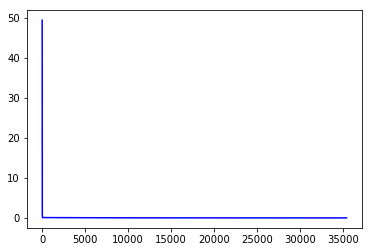

In [34]:
fig = plt.figure()
plt.plot(iters, cost, 'b')
plt.show()

In [20]:
w0, w1, cost, iters = gradient_descent((X10, Y), 0.01)

Current model is: ([ 0.155] + [ 1.196]x1)
Average Squared Error=[ 1.58174452]
Iteration:1
Current model is: ([ 0.129892] + [ 1.0123176]x1)
Average Squared Error=[ 0.12735623]
Iteration:2
Current model is: ([ 0.13247116] + [ 1.0407205]x1)
Average Squared Error=[ 0.09286682]
Iteration:3
Current model is: ([ 0.1307951] + [ 1.03652143]x1)
Average Squared Error=[ 0.09192975]
Iteration:4
Current model is: ([ 0.12977402] + [ 1.03733384]x1)
Average Squared Error=[ 0.09178569]
Iteration:5
Current model is: ([ 0.12865313] + [ 1.03737578]x1)
Average Squared Error=[ 0.09166054]
Iteration:6
Current model is: ([ 0.12754846] + [ 1.03753603]x1)
Average Squared Error=[ 0.091536]
Iteration:7
Current model is: ([ 0.12644216] + [ 1.03767799]x1)
Average Squared Error=[ 0.09141163]
Iteration:8
Current model is: ([ 0.12533697] + [ 1.03782264]x1)
Average Squared Error=[ 0.09128744]
Iteration:9
Current model is: ([ 0.12423248] + [ 1.03796677]x1)
Average Squared Error=[ 0.09116342]
Iteration:10
Current model is

Iteration:91
Current model is: ([ 0.03617277] + [ 1.04946241]x1)
Average Squared Error=[ 0.08154631]
Iteration:92
Current model is: ([ 0.03512887] + [ 1.04959868]x1)
Average Squared Error=[ 0.08143552]
Iteration:93
Current model is: ([ 0.03408569] + [ 1.04973486]x1)
Average Squared Error=[ 0.08132488]
Iteration:94
Current model is: ([ 0.03304322] + [ 1.04987095]x1)
Average Squared Error=[ 0.08121439]
Iteration:95
Current model is: ([ 0.03200145] + [ 1.05000695]x1)
Average Squared Error=[ 0.08110405]
Iteration:96
Current model is: ([ 0.0309604] + [ 1.05014285]x1)
Average Squared Error=[ 0.08099386]
Iteration:97
Current model is: ([ 0.02992005] + [ 1.05027866]x1)
Average Squared Error=[ 0.08088382]
Iteration:98
Current model is: ([ 0.0288804] + [ 1.05041438]x1)
Average Squared Error=[ 0.08077393]
Iteration:99
Current model is: ([ 0.02784147] + [ 1.05055001]x1)
Average Squared Error=[ 0.08066419]
Iteration:100
Current model is: ([ 0.02680324] + [ 1.05068554]x1)
Average Squared Error=[ 0.0

Iteration:180
Current model is: ([-0.05400968] + [ 1.06123515]x1)
Average Squared Error=[ 0.07225285]
Iteration:181
Current model is: ([-0.05499229] + [ 1.06136343]x1)
Average Squared Error=[ 0.07215469]
Iteration:182
Current model is: ([-0.05597423] + [ 1.06149161]x1)
Average Squared Error=[ 0.07205665]
Iteration:183
Current model is: ([-0.05695551] + [ 1.06161971]x1)
Average Squared Error=[ 0.07195876]
Iteration:184
Current model is: ([-0.05793612] + [ 1.06174773]x1)
Average Squared Error=[ 0.07186099]
Iteration:185
Current model is: ([-0.05891606] + [ 1.06187565]x1)
Average Squared Error=[ 0.07176336]
Iteration:186
Current model is: ([-0.05989533] + [ 1.06200349]x1)
Average Squared Error=[ 0.07166586]
Iteration:187
Current model is: ([-0.06087394] + [ 1.06213124]x1)
Average Squared Error=[ 0.07156849]
Iteration:188
Current model is: ([-0.06185189] + [ 1.0622589]x1)
Average Squared Error=[ 0.07147126]
Iteration:189
Current model is: ([-0.06282917] + [ 1.06238648]x1)
Average Squared E

Average Squared Error=[ 0.06358482]
Iteration:275
Current model is: ([-0.14443802] + [ 1.07304]x1)
Average Squared Error=[ 0.06349843]
Iteration:276
Current model is: ([-0.14535918] + [ 1.07316025]x1)
Average Squared Error=[ 0.06341216]
Iteration:277
Current model is: ([-0.14627971] + [ 1.07328042]x1)
Average Squared Error=[ 0.063326]
Iteration:278
Current model is: ([-0.14719962] + [ 1.07340051]x1)
Average Squared Error=[ 0.06323997]
Iteration:279
Current model is: ([-0.1481189] + [ 1.07352051]x1)
Average Squared Error=[ 0.06315405]
Iteration:280
Current model is: ([-0.14903756] + [ 1.07364044]x1)
Average Squared Error=[ 0.06306825]
Iteration:281
Current model is: ([-0.14995559] + [ 1.07376028]x1)
Average Squared Error=[ 0.06298256]
Iteration:282
Current model is: ([-0.150873] + [ 1.07388005]x1)
Average Squared Error=[ 0.06289699]
Iteration:283
Current model is: ([-0.15178979] + [ 1.07399973]x1)
Average Squared Error=[ 0.06281154]
Iteration:284
Current model is: ([-0.15270595] + [ 1.0

Iteration:395
Current model is: ([-0.25062489] + [ 1.08690202]x1)
Average Squared Error=[ 0.05393987]
Iteration:396
Current model is: ([-0.25147389] + [ 1.08701285]x1)
Average Squared Error=[ 0.05386659]
Iteration:397
Current model is: ([-0.25232232] + [ 1.08712361]x1)
Average Squared Error=[ 0.0537934]
Iteration:398
Current model is: ([-0.25317016] + [ 1.08723429]x1)
Average Squared Error=[ 0.05372032]
Iteration:399
Current model is: ([-0.25401743] + [ 1.0873449]x1)
Average Squared Error=[ 0.05364733]
Iteration:400
Current model is: ([-0.25486413] + [ 1.08745543]x1)
Average Squared Error=[ 0.05357445]
Iteration:401
Current model is: ([-0.25571025] + [ 1.08756588]x1)
Average Squared Error=[ 0.05350166]
Iteration:402
Current model is: ([-0.2565558] + [ 1.08767626]x1)
Average Squared Error=[ 0.05342897]
Iteration:403
Current model is: ([-0.25740077] + [ 1.08778657]x1)
Average Squared Error=[ 0.05335638]
Iteration:404
Current model is: ([-0.25824516] + [ 1.0878968]x1)
Average Squared Erro

Iteration:537
Current model is: ([-0.36558632] + [ 1.1019095]x1)
Average Squared Error=[ 0.04447]
Iteration:538
Current model is: ([-0.3663572] + [ 1.10201014]x1)
Average Squared Error=[ 0.04440958]
Iteration:539
Current model is: ([-0.36712756] + [ 1.1021107]x1)
Average Squared Error=[ 0.04434925]
Iteration:540
Current model is: ([-0.36789739] + [ 1.1022112]x1)
Average Squared Error=[ 0.04428899]
Iteration:541
Current model is: ([-0.3686667] + [ 1.10231163]x1)
Average Squared Error=[ 0.04422882]
Iteration:542
Current model is: ([-0.36943549] + [ 1.10241199]x1)
Average Squared Error=[ 0.04416873]
Iteration:543
Current model is: ([-0.37020375] + [ 1.10251228]x1)
Average Squared Error=[ 0.04410872]
Iteration:544
Current model is: ([-0.37097149] + [ 1.1026125]x1)
Average Squared Error=[ 0.04404879]
Iteration:545
Current model is: ([-0.37173872] + [ 1.10271266]x1)
Average Squared Error=[ 0.04398895]
Iteration:546
Current model is: ([-0.37250541] + [ 1.10281275]x1)
Average Squared Error=[ 0

Current model is: ([-0.42636034] + [ 1.10984317]x1)
Average Squared Error=[ 0.03983284]
Iteration:619
Current model is: ([-0.42708992] + [ 1.10993841]x1)
Average Squared Error=[ 0.03977872]
Iteration:620
Current model is: ([-0.42781901] + [ 1.11003359]x1)
Average Squared Error=[ 0.03972468]
Iteration:621
Current model is: ([-0.4285476] + [ 1.1101287]x1)
Average Squared Error=[ 0.03967071]
Iteration:622
Current model is: ([-0.42927569] + [ 1.11022375]x1)
Average Squared Error=[ 0.03961681]
Iteration:623
Current model is: ([-0.43000329] + [ 1.11031873]x1)
Average Squared Error=[ 0.03956299]
Iteration:624
Current model is: ([-0.4307304] + [ 1.11041365]x1)
Average Squared Error=[ 0.03950924]
Iteration:625
Current model is: ([-0.43145701] + [ 1.1105085]x1)
Average Squared Error=[ 0.03945556]
Iteration:626
Current model is: ([-0.43218313] + [ 1.11060329]x1)
Average Squared Error=[ 0.03940195]
Iteration:627
Current model is: ([-0.43290876] + [ 1.11069802]x1)
Average Squared Error=[ 0.03934842

Average Squared Error=[ 0.03288433]
Iteration:760
Current model is: ([-0.52515145] + [ 1.12273972]x1)
Average Squared Error=[ 0.03283965]
Iteration:761
Current model is: ([-0.5258139] + [ 1.1228262]x1)
Average Squared Error=[ 0.03279503]
Iteration:762
Current model is: ([-0.5264759] + [ 1.12291262]x1)
Average Squared Error=[ 0.03275048]
Iteration:763
Current model is: ([-0.52713744] + [ 1.12299898]x1)
Average Squared Error=[ 0.03270598]
Iteration:764
Current model is: ([-0.52779854] + [ 1.12308528]x1)
Average Squared Error=[ 0.03266155]
Iteration:765
Current model is: ([-0.52845919] + [ 1.12317152]x1)
Average Squared Error=[ 0.03261717]
Iteration:766
Current model is: ([-0.5291194] + [ 1.12325771]x1)
Average Squared Error=[ 0.03257286]
Iteration:767
Current model is: ([-0.52977915] + [ 1.12334383]x1)
Average Squared Error=[ 0.0325286]
Iteration:768
Current model is: ([-0.53043845] + [ 1.1234299]x1)
Average Squared Error=[ 0.03248441]
Iteration:769
Current model is: ([-0.53109731] + [ 1

Average Squared Error=[ 0.02232096]
Iteration:1045
Current model is: ([-0.69684542] + [ 1.14515327]x1)
Average Squared Error=[ 0.02229064]
Iteration:1046
Current model is: ([-0.6973912] + [ 1.14522452]x1)
Average Squared Error=[ 0.02226035]
Iteration:1047
Current model is: ([-0.6979366] + [ 1.14529572]x1)
Average Squared Error=[ 0.02223011]
Iteration:1048
Current model is: ([-0.69848164] + [ 1.14536687]x1)
Average Squared Error=[ 0.02219991]
Iteration:1049
Current model is: ([-0.6990263] + [ 1.14543797]x1)
Average Squared Error=[ 0.02216975]
Iteration:1050
Current model is: ([-0.6995706] + [ 1.14550903]x1)
Average Squared Error=[ 0.02213963]
Iteration:1051
Current model is: ([-0.70011452] + [ 1.14558003]x1)
Average Squared Error=[ 0.02210955]
Iteration:1052
Current model is: ([-0.70065807] + [ 1.14565099]x1)
Average Squared Error=[ 0.02207951]
Iteration:1053
Current model is: ([-0.70120126] + [ 1.1457219]x1)
Average Squared Error=[ 0.02204951]
Iteration:1054
Current model is: ([-0.7017

Iteration:1334
Current model is: ([-0.84009678] + [ 1.16385383]x1)
Average Squared Error=[ 0.0150482]
Iteration:1335
Current model is: ([-0.84054522] + [ 1.16391237]x1)
Average Squared Error=[ 0.01502776]
Iteration:1336
Current model is: ([-0.84099334] + [ 1.16397087]x1)
Average Squared Error=[ 0.01500734]
Iteration:1337
Current model is: ([-0.84144116] + [ 1.16402933]x1)
Average Squared Error=[ 0.01498695]
Iteration:1338
Current model is: ([-0.84188868] + [ 1.16408775]x1)
Average Squared Error=[ 0.01496659]
Iteration:1339
Current model is: ([-0.84233589] + [ 1.16414613]x1)
Average Squared Error=[ 0.01494626]
Iteration:1340
Current model is: ([-0.8427828] + [ 1.16420447]x1)
Average Squared Error=[ 0.01492595]
Iteration:1341
Current model is: ([-0.84322941] + [ 1.16426277]x1)
Average Squared Error=[ 0.01490567]
Iteration:1342
Current model is: ([-0.84367571] + [ 1.16432104]x1)
Average Squared Error=[ 0.01488542]
Iteration:1343
Current model is: ([-0.84412171] + [ 1.16437926]x1)
Average 

Current model is: ([-0.95224082] + [ 1.17849352]x1)
Average Squared Error=[ 0.0103682]
Iteration:1609
Current model is: ([-0.95261304] + [ 1.17854211]x1)
Average Squared Error=[ 0.01035412]
Iteration:1610
Current model is: ([-0.95298502] + [ 1.17859067]x1)
Average Squared Error=[ 0.01034005]
Iteration:1611
Current model is: ([-0.95335673] + [ 1.1786392]x1)
Average Squared Error=[ 0.010326]
Iteration:1612
Current model is: ([-0.9537282] + [ 1.17868769]x1)
Average Squared Error=[ 0.01031197]
Iteration:1613
Current model is: ([-0.95409941] + [ 1.17873615]x1)
Average Squared Error=[ 0.01029796]
Iteration:1614
Current model is: ([-0.95447038] + [ 1.17878458]x1)
Average Squared Error=[ 0.01028397]
Iteration:1615
Current model is: ([-0.95484109] + [ 1.17883297]x1)
Average Squared Error=[ 0.01027]
Iteration:1616
Current model is: ([-0.95521154] + [ 1.17888133]x1)
Average Squared Error=[ 0.01025605]
Iteration:1617
Current model is: ([-0.95558175] + [ 1.17892966]x1)
Average Squared Error=[ 0.010

Iteration:1895
Current model is: ([-1.04932734] + [ 1.19116755]x1)
Average Squared Error=[ 0.00701854]
Iteration:1896
Current model is: ([-1.04963359] + [ 1.19120753]x1)
Average Squared Error=[ 0.007009]
Iteration:1897
Current model is: ([-1.04993963] + [ 1.19124748]x1)
Average Squared Error=[ 0.00699948]
Iteration:1898
Current model is: ([-1.05024547] + [ 1.1912874]x1)
Average Squared Error=[ 0.00698997]
Iteration:1899
Current model is: ([-1.05055109] + [ 1.1913273]x1)
Average Squared Error=[ 0.00698047]
Iteration:1900
Current model is: ([-1.05085651] + [ 1.19136717]x1)
Average Squared Error=[ 0.00697099]
Iteration:1901
Current model is: ([-1.05116172] + [ 1.19140702]x1)
Average Squared Error=[ 0.00696152]
Iteration:1902
Current model is: ([-1.05146673] + [ 1.19144683]x1)
Average Squared Error=[ 0.00695206]
Iteration:1903
Current model is: ([-1.05177152] + [ 1.19148662]x1)
Average Squared Error=[ 0.00694262]
Iteration:1904
Current model is: ([-1.05207611] + [ 1.19152638]x1)
Average Sq

Iteration:2133
Current model is: ([-1.11664724] + [ 1.19995573]x1)
Average Squared Error=[ 0.00507834]
Iteration:2134
Current model is: ([-1.11690775] + [ 1.19998974]x1)
Average Squared Error=[ 0.00507144]
Iteration:2135
Current model is: ([-1.11716807] + [ 1.20002373]x1)
Average Squared Error=[ 0.00506455]
Iteration:2136
Current model is: ([-1.11742822] + [ 1.20005769]x1)
Average Squared Error=[ 0.00505767]
Iteration:2137
Current model is: ([-1.1176882] + [ 1.20009162]x1)
Average Squared Error=[ 0.00505079]
Iteration:2138
Current model is: ([-1.11794799] + [ 1.20012554]x1)
Average Squared Error=[ 0.00504393]
Iteration:2139
Current model is: ([-1.11820761] + [ 1.20015943]x1)
Average Squared Error=[ 0.00503708]
Iteration:2140
Current model is: ([-1.11846706] + [ 1.2001933]x1)
Average Squared Error=[ 0.00503024]
Iteration:2141
Current model is: ([-1.11872632] + [ 1.20022714]x1)
Average Squared Error=[ 0.0050234]
Iteration:2142
Current model is: ([-1.11898541] + [ 1.20026097]x1)
Average S

Current model is: ([-1.17079299] + [ 1.20702412]x1)
Average Squared Error=[ 0.00374509]
Iteration:2358
Current model is: ([-1.1710167] + [ 1.20705332]x1)
Average Squared Error=[ 0.00374]
Iteration:2359
Current model is: ([-1.17124026] + [ 1.20708251]x1)
Average Squared Error=[ 0.00373492]
Iteration:2360
Current model is: ([-1.17146367] + [ 1.20711167]x1)
Average Squared Error=[ 0.00372985]
Iteration:2361
Current model is: ([-1.17168692] + [ 1.20714081]x1)
Average Squared Error=[ 0.00372478]
Iteration:2362
Current model is: ([-1.17191002] + [ 1.20716994]x1)
Average Squared Error=[ 0.00371972]
Iteration:2363
Current model is: ([-1.17213297] + [ 1.20719904]x1)
Average Squared Error=[ 0.00371467]
Iteration:2364
Current model is: ([-1.17235577] + [ 1.20722813]x1)
Average Squared Error=[ 0.00370962]
Iteration:2365
Current model is: ([-1.17257842] + [ 1.20725719]x1)
Average Squared Error=[ 0.00370458]
Iteration:2366
Current model is: ([-1.17280092] + [ 1.20728624]x1)
Average Squared Error=[ 0

Current model is: ([-1.21264097] + [ 1.21248711]x1)
Average Squared Error=[ 0.00285347]
Iteration:2558
Current model is: ([-1.21283624] + [ 1.2125126]x1)
Average Squared Error=[ 0.0028496]
Iteration:2559
Current model is: ([-1.21303138] + [ 1.21253807]x1)
Average Squared Error=[ 0.00284573]
Iteration:2560
Current model is: ([-1.21322639] + [ 1.21256353]x1)
Average Squared Error=[ 0.00284186]
Iteration:2561
Current model is: ([-1.21342126] + [ 1.21258897]x1)
Average Squared Error=[ 0.002838]
Iteration:2562
Current model is: ([-1.213616] + [ 1.21261439]x1)
Average Squared Error=[ 0.00283414]
Iteration:2563
Current model is: ([-1.21381061] + [ 1.21263979]x1)
Average Squared Error=[ 0.00283029]
Iteration:2564
Current model is: ([-1.21400509] + [ 1.21266518]x1)
Average Squared Error=[ 0.00282645]
Iteration:2565
Current model is: ([-1.21419944] + [ 1.21269055]x1)
Average Squared Error=[ 0.00282261]
Iteration:2566
Current model is: ([-1.21439365] + [ 1.21271591]x1)
Average Squared Error=[ 0.0

Iteration:2883
Current model is: ([-1.26975894] + [ 1.21994349]x1)
Average Squared Error=[ 0.00183185]
Iteration:2884
Current model is: ([-1.2699154] + [ 1.21996392]x1)
Average Squared Error=[ 0.00182936]
Iteration:2885
Current model is: ([-1.27007175] + [ 1.21998433]x1)
Average Squared Error=[ 0.00182688]
Iteration:2886
Current model is: ([-1.270228] + [ 1.22000473]x1)
Average Squared Error=[ 0.00182439]
Iteration:2887
Current model is: ([-1.27038414] + [ 1.22002511]x1)
Average Squared Error=[ 0.00182191]
Iteration:2888
Current model is: ([-1.27054017] + [ 1.22004548]x1)
Average Squared Error=[ 0.00181944]
Iteration:2889
Current model is: ([-1.2706961] + [ 1.22006583]x1)
Average Squared Error=[ 0.00181697]
Iteration:2890
Current model is: ([-1.27085192] + [ 1.22008617]x1)
Average Squared Error=[ 0.0018145]
Iteration:2891
Current model is: ([-1.27100763] + [ 1.2201065]x1)
Average Squared Error=[ 0.00181203]
Iteration:2892
Current model is: ([-1.27116324] + [ 1.22012682]x1)
Average Squa

Current model is: ([-1.31539821] + [ 1.22590141]x1)
Average Squared Error=[ 0.0011776]
Iteration:3209
Current model is: ([-1.31552365] + [ 1.22591779]x1)
Average Squared Error=[ 0.001176]
Iteration:3210
Current model is: ([-1.31564901] + [ 1.22593415]x1)
Average Squared Error=[ 0.0011744]
Iteration:3211
Current model is: ([-1.31577428] + [ 1.2259505]x1)
Average Squared Error=[ 0.0011728]
Iteration:3212
Current model is: ([-1.31589947] + [ 1.22596685]x1)
Average Squared Error=[ 0.00117121]
Iteration:3213
Current model is: ([-1.31602458] + [ 1.22598318]x1)
Average Squared Error=[ 0.00116962]
Iteration:3214
Current model is: ([-1.31614959] + [ 1.2259995]x1)
Average Squared Error=[ 0.00116803]
Iteration:3215
Current model is: ([-1.31627453] + [ 1.22601581]x1)
Average Squared Error=[ 0.00116644]
Iteration:3216
Current model is: ([-1.31639938] + [ 1.22603211]x1)
Average Squared Error=[ 0.00116486]
Iteration:3217
Current model is: ([-1.31652414] + [ 1.22604839]x1)
Average Squared Error=[ 0.00

Current model is: ([-1.33055137] + [ 1.22787956]x1)
Average Squared Error=[ 0.0009922]
Iteration:3335
Current model is: ([-1.33066652] + [ 1.22789459]x1)
Average Squared Error=[ 0.00099085]
Iteration:3336
Current model is: ([-1.33078159] + [ 1.22790961]x1)
Average Squared Error=[ 0.00098951]
Iteration:3337
Current model is: ([-1.33089658] + [ 1.22792462]x1)
Average Squared Error=[ 0.00098816]
Iteration:3338
Current model is: ([-1.33101149] + [ 1.22793962]x1)
Average Squared Error=[ 0.00098682]
Iteration:3339
Current model is: ([-1.33112632] + [ 1.22795462]x1)
Average Squared Error=[ 0.00098548]
Iteration:3340
Current model is: ([-1.33124108] + [ 1.2279696]x1)
Average Squared Error=[ 0.00098414]
Iteration:3341
Current model is: ([-1.33135576] + [ 1.22798457]x1)
Average Squared Error=[ 0.0009828]
Iteration:3342
Current model is: ([-1.33147036] + [ 1.22799953]x1)
Average Squared Error=[ 0.00098147]
Iteration:3343
Current model is: ([-1.33158488] + [ 1.22801448]x1)
Average Squared Error=[ 

Current model is: ([-1.33995597] + [ 1.22910727]x1)
Average Squared Error=[ 0.00088512]
Iteration:3419
Current model is: ([-1.34006472] + [ 1.22912147]x1)
Average Squared Error=[ 0.00088392]
Iteration:3420
Current model is: ([-1.34017341] + [ 1.22913565]x1)
Average Squared Error=[ 0.00088272]
Iteration:3421
Current model is: ([-1.34028201] + [ 1.22914983]x1)
Average Squared Error=[ 0.00088152]
Iteration:3422
Current model is: ([-1.34039055] + [ 1.229164]x1)
Average Squared Error=[ 0.00088032]
Iteration:3423
Current model is: ([-1.34049901] + [ 1.22917816]x1)
Average Squared Error=[ 0.00087913]
Iteration:3424
Current model is: ([-1.3406074] + [ 1.22919231]x1)
Average Squared Error=[ 0.00087793]
Iteration:3425
Current model is: ([-1.34071571] + [ 1.22920645]x1)
Average Squared Error=[ 0.00087674]
Iteration:3426
Current model is: ([-1.34082395] + [ 1.22922058]x1)
Average Squared Error=[ 0.00087555]
Iteration:3427
Current model is: ([-1.34093212] + [ 1.2292347]x1)
Average Squared Error=[ 0

Current model is: ([-1.35209126] + [ 1.23069145]x1)
Average Squared Error=[ 0.00075598]
Iteration:3535
Current model is: ([-1.35219177] + [ 1.23070457]x1)
Average Squared Error=[ 0.00075496]
Iteration:3536
Current model is: ([-1.35229221] + [ 1.23071769]x1)
Average Squared Error=[ 0.00075393]
Iteration:3537
Current model is: ([-1.35239258] + [ 1.23073079]x1)
Average Squared Error=[ 0.00075291]
Iteration:3538
Current model is: ([-1.35249289] + [ 1.23074388]x1)
Average Squared Error=[ 0.00075188]
Iteration:3539
Current model is: ([-1.35259313] + [ 1.23075697]x1)
Average Squared Error=[ 0.00075086]
Iteration:3540
Current model is: ([-1.35269329] + [ 1.23077005]x1)
Average Squared Error=[ 0.00074984]
Iteration:3541
Current model is: ([-1.3527934] + [ 1.23078311]x1)
Average Squared Error=[ 0.00074882]
Iteration:3542
Current model is: ([-1.35289343] + [ 1.23079617]x1)
Average Squared Error=[ 0.0007478]
Iteration:3543
Current model is: ([-1.35299339] + [ 1.23080922]x1)
Average Squared Error=[

Current model is: ([-1.36506053] + [ 1.23238451]x1)
Average Squared Error=[ 0.00062922]
Iteration:3670
Current model is: ([-1.36515223] + [ 1.23239648]x1)
Average Squared Error=[ 0.00062836]
Iteration:3671
Current model is: ([-1.36524386] + [ 1.23240844]x1)
Average Squared Error=[ 0.00062751]
Iteration:3672
Current model is: ([-1.36533544] + [ 1.2324204]x1)
Average Squared Error=[ 0.00062666]
Iteration:3673
Current model is: ([-1.36542695] + [ 1.23243234]x1)
Average Squared Error=[ 0.00062581]
Iteration:3674
Current model is: ([-1.36551839] + [ 1.23244428]x1)
Average Squared Error=[ 0.00062496]
Iteration:3675
Current model is: ([-1.36560978] + [ 1.23245621]x1)
Average Squared Error=[ 0.00062411]
Iteration:3676
Current model is: ([-1.3657011] + [ 1.23246813]x1)
Average Squared Error=[ 0.00062326]
Iteration:3677
Current model is: ([-1.36579236] + [ 1.23248005]x1)
Average Squared Error=[ 0.00062241]
Iteration:3678
Current model is: ([-1.36588356] + [ 1.23249195]x1)
Average Squared Error=[

Average Squared Error=[ 0.000556]
Iteration:3761
Current model is: ([-1.37324104] + [ 1.23345242]x1)
Average Squared Error=[ 0.00055524]
Iteration:3762
Current model is: ([-1.37332718] + [ 1.23346367]x1)
Average Squared Error=[ 0.00055449]
Iteration:3763
Current model is: ([-1.37341326] + [ 1.23347491]x1)
Average Squared Error=[ 0.00055373]
Iteration:3764
Current model is: ([-1.37349928] + [ 1.23348614]x1)
Average Squared Error=[ 0.00055298]
Iteration:3765
Current model is: ([-1.37358524] + [ 1.23349736]x1)
Average Squared Error=[ 0.00055223]
Iteration:3766
Current model is: ([-1.37367115] + [ 1.23350857]x1)
Average Squared Error=[ 0.00055148]
Iteration:3767
Current model is: ([-1.37375699] + [ 1.23351978]x1)
Average Squared Error=[ 0.00055073]
Iteration:3768
Current model is: ([-1.37384278] + [ 1.23353098]x1)
Average Squared Error=[ 0.00054998]
Iteration:3769
Current model is: ([-1.37392851] + [ 1.23354217]x1)
Average Squared Error=[ 0.00054923]
Iteration:3770
Current model is: ([-1.3

Current model is: ([-1.38490479] + [ 1.23497505]x1)
Average Squared Error=[ 0.00045776]
Iteration:3904
Current model is: ([-1.384983] + [ 1.23498526]x1)
Average Squared Error=[ 0.00045714]
Iteration:3905
Current model is: ([-1.38506116] + [ 1.23499546]x1)
Average Squared Error=[ 0.00045652]
Iteration:3906
Current model is: ([-1.38513926] + [ 1.23500566]x1)
Average Squared Error=[ 0.0004559]
Iteration:3907
Current model is: ([-1.38521732] + [ 1.23501585]x1)
Average Squared Error=[ 0.00045528]
Iteration:3908
Current model is: ([-1.38529532] + [ 1.23502603]x1)
Average Squared Error=[ 0.00045466]
Iteration:3909
Current model is: ([-1.38537326] + [ 1.23503621]x1)
Average Squared Error=[ 0.00045404]
Iteration:3910
Current model is: ([-1.38545116] + [ 1.23504638]x1)
Average Squared Error=[ 0.00045343]
Iteration:3911
Current model is: ([-1.385529] + [ 1.23505654]x1)
Average Squared Error=[ 0.00045281]
Iteration:3912
Current model is: ([-1.38560678] + [ 1.23506669]x1)
Average Squared Error=[ 0.

Current model is: ([-1.39173518] + [ 1.23586672]x1)
Average Squared Error=[ 0.00040504]
Iteration:3994
Current model is: ([-1.39180875] + [ 1.23587632]x1)
Average Squared Error=[ 0.00040449]
Iteration:3995
Current model is: ([-1.39188227] + [ 1.23588592]x1)
Average Squared Error=[ 0.00040394]
Iteration:3996
Current model is: ([-1.39195574] + [ 1.23589551]x1)
Average Squared Error=[ 0.00040339]
Iteration:3997
Current model is: ([-1.39202916] + [ 1.23590509]x1)
Average Squared Error=[ 0.00040284]
Iteration:3998
Current model is: ([-1.39210253] + [ 1.23591467]x1)
Average Squared Error=[ 0.0004023]
Iteration:3999
Current model is: ([-1.39217585] + [ 1.23592424]x1)
Average Squared Error=[ 0.00040175]
Iteration:4000
Current model is: ([-1.39224912] + [ 1.23593381]x1)
Average Squared Error=[ 0.0004012]
Iteration:4001
Current model is: ([-1.39232234] + [ 1.23594337]x1)
Average Squared Error=[ 0.00040066]
Iteration:4002
Current model is: ([-1.39239552] + [ 1.23595292]x1)
Average Squared Error=[

Current model is: ([-1.397744] + [ 1.23665113]x1)
Average Squared Error=[ 0.00036133]
Iteration:4078
Current model is: ([-1.39781349] + [ 1.2366602]x1)
Average Squared Error=[ 0.00036084]
Iteration:4079
Current model is: ([-1.39788293] + [ 1.23666927]x1)
Average Squared Error=[ 0.00036035]
Iteration:4080
Current model is: ([-1.39795232] + [ 1.23667832]x1)
Average Squared Error=[ 0.00035986]
Iteration:4081
Current model is: ([-1.39802167] + [ 1.23668738]x1)
Average Squared Error=[ 0.00035937]
Iteration:4082
Current model is: ([-1.39809097] + [ 1.23669642]x1)
Average Squared Error=[ 0.00035888]
Iteration:4083
Current model is: ([-1.39816022] + [ 1.23670546]x1)
Average Squared Error=[ 0.00035839]
Iteration:4084
Current model is: ([-1.39822942] + [ 1.2367145]x1)
Average Squared Error=[ 0.00035791]
Iteration:4085
Current model is: ([-1.39829858] + [ 1.23672353]x1)
Average Squared Error=[ 0.00035742]
Iteration:4086
Current model is: ([-1.39836769] + [ 1.23673255]x1)
Average Squared Error=[ 0

Average Squared Error=[ 0.00030362]
Iteration:4206
Current model is: ([-1.40632898] + [ 1.23777184]x1)
Average Squared Error=[ 0.0003032]
Iteration:4207
Current model is: ([-1.40639263] + [ 1.23778015]x1)
Average Squared Error=[ 0.00030279]
Iteration:4208
Current model is: ([-1.40645624] + [ 1.23778846]x1)
Average Squared Error=[ 0.00030238]
Iteration:4209
Current model is: ([-1.40651981] + [ 1.23779675]x1)
Average Squared Error=[ 0.00030197]
Iteration:4210
Current model is: ([-1.40658333] + [ 1.23780505]x1)
Average Squared Error=[ 0.00030156]
Iteration:4211
Current model is: ([-1.40664681] + [ 1.23781333]x1)
Average Squared Error=[ 0.00030115]
Iteration:4212
Current model is: ([-1.40671025] + [ 1.23782162]x1)
Average Squared Error=[ 0.00030074]
Iteration:4213
Current model is: ([-1.40677364] + [ 1.23782989]x1)
Average Squared Error=[ 0.00030033]
Iteration:4214
Current model is: ([-1.40683699] + [ 1.23783816]x1)
Average Squared Error=[ 0.00029992]
Iteration:4215
Current model is: ([-1.

Current model is: ([-1.41290031] + [ 1.23862969]x1)
Average Squared Error=[ 0.00026215]
Iteration:4314
Current model is: ([-1.4129595] + [ 1.23863742]x1)
Average Squared Error=[ 0.0002618]
Iteration:4315
Current model is: ([-1.41301864] + [ 1.23864514]x1)
Average Squared Error=[ 0.00026144]
Iteration:4316
Current model is: ([-1.41307775] + [ 1.23865285]x1)
Average Squared Error=[ 0.00026109]
Iteration:4317
Current model is: ([-1.41313682] + [ 1.23866056]x1)
Average Squared Error=[ 0.00026073]
Iteration:4318
Current model is: ([-1.41319585] + [ 1.23866827]x1)
Average Squared Error=[ 0.00026038]
Iteration:4319
Current model is: ([-1.41325483] + [ 1.23867597]x1)
Average Squared Error=[ 0.00026002]
Iteration:4320
Current model is: ([-1.41331378] + [ 1.23868366]x1)
Average Squared Error=[ 0.00025967]
Iteration:4321
Current model is: ([-1.41337269] + [ 1.23869135]x1)
Average Squared Error=[ 0.00025932]
Iteration:4322
Current model is: ([-1.41343155] + [ 1.23869904]x1)
Average Squared Error=[

Average Squared Error=[ 0.00021672]
Iteration:4454
Current model is: ([-1.42086102] + [ 1.23966891]x1)
Average Squared Error=[ 0.00021642]
Iteration:4455
Current model is: ([-1.4209148] + [ 1.23967593]x1)
Average Squared Error=[ 0.00021613]
Iteration:4456
Current model is: ([-1.42096854] + [ 1.23968295]x1)
Average Squared Error=[ 0.00021584]
Iteration:4457
Current model is: ([-1.42102225] + [ 1.23968996]x1)
Average Squared Error=[ 0.00021554]
Iteration:4458
Current model is: ([-1.42107592] + [ 1.23969696]x1)
Average Squared Error=[ 0.00021525]
Iteration:4459
Current model is: ([-1.42112955] + [ 1.23970396]x1)
Average Squared Error=[ 0.00021496]
Iteration:4460
Current model is: ([-1.42118314] + [ 1.23971096]x1)
Average Squared Error=[ 0.00021467]
Iteration:4461
Current model is: ([-1.4212367] + [ 1.23971795]x1)
Average Squared Error=[ 0.00021437]
Iteration:4462
Current model is: ([-1.42129023] + [ 1.23972494]x1)
Average Squared Error=[ 0.00021408]
Iteration:4463
Current model is: ([-1.4

Current model is: ([-1.42691141] + [ 1.24045875]x1)
Average Squared Error=[ 0.0001846]
Iteration:4572
Current model is: ([-1.42696108] + [ 1.24046523]x1)
Average Squared Error=[ 0.00018435]
Iteration:4573
Current model is: ([-1.42701071] + [ 1.24047171]x1)
Average Squared Error=[ 0.0001841]
Iteration:4574
Current model is: ([-1.42706031] + [ 1.24047819]x1)
Average Squared Error=[ 0.00018385]
Iteration:4575
Current model is: ([-1.42710988] + [ 1.24048466]x1)
Average Squared Error=[ 0.0001836]
Iteration:4576
Current model is: ([-1.42715941] + [ 1.24049112]x1)
Average Squared Error=[ 0.00018335]
Iteration:4577
Current model is: ([-1.42720891] + [ 1.24049759]x1)
Average Squared Error=[ 0.0001831]
Iteration:4578
Current model is: ([-1.42725837] + [ 1.24050404]x1)
Average Squared Error=[ 0.00018285]
Iteration:4579
Current model is: ([-1.4273078] + [ 1.2405105]x1)
Average Squared Error=[ 0.0001826]
Iteration:4580
Current model is: ([-1.4273572] + [ 1.24051694]x1)
Average Squared Error=[ 0.000

Average Squared Error=[ 0.00016356]
Iteration:4661
Current model is: ([-1.4312489] + [ 1.24102498]x1)
Average Squared Error=[ 0.00016334]
Iteration:4662
Current model is: ([-1.43129562] + [ 1.24103108]x1)
Average Squared Error=[ 0.00016311]
Iteration:4663
Current model is: ([-1.4313423] + [ 1.24103717]x1)
Average Squared Error=[ 0.00016289]
Iteration:4664
Current model is: ([-1.43138896] + [ 1.24104326]x1)
Average Squared Error=[ 0.00016267]
Iteration:4665
Current model is: ([-1.43143558] + [ 1.24104935]x1)
Average Squared Error=[ 0.00016245]
Iteration:4666
Current model is: ([-1.43148218] + [ 1.24105543]x1)
Average Squared Error=[ 0.00016223]
Iteration:4667
Current model is: ([-1.43152874] + [ 1.24106151]x1)
Average Squared Error=[ 0.00016201]
Iteration:4668
Current model is: ([-1.43157526] + [ 1.24106759]x1)
Average Squared Error=[ 0.00016179]
Iteration:4669
Current model is: ([-1.43162176] + [ 1.24107366]x1)
Average Squared Error=[ 0.00016157]
Iteration:4670
Current model is: ([-1.4

Average Squared Error=[ 0.0001397]
Iteration:4777
Current model is: ([-1.43646193] + [ 1.24170551]x1)
Average Squared Error=[ 0.00013951]
Iteration:4778
Current model is: ([-1.43650511] + [ 1.24171115]x1)
Average Squared Error=[ 0.00013932]
Iteration:4779
Current model is: ([-1.43654825] + [ 1.24171678]x1)
Average Squared Error=[ 0.00013913]
Iteration:4780
Current model is: ([-1.43659137] + [ 1.24172241]x1)
Average Squared Error=[ 0.00013894]
Iteration:4781
Current model is: ([-1.43663446] + [ 1.24172803]x1)
Average Squared Error=[ 0.00013875]
Iteration:4782
Current model is: ([-1.43667752] + [ 1.24173365]x1)
Average Squared Error=[ 0.00013856]
Iteration:4783
Current model is: ([-1.43672055] + [ 1.24173927]x1)
Average Squared Error=[ 0.00013837]
Iteration:4784
Current model is: ([-1.43676355] + [ 1.24174488]x1)
Average Squared Error=[ 0.00013818]
Iteration:4785
Current model is: ([-1.43680652] + [ 1.24175049]x1)
Average Squared Error=[ 0.000138]
Iteration:4786
Current model is: ([-1.43

Iteration:4871
Current model is: ([-1.44039492] + [ 1.24221894]x1)
Average Squared Error=[ 0.00012277]
Iteration:4872
Current model is: ([-1.44043543] + [ 1.24222422]x1)
Average Squared Error=[ 0.0001226]
Iteration:4873
Current model is: ([-1.44047591] + [ 1.24222951]x1)
Average Squared Error=[ 0.00012244]
Iteration:4874
Current model is: ([-1.44051635] + [ 1.24223479]x1)
Average Squared Error=[ 0.00012227]
Iteration:4875
Current model is: ([-1.44055678] + [ 1.24224006]x1)
Average Squared Error=[ 0.0001221]
Iteration:4876
Current model is: ([-1.44059717] + [ 1.24224534]x1)
Average Squared Error=[ 0.00012194]
Iteration:4877
Current model is: ([-1.44063754] + [ 1.24225061]x1)
Average Squared Error=[ 0.00012177]
Iteration:4878
Current model is: ([-1.44067788] + [ 1.24225587]x1)
Average Squared Error=[ 0.00012161]
Iteration:4879
Current model is: ([-1.44071819] + [ 1.24226114]x1)
Average Squared Error=[ 0.00012144]
Iteration:4880
Current model is: ([-1.44075847] + [ 1.2422664]x1)
Average S

Current model is: ([-1.44366479] + [ 1.2426458]x1)
Average Squared Error=[ 0.00010967]
Iteration:4955
Current model is: ([-1.44370308] + [ 1.24265079]x1)
Average Squared Error=[ 0.00010952]
Iteration:4956
Current model is: ([-1.44374133] + [ 1.24265579]x1)
Average Squared Error=[ 0.00010937]
Iteration:4957
Current model is: ([-1.44377956] + [ 1.24266078]x1)
Average Squared Error=[ 0.00010922]
Iteration:4958
Current model is: ([-1.44381777] + [ 1.24266577]x1)
Average Squared Error=[ 0.00010907]
Iteration:4959
Current model is: ([-1.44385594] + [ 1.24267075]x1)
Average Squared Error=[ 0.00010893]
Iteration:4960
Current model is: ([-1.4438941] + [ 1.24267573]x1)
Average Squared Error=[ 0.00010878]
Iteration:4961
Current model is: ([-1.44393222] + [ 1.24268071]x1)
Average Squared Error=[ 0.00010863]
Iteration:4962
Current model is: ([-1.44397032] + [ 1.24268568]x1)
Average Squared Error=[ 0.00010848]
Iteration:4963
Current model is: ([-1.4440084] + [ 1.24269065]x1)
Average Squared Error=[ 

Average Squared Error=[  9.35410537e-05]
Iteration:5072
Current model is: ([-1.44800713] + [ 1.24321266]x1)
Average Squared Error=[  9.34139670e-05]
Iteration:5073
Current model is: ([-1.44804246] + [ 1.24321727]x1)
Average Squared Error=[  9.32870529e-05]
Iteration:5074
Current model is: ([-1.44807777] + [ 1.24322188]x1)
Average Squared Error=[  9.31603113e-05]
Iteration:5075
Current model is: ([-1.44811305] + [ 1.24322649]x1)
Average Squared Error=[  9.30337419e-05]
Iteration:5076
Current model is: ([-1.44814831] + [ 1.24323109]x1)
Average Squared Error=[  9.29073444e-05]
Iteration:5077
Current model is: ([-1.44818354] + [ 1.24323569]x1)
Average Squared Error=[  9.27811187e-05]
Iteration:5078
Current model is: ([-1.44821876] + [ 1.24324029]x1)
Average Squared Error=[  9.26550644e-05]
Iteration:5079
Current model is: ([-1.44825394] + [ 1.24324488]x1)
Average Squared Error=[  9.25291815e-05]
Iteration:5080
Current model is: ([-1.44828911] + [ 1.24324947]x1)
Average Squared Error=[  9.2

Average Squared Error=[  7.82806335e-05]
Iteration:5203
Current model is: ([-1.45243693] + [ 1.24379094]x1)
Average Squared Error=[  7.81742799e-05]
Iteration:5204
Current model is: ([-1.45246926] + [ 1.24379516]x1)
Average Squared Error=[  7.80680708e-05]
Iteration:5205
Current model is: ([-1.45250155] + [ 1.24379938]x1)
Average Squared Error=[  7.79620060e-05]
Iteration:5206
Current model is: ([-1.45253383] + [ 1.24380359]x1)
Average Squared Error=[  7.78560853e-05]
Iteration:5207
Current model is: ([-1.45256609] + [ 1.2438078]x1)
Average Squared Error=[  7.77503085e-05]
Iteration:5208
Current model is: ([-1.45259832] + [ 1.24381201]x1)
Average Squared Error=[  7.76446754e-05]
Iteration:5209
Current model is: ([-1.45263053] + [ 1.24381622]x1)
Average Squared Error=[  7.75391858e-05]
Iteration:5210
Current model is: ([-1.45266272] + [ 1.24382042]x1)
Average Squared Error=[  7.74338395e-05]
Iteration:5211
Current model is: ([-1.45269489] + [ 1.24382462]x1)
Average Squared Error=[  7.73

Current model is: ([-1.45678409] + [ 1.24435844]x1)
Average Squared Error=[  6.45374114e-05]
Iteration:5345
Current model is: ([-1.45681346] + [ 1.24436227]x1)
Average Squared Error=[  6.44497296e-05]
Iteration:5346
Current model is: ([-1.4568428] + [ 1.2443661]x1)
Average Squared Error=[  6.43621669e-05]
Iteration:5347
Current model is: ([-1.45687213] + [ 1.24436993]x1)
Average Squared Error=[  6.42747232e-05]
Iteration:5348
Current model is: ([-1.45690144] + [ 1.24437376]x1)
Average Squared Error=[  6.41873983e-05]
Iteration:5349
Current model is: ([-1.45693073] + [ 1.24437758]x1)
Average Squared Error=[  6.41001921e-05]
Iteration:5350
Current model is: ([-1.45695999] + [ 1.2443814]x1)
Average Squared Error=[  6.40131043e-05]
Iteration:5351
Current model is: ([-1.45698924] + [ 1.24438522]x1)
Average Squared Error=[  6.39261348e-05]
Iteration:5352
Current model is: ([-1.45701847] + [ 1.24438903]x1)
Average Squared Error=[  6.38392835e-05]
Iteration:5353
Current model is: ([-1.45704768

Current model is: ([-1.46006092] + [ 1.24478621]x1)
Average Squared Error=[  5.51214011e-05]
Iteration:5461
Current model is: ([-1.46008806] + [ 1.24478975]x1)
Average Squared Error=[  5.50465121e-05]
Iteration:5462
Current model is: ([-1.46011519] + [ 1.24479329]x1)
Average Squared Error=[  5.49717248e-05]
Iteration:5463
Current model is: ([-1.46014229] + [ 1.24479683]x1)
Average Squared Error=[  5.48970392e-05]
Iteration:5464
Current model is: ([-1.46016937] + [ 1.24480036]x1)
Average Squared Error=[  5.48224550e-05]
Iteration:5465
Current model is: ([-1.46019644] + [ 1.2448039]x1)
Average Squared Error=[  5.47479721e-05]
Iteration:5466
Current model is: ([-1.46022349] + [ 1.24480743]x1)
Average Squared Error=[  5.46735905e-05]
Iteration:5467
Current model is: ([-1.46025052] + [ 1.24481096]x1)
Average Squared Error=[  5.45993098e-05]
Iteration:5468
Current model is: ([-1.46027753] + [ 1.24481448]x1)
Average Squared Error=[  5.45251301e-05]
Iteration:5469
Current model is: ([-1.460304

Average Squared Error=[  4.88394646e-05]
Iteration:5550
Current model is: ([-1.46243113] + [ 1.24509562]x1)
Average Squared Error=[  4.87731103e-05]
Iteration:5551
Current model is: ([-1.46245666] + [ 1.24509896]x1)
Average Squared Error=[  4.87068462e-05]
Iteration:5552
Current model is: ([-1.46248217] + [ 1.24510229]x1)
Average Squared Error=[  4.86406721e-05]
Iteration:5553
Current model is: ([-1.46250767] + [ 1.24510561]x1)
Average Squared Error=[  4.85745880e-05]
Iteration:5554
Current model is: ([-1.46253315] + [ 1.24510894]x1)
Average Squared Error=[  4.85085936e-05]
Iteration:5555
Current model is: ([-1.46255861] + [ 1.24511226]x1)
Average Squared Error=[  4.84426888e-05]
Iteration:5556
Current model is: ([-1.46258405] + [ 1.24511559]x1)
Average Squared Error=[  4.83768737e-05]
Iteration:5557
Current model is: ([-1.46260947] + [ 1.2451189]x1)
Average Squared Error=[  4.83111479e-05]
Iteration:5558
Current model is: ([-1.46263488] + [ 1.24512222]x1)
Average Squared Error=[  4.82

Average Squared Error=[  4.26311134e-05]
Iteration:5650
Current model is: ([-1.46490009] + [ 1.24541793]x1)
Average Squared Error=[  4.25731940e-05]
Iteration:5651
Current model is: ([-1.46492394] + [ 1.24542104]x1)
Average Squared Error=[  4.25153532e-05]
Iteration:5652
Current model is: ([-1.46494778] + [ 1.24542416]x1)
Average Squared Error=[  4.24575910e-05]
Iteration:5653
Current model is: ([-1.4649716] + [ 1.24542726]x1)
Average Squared Error=[  4.23999073e-05]
Iteration:5654
Current model is: ([-1.4649954] + [ 1.24543037]x1)
Average Squared Error=[  4.23423019e-05]
Iteration:5655
Current model is: ([-1.46501919] + [ 1.24543348]x1)
Average Squared Error=[  4.22847749e-05]
Iteration:5656
Current model is: ([-1.46504296] + [ 1.24543658]x1)
Average Squared Error=[  4.22273259e-05]
Iteration:5657
Current model is: ([-1.46506671] + [ 1.24543968]x1)
Average Squared Error=[  4.21699551e-05]
Iteration:5658
Current model is: ([-1.46509045] + [ 1.24544278]x1)
Average Squared Error=[  4.211

Current model is: ([-1.46808645] + [ 1.24583389]x1)
Average Squared Error=[  3.51944618e-05]
Iteration:5791
Current model is: ([-1.46810814] + [ 1.24583672]x1)
Average Squared Error=[  3.51466459e-05]
Iteration:5792
Current model is: ([-1.46812981] + [ 1.24583955]x1)
Average Squared Error=[  3.50988950e-05]
Iteration:5793
Current model is: ([-1.46815147] + [ 1.24584238]x1)
Average Squared Error=[  3.50512089e-05]
Iteration:5794
Current model is: ([-1.46817311] + [ 1.2458452]x1)
Average Squared Error=[  3.50035876e-05]
Iteration:5795
Current model is: ([-1.46819474] + [ 1.24584803]x1)
Average Squared Error=[  3.49560311e-05]
Iteration:5796
Current model is: ([-1.46821635] + [ 1.24585085]x1)
Average Squared Error=[  3.49085391e-05]
Iteration:5797
Current model is: ([-1.46823795] + [ 1.24585367]x1)
Average Squared Error=[  3.48611117e-05]
Iteration:5798
Current model is: ([-1.46825953] + [ 1.24585648]x1)
Average Squared Error=[  3.48137487e-05]
Iteration:5799
Current model is: ([-1.468281

Average Squared Error=[  2.92532546e-05]
Iteration:5927
Current model is: ([-1.47092433] + [ 1.24620436]x1)
Average Squared Error=[  2.92135105e-05]
Iteration:5928
Current model is: ([-1.47094409] + [ 1.24620694]x1)
Average Squared Error=[  2.91738205e-05]
Iteration:5929
Current model is: ([-1.47096383] + [ 1.24620951]x1)
Average Squared Error=[  2.91341844e-05]
Iteration:5930
Current model is: ([-1.47098356] + [ 1.24621209]x1)
Average Squared Error=[  2.90946021e-05]
Iteration:5931
Current model is: ([-1.47100328] + [ 1.24621466]x1)
Average Squared Error=[  2.90550736e-05]
Iteration:5932
Current model is: ([-1.47102298] + [ 1.24621723]x1)
Average Squared Error=[  2.90155988e-05]
Iteration:5933
Current model is: ([-1.47104267] + [ 1.24621981]x1)
Average Squared Error=[  2.89761776e-05]
Iteration:5934
Current model is: ([-1.47106235] + [ 1.24622237]x1)
Average Squared Error=[  2.89368100e-05]
Iteration:5935
Current model is: ([-1.47108202] + [ 1.24622494]x1)
Average Squared Error=[  2.8

Iteration:6008
Current model is: ([-1.472482] + [ 1.2464077]x1)
Average Squared Error=[  2.61672408e-05]
Iteration:6009
Current model is: ([-1.4725007] + [ 1.24641014]x1)
Average Squared Error=[  2.61316895e-05]
Iteration:6010
Current model is: ([-1.47251939] + [ 1.24641258]x1)
Average Squared Error=[  2.60961865e-05]
Iteration:6011
Current model is: ([-1.47253806] + [ 1.24641502]x1)
Average Squared Error=[  2.60607317e-05]
Iteration:6012
Current model is: ([-1.47255672] + [ 1.24641745]x1)
Average Squared Error=[  2.60253251e-05]
Iteration:6013
Current model is: ([-1.47257537] + [ 1.24641989]x1)
Average Squared Error=[  2.59899666e-05]
Iteration:6014
Current model is: ([-1.47259401] + [ 1.24642232]x1)
Average Squared Error=[  2.59546561e-05]
Iteration:6015
Current model is: ([-1.47261263] + [ 1.24642475]x1)
Average Squared Error=[  2.59193936e-05]
Iteration:6016
Current model is: ([-1.47263124] + [ 1.24642718]x1)
Average Squared Error=[  2.58841790e-05]
Iteration:6017
Current model is:

Average Squared Error=[  2.31850789e-05]
Iteration:6098
Current model is: ([-1.47411507] + [ 1.24662089]x1)
Average Squared Error=[  2.31535792e-05]
Iteration:6099
Current model is: ([-1.47413266] + [ 1.24662318]x1)
Average Squared Error=[  2.31221223e-05]
Iteration:6100
Current model is: ([-1.47415024] + [ 1.24662548]x1)
Average Squared Error=[  2.30907081e-05]
Iteration:6101
Current model is: ([-1.47416781] + [ 1.24662777]x1)
Average Squared Error=[  2.30593366e-05]
Iteration:6102
Current model is: ([-1.47418536] + [ 1.24663006]x1)
Average Squared Error=[  2.30280077e-05]
Iteration:6103
Current model is: ([-1.4742029] + [ 1.24663235]x1)
Average Squared Error=[  2.29967214e-05]
Iteration:6104
Current model is: ([-1.47422043] + [ 1.24663464]x1)
Average Squared Error=[  2.29654776e-05]
Iteration:6105
Current model is: ([-1.47423795] + [ 1.24663693]x1)
Average Squared Error=[  2.29342763e-05]
Iteration:6106
Current model is: ([-1.47425546] + [ 1.24663921]x1)
Average Squared Error=[  2.29

Average Squared Error=[  1.90627215e-05]
Iteration:6242
Current model is: ([-1.47652881] + [ 1.24693599]x1)
Average Squared Error=[  1.90368225e-05]
Iteration:6243
Current model is: ([-1.47654476] + [ 1.24693807]x1)
Average Squared Error=[  1.90109587e-05]
Iteration:6244
Current model is: ([-1.4765607] + [ 1.24694015]x1)
Average Squared Error=[  1.89851301e-05]
Iteration:6245
Current model is: ([-1.47657663] + [ 1.24694223]x1)
Average Squared Error=[  1.89593365e-05]
Iteration:6246
Current model is: ([-1.47659254] + [ 1.24694431]x1)
Average Squared Error=[  1.89335780e-05]
Iteration:6247
Current model is: ([-1.47660845] + [ 1.24694638]x1)
Average Squared Error=[  1.89078544e-05]
Iteration:6248
Current model is: ([-1.47662434] + [ 1.24694846]x1)
Average Squared Error=[  1.88821658e-05]
Iteration:6249
Current model is: ([-1.47664023] + [ 1.24695053]x1)
Average Squared Error=[  1.88565122e-05]
Iteration:6250
Current model is: ([-1.4766561] + [ 1.2469526]x1)
Average Squared Error=[  1.8830

Average Squared Error=[  1.67530118e-05]
Iteration:6337
Current model is: ([-1.47799663] + [ 1.2471276]x1)
Average Squared Error=[  1.67302509e-05]
Iteration:6338
Current model is: ([-1.47801159] + [ 1.24712955]x1)
Average Squared Error=[  1.67075208e-05]
Iteration:6339
Current model is: ([-1.47802653] + [ 1.2471315]x1)
Average Squared Error=[  1.66848217e-05]
Iteration:6340
Current model is: ([-1.47804146] + [ 1.24713345]x1)
Average Squared Error=[  1.66621533e-05]
Iteration:6341
Current model is: ([-1.47805638] + [ 1.2471354]x1)
Average Squared Error=[  1.66395158e-05]
Iteration:6342
Current model is: ([-1.47807129] + [ 1.24713735]x1)
Average Squared Error=[  1.66169090e-05]
Iteration:6343
Current model is: ([-1.47808619] + [ 1.24713929]x1)
Average Squared Error=[  1.65943330e-05]
Iteration:6344
Current model is: ([-1.47810109] + [ 1.24714124]x1)
Average Squared Error=[  1.65717876e-05]
Iteration:6345
Current model is: ([-1.47811597] + [ 1.24714318]x1)
Average Squared Error=[  1.6549

Iteration:6432
Current model is: ([-1.47937267] + [ 1.24730723]x1)
Average Squared Error=[  1.47031520e-05]
Iteration:6433
Current model is: ([-1.47938668] + [ 1.24730906]x1)
Average Squared Error=[  1.46831760e-05]
Iteration:6434
Current model is: ([-1.47940069] + [ 1.24731089]x1)
Average Squared Error=[  1.46632271e-05]
Iteration:6435
Current model is: ([-1.47941469] + [ 1.24731272]x1)
Average Squared Error=[  1.46433054e-05]
Iteration:6436
Current model is: ([-1.47942868] + [ 1.24731454]x1)
Average Squared Error=[  1.46234107e-05]
Iteration:6437
Current model is: ([-1.47944266] + [ 1.24731637]x1)
Average Squared Error=[  1.46035430e-05]
Iteration:6438
Current model is: ([-1.47945663] + [ 1.24731819]x1)
Average Squared Error=[  1.45837024e-05]
Iteration:6439
Current model is: ([-1.47947059] + [ 1.24732002]x1)
Average Squared Error=[  1.45638887e-05]
Iteration:6440
Current model is: ([-1.47948454] + [ 1.24732184]x1)
Average Squared Error=[  1.45441019e-05]
Iteration:6441
Current model

Current model is: ([-1.48076752] + [ 1.24748932]x1)
Average Squared Error=[  1.27818849e-05]
Iteration:6536
Current model is: ([-1.48078059] + [ 1.24749103]x1)
Average Squared Error=[  1.27645191e-05]
Iteration:6537
Current model is: ([-1.48079365] + [ 1.24749273]x1)
Average Squared Error=[  1.27471770e-05]
Iteration:6538
Current model is: ([-1.4808067] + [ 1.24749444]x1)
Average Squared Error=[  1.27298584e-05]
Iteration:6539
Current model is: ([-1.48081974] + [ 1.24749614]x1)
Average Squared Error=[  1.27125634e-05]
Iteration:6540
Current model is: ([-1.48083278] + [ 1.24749784]x1)
Average Squared Error=[  1.26952919e-05]
Iteration:6541
Current model is: ([-1.4808458] + [ 1.24749954]x1)
Average Squared Error=[  1.26780438e-05]
Iteration:6542
Current model is: ([-1.48085882] + [ 1.24750124]x1)
Average Squared Error=[  1.26608192e-05]
Iteration:6543
Current model is: ([-1.48087182] + [ 1.24750294]x1)
Average Squared Error=[  1.26436179e-05]
Iteration:6544
Current model is: ([-1.4808848

Iteration:6661
Current model is: ([-1.48234623] + [ 1.24769541]x1)
Average Squared Error=[  1.07695904e-05]
Iteration:6662
Current model is: ([-1.48235823] + [ 1.24769698]x1)
Average Squared Error=[  1.07549586e-05]
Iteration:6663
Current model is: ([-1.48237021] + [ 1.24769854]x1)
Average Squared Error=[  1.07403467e-05]
Iteration:6664
Current model is: ([-1.48238219] + [ 1.24770011]x1)
Average Squared Error=[  1.07257547e-05]
Iteration:6665
Current model is: ([-1.48239417] + [ 1.24770167]x1)
Average Squared Error=[  1.07111825e-05]
Iteration:6666
Current model is: ([-1.48240613] + [ 1.24770323]x1)
Average Squared Error=[  1.06966300e-05]
Iteration:6667
Current model is: ([-1.48241809] + [ 1.24770479]x1)
Average Squared Error=[  1.06820974e-05]
Iteration:6668
Current model is: ([-1.48243003] + [ 1.24770635]x1)
Average Squared Error=[  1.06675845e-05]
Iteration:6669
Current model is: ([-1.48244197] + [ 1.24770791]x1)
Average Squared Error=[  1.06530913e-05]
Iteration:6670
Current model

Current model is: ([-1.48405758] + [ 1.24791882]x1)
Average Squared Error=[  8.78279727e-06]
Iteration:6812
Current model is: ([-1.48406841] + [ 1.24792023]x1)
Average Squared Error=[  8.77086479e-06]
Iteration:6813
Current model is: ([-1.48407924] + [ 1.24792165]x1)
Average Squared Error=[  8.75894852e-06]
Iteration:6814
Current model is: ([-1.48409006] + [ 1.24792306]x1)
Average Squared Error=[  8.74704845e-06]
Iteration:6815
Current model is: ([-1.48410087] + [ 1.24792447]x1)
Average Squared Error=[  8.73516453e-06]
Iteration:6816
Current model is: ([-1.48411167] + [ 1.24792588]x1)
Average Squared Error=[  8.72329677e-06]
Iteration:6817
Current model is: ([-1.48412247] + [ 1.24792729]x1)
Average Squared Error=[  8.71144513e-06]
Iteration:6818
Current model is: ([-1.48413326] + [ 1.2479287]x1)
Average Squared Error=[  8.69960959e-06]
Iteration:6819
Current model is: ([-1.48414404] + [ 1.24793011]x1)
Average Squared Error=[  8.68779013e-06]
Iteration:6820
Current model is: ([-1.484154

Current model is: ([-1.48491166] + [ 1.24803031]x1)
Average Squared Error=[  7.86696180e-06]
Iteration:6893
Current model is: ([-1.48492191] + [ 1.24803165]x1)
Average Squared Error=[  7.85627359e-06]
Iteration:6894
Current model is: ([-1.48493216] + [ 1.24803299]x1)
Average Squared Error=[  7.84559991e-06]
Iteration:6895
Current model is: ([-1.4849424] + [ 1.24803433]x1)
Average Squared Error=[  7.83494072e-06]
Iteration:6896
Current model is: ([-1.48495263] + [ 1.24803566]x1)
Average Squared Error=[  7.82429602e-06]
Iteration:6897
Current model is: ([-1.48496286] + [ 1.248037]x1)
Average Squared Error=[  7.81366578e-06]
Iteration:6898
Current model is: ([-1.48497308] + [ 1.24803833]x1)
Average Squared Error=[  7.80304998e-06]
Iteration:6899
Current model is: ([-1.48498329] + [ 1.24803966]x1)
Average Squared Error=[  7.79244860e-06]
Iteration:6900
Current model is: ([-1.48499349] + [ 1.248041]x1)
Average Squared Error=[  7.78186163e-06]
Iteration:6901
Current model is: ([-1.48500369] 

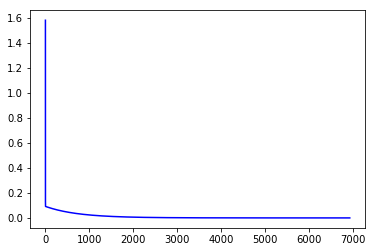

In [21]:
fig = plt.figure()
plt.plot(iters, cost, 'b')
plt.show()

In [22]:
w0, w1, cost, iters = gradient_descent((X10, Y), 0.1)

Current model is: ([ 1.55] + [ 11.96]x1)
Average Squared Error=[ 6998.768452]
Iteration:1
Current model is: ([-14.9108] + [-114.04824]x1)
Average Squared Error=[ 777081.9906075]
Iteration:2
Current model is: ([ 158.4127552] + [ 1213.74297856]x1)
Average Squared Error=[ 86281486.59544617]
Iteration:3
Current model is: ([-1668.05940411] + [-12777.44824792]x1)
Average Squared Error=[  9.58006474e+09]
Iteration:4
Current model is: ([ 17577.72588364] + [ 134650.61259457]x1)
Average Squared Error=[  1.06370027e+12]
Iteration:5
Current model is: ([-185219.17593306] + [-1418829.01098604]x1)
Average Squared Error=[  1.18105492e+14]
Iteration:6
Current model is: ([ 1951693.14551289] + [ 14950503.63002049]x1)
Average Squared Error=[  1.31135694e+16]
Iteration:7
Current model is: ([-20565389.30602002] + [ -1.57536503e+08]x1)
Average Squared Error=[  1.45603476e+18]
Iteration:8
Current model is: ([  2.16701715e+08] + [  1.65999438e+09]x1)
Average Squared Error=[  1.61667443e+20]
Iteration:9
Current

Current model is: ([  5.00386114e+114] + [  3.83309443e+115]x1)
Average Squared Error=[  8.62002192e+232]
Iteration:113
Current model is: ([ -5.27267086e+115] + [ -4.03901002e+116]x1)
Average Squared Error=[  9.57104141e+234]
Iteration:114
Current model is: ([  5.55592116e+116] + [  4.25598749e+117]x1)
Average Squared Error=[  1.06269838e+237]
Iteration:115
Current model is: ([ -5.85438780e+117] + [ -4.48462110e+118]x1)
Average Squared Error=[  1.17994250e+239]
Iteration:116
Current model is: ([  6.16888820e+118] + [  4.72553700e+119]x1)
Average Squared Error=[  1.31012179e+241]
Iteration:117
Current model is: ([ -6.50028371e+119] + [ -4.97939502e+120]x1)
Average Squared Error=[  1.45466334e+243]
Iteration:118
Current model is: ([  6.84948193e+120] + [  5.24689041e+121]x1)
Average Squared Error=[  1.61515171e+245]
Iteration:119
Current model is: ([ -7.21743925e+121] + [ -5.52875577e+122]x1)
Average Squared Error=[  1.79334623e+247]
Iteration:120
Current model is: ([  7.60516340e+122] +

/home/mscuser/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning: overflow encountered in square


Current model is: ([ -8.01220610e+168] + [ -6.13756890e+169]x1)
Average Squared Error=[ inf]
Iteration:166
Current model is: ([  8.44262549e+169] + [  6.46728193e+170]x1)
Average Squared Error=[ inf]
Iteration:167
Current model is: ([ -8.89616721e+170] + [ -6.81470728e+171]x1)
Average Squared Error=[ inf]
Iteration:168
Current model is: ([  9.37407340e+171] + [  7.18079649e+172]x1)
Average Squared Error=[ inf]
Iteration:169
Current model is: ([ -9.87765293e+172] + [ -7.56655217e+173]x1)
Average Squared Error=[ inf]
Iteration:170
Current model is: ([  1.04082850e+174] + [  7.97303083e+174]x1)
Average Squared Error=[ inf]
Iteration:171
Current model is: ([ -1.09674228e+175] + [ -8.40134571e+175]x1)
Average Squared Error=[ inf]
Iteration:172
Current model is: ([  1.15565978e+176] + [  8.85266986e+176]x1)
Average Squared Error=[ inf]
Iteration:173
Current model is: ([ -1.21774236e+177] + [ -9.32823935e+177]x1)
Average Squared Error=[ inf]
Iteration:174
Current model is: ([  1.28316004e+178

Average Squared Error=[ inf]
Iteration:250
Current model is: ([  6.84561034e+255] + [  5.24392466e+256]x1)
Average Squared Error=[ inf]
Iteration:251
Current model is: ([ -7.21335968e+256] + [ -5.52563071e+257]x1)
Average Squared Error=[ inf]
Iteration:252
Current model is: ([  7.60086467e+257] + [  5.82247013e+258]x1)
Average Squared Error=[ inf]
Iteration:253
Current model is: ([ -8.00918661e+258] + [ -6.13525590e+259]x1)
Average Squared Error=[ inf]
Iteration:254
Current model is: ([  8.43944380e+259] + [  6.46484466e+260]x1)
Average Squared Error=[ inf]
Iteration:255
Current model is: ([ -8.89281459e+260] + [ -6.81213908e+261]x1)
Average Squared Error=[ inf]
Iteration:256
Current model is: ([  9.37054068e+261] + [  7.17809032e+262]x1)
Average Squared Error=[ inf]
Iteration:257
Current model is: ([ -9.87393043e+262] + [ -7.56370063e+263]x1)
Average Squared Error=[ inf]
Iteration:258
Current model is: ([  1.04043625e+264] + [  7.97002611e+264]x1)
Average Squared Error=[ inf]
Iteratio

/home/mscuser/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: overflow encountered in multiply
/home/mscuser/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in add



Iteration:301
Current model is: ([-inf] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:302
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:303
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:304
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:305
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:306
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:307
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:308
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:309
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:310
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:311
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:312
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:313
Current model

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:465
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:466
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:467
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:468
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:469
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:470
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:471
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:472
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:473
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:474
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:475
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:476
Current model is: ([ nan] + 

Iteration:570
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:571
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:572
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:573
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:574
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:575
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:576
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:577
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:578
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:579
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:580
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:581
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:582
Current model 

Average Squared Error=[ nan]
Iteration:716
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:717
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:718
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:719
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:720
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:721
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:722
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:723
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:724
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:725
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:726
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:727
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]

Iteration:879
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:880
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:881
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:887
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:888
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:889
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:890
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:891
Current model 

Average Squared Error=[ nan]
Iteration:1000
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1001
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1002
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1003
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1004
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1005
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1006
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1007
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1008
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1009
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1010
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1011
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1203
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1204
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1205
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1206
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1207
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1208
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1209
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1210
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1211
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1212
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1213
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1214
Current model is

Average Squared Error=[ nan]
Iteration:1415
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1416
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1417
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1418
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1419
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1420
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1421
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1422
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1423
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1424
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1425
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1426
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1544
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1545
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1546
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1547
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1548
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1549
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1550
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1551
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1552
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1553
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1554
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1555
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1660
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1661
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1662
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1663
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1664
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1665
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1666
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1667
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1668
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1669
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1670
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1671
Current model is

Average Squared Error=[ nan]
Iteration:1829
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1830
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1831
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1832
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1833
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1834
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1835
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1836
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1837
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1838
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1839
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1840
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Average Squared Error=[ nan]
Iteration:1968
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1969
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1970
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1971
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1972
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1973
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1974
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1975
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1976
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1977
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1978
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:1979
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2113
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2114
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2115
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2116
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2117
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2118
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2119
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2120
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2121
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2122
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2123
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2124
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2237
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2238
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2239
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2240
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2241
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2242
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2243
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2244
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2245
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2246
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2247
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2248
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2371
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2372
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2373
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2374
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2375
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2376
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2377
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2378
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2379
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2380
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2381
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2382
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2507
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2508
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2509
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2510
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2511
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2512
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2513
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2514
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2515
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2516
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2517
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2518
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2638
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2639
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2640
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2641
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2642
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2643
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2644
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2645
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2646
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2647
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2648
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2649
Current model is

Average Squared Error=[ nan]
Iteration:2799
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2800
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2801
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2802
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2803
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2804
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2805
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2806
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2807
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2808
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2809
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2810
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2964
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2965
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2966
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2967
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2968
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2969
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2970
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2971
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2972
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2973
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2974
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:2975
Current model is

Iteration:3144
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3145
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3146
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3147
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3148
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3149
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3150
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3151
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3152
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3153
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3154
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3155
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3156
C

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3265
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3266
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3267
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3268
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3269
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3270
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3271
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3272
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3273
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3274
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3275
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3276
Current model is

Average Squared Error=[ nan]
Iteration:3376
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3377
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3378
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3379
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3380
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3381
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3382
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3383
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3384
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3385
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3386
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3387
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3493
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3494
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3495
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3496
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3497
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3498
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3499
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3500
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3501
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3502
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3503
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3504
Current model is

Average Squared Error=[ nan]
Iteration:3653
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3654
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3655
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3656
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3657
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3658
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3659
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3660
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3661
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3662
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3663
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3664
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Average Squared Error=[ nan]
Iteration:3779
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3780
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3781
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3782
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3783
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3784
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3785
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3786
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3787
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3788
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3789
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3790
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3908
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3909
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3910
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3911
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3912
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3913
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3914
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3915
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3916
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3917
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3918
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:3919
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4048
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4049
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4051
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4056
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4057
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4058
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4059
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4195
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4196
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4197
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4198
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4199
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4200
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4201
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4202
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4203
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4204
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4205
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4206
Current model is

Iteration:4488
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4489
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4490
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4491
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4492
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4493
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4494
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4495
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4496
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4497
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4498
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4499
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4500
C

Iteration:4748
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4749
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4750
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4751
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4752
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4753
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4754
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4755
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4756
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4757
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4758
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4759
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4760
C

Average Squared Error=[ nan]
Iteration:4878
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4879
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4880
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4881
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4887
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4888
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:4889
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5045
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5046
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5047
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5048
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5049
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5051
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5056
Current model is

Average Squared Error=[ nan]
Iteration:5295
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5296
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5297
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5298
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5299
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5300
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5301
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5302
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5303
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5304
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5305
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5306
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Average Squared Error=[ nan]
Iteration:5556
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5557
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5558
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5559
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5560
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5561
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5562
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5563
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5564
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5565
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5566
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5567
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Average Squared Error=[ nan]
Iteration:5767
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5768
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5769
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5770
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5771
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5772
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5773
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5774
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5775
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5776
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5777
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:5778
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Average Squared Error=[ nan]
Iteration:6111
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6112
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6113
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6114
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6115
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6116
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6117
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6118
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6119
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6120
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6121
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6122
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6498
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6499
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6500
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6501
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6502
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6503
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6504
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6505
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6506
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6507
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6508
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6509
Current model is

Average Squared Error=[ nan]
Iteration:6776
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6777
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6778
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6779
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6780
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6781
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6782
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6783
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6784
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6785
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6786
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6787
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6938
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6939
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6940
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6941
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6942
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6943
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6944
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6945
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6946
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6947
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6948
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:6949
Current model is

Iteration:7050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7051
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7056
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7057
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7058
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7059
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7060
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7061
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7062
C

Iteration:7156
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7157
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7158
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7159
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7160
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7161
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7162
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7163
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7164
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7165
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7166
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7167
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7168
C

Average Squared Error=[ nan]
Iteration:7279
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7280
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7281
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7282
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7283
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7284
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7285
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7286
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7287
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7288
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7289
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7290
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Iteration:7535
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7536
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7537
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7538
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7539
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7540
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7541
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7542
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7543
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7544
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7545
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7546
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7547
C

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7741
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7742
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7743
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7744
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7745
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7746
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7747
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7748
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7749
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7750
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7751
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7752
Current model is

Average Squared Error=[ nan]
Iteration:7997
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7998
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:7999
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8000
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8001
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8002
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8003
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8004
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8005
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8006
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8007
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8008
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8189
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8190
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8191
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8192
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8193
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8194
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8195
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8196
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8197
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8198
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8199
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8200
Current model is

Iteration:8447
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8448
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8449
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8450
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8451
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8452
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8453
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8454
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8455
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8456
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8457
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8458
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8459
C

Average Squared Error=[ nan]
Iteration:8614
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8615
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8616
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8617
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8618
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8619
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8620
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8621
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8622
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8623
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8624
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8625
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Average Squared Error=[ nan]
Iteration:8759
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8760
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8761
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8762
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8763
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8764
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8765
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8766
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8767
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8768
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8769
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8770
Current model is: ([ nan] + [ nan]x1)
Average Squared 

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8887
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8888
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8889
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8890
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8891
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8892
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:8893
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9020
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9021
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9022
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9023
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9024
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9025
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9026
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9027
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9028
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9029
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9030
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9031
Current model is

Iteration:9169
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9170
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9171
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9172
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9173
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9174
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9175
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9176
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9177
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9178
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9179
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9180
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9181
C

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9271
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9272
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9273
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9274
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9275
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9276
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9277
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9278
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9279
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9280
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9281
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9282
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9395
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9396
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9397
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9398
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9399
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9400
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9401
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9402
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9403
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9404
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9405
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9406
Current model is

Iteration:9523
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9524
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9525
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9526
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9527
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9528
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9529
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9530
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9531
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9532
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9533
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9534
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9535
C

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9655
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9656
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9657
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9658
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9659
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9660
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9661
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9662
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9663
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9664
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9665
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9666
Current model is

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9785
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9786
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9787
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9788
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9789
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9790
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9791
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9792
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9793
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9794
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9795
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9796
Current model is

Iteration:9917
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9918
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9919
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9920
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9921
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9922
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9923
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9924
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9925
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9926
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9927
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9928
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:9929
C

Average Squared Error=[ nan]
Iteration:10040
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10041
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10042
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10043
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10044
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10045
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10046
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10047
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10048
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10049
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10051
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10186
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10187
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10188
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10189
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10190
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10191
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10192
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10193
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10194
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10195
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10196
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10197
Curr

Iteration:10338
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10339
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10340
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10341
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10342
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10343
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10344
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10345
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10346
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10347
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10348
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10349
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:10469
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10470
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10471
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10472
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10473
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10474
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10475
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10476
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10477
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10478
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10479
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10480
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10592
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10593
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10594
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10595
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10596
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10597
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10598
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10599
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10600
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10601
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10602
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10603
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10701
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10702
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10703
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10704
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10705
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10706
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10707
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10708
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10709
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10710
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10711
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10712
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10803
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10804
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10805
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10806
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10807
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10808
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10809
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10810
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10811
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10812
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10813
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10814
Curr

Iteration:10955
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10956
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10957
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10958
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10959
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10960
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10961
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10962
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10963
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10964
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10965
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:10966
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:11165
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11166
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11167
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11168
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11169
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11170
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11171
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11172
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11173
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11174
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11175
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11176
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11354
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11355
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11356
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11357
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11358
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11359
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11360
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11361
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11362
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11363
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11364
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11365
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11463
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11464
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11465
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11466
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11467
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11468
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11469
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11470
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11471
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11472
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11473
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11474
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11646
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11647
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11648
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11649
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11650
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11651
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11652
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11653
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11654
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11655
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11656
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11657
Curr

Iteration:11766
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11767
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11768
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11769
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11770
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11771
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11772
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11773
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11774
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11775
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11776
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11777
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:11897
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11898
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11899
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11900
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11901
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11902
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11903
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11904
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11905
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11906
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11907
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:11908
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:12044
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12045
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12046
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12047
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12048
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12049
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12051
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12055
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12153
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12154
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12155
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12156
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12157
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12158
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12159
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12160
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12161
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12162
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12163
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12164
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12271
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12272
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12273
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12274
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12275
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12276
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12277
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12278
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12279
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12280
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12281
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12282
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12385
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12386
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12387
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12388
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12389
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12390
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12391
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12392
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12393
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12394
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12395
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12396
Curr

Average Squared Error=[ nan]
Iteration:12496
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12497
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12498
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12499
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12500
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12501
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12502
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12503
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12504
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12505
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12506
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12507
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:12610
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12611
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12612
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12613
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12614
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12615
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12616
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12617
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12618
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12619
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12620
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12621
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12716
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12717
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12718
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12719
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12720
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12721
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12722
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12723
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12724
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12725
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12726
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12727
Curr

Average Squared Error=[ nan]
Iteration:12830
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12831
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12832
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12833
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12834
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12835
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12836
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12837
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12838
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12839
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12840
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12841
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:12988
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12989
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12990
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12991
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12992
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12993
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12994
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12995
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12996
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12997
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12998
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:12999
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13184
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13185
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13186
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13187
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13188
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13189
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13190
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13191
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13192
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13193
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13194
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13195
Curr

Average Squared Error=[ nan]
Iteration:13333
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13334
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13335
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13336
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13337
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13338
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13339
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13340
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13341
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13342
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13343
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13344
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:13484
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13485
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13486
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13487
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13488
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13489
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13490
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13491
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13492
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13493
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13494
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13495
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13621
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13622
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13623
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13624
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13625
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13626
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13627
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13628
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13629
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13630
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13631
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13632
Curr

Average Squared Error=[ nan]
Iteration:13760
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13761
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13762
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13763
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13764
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13765
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13766
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13767
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13768
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13769
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13770
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13771
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13887
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13888
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13889
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13890
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13891
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13892
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:13893
Curr

Average Squared Error=[ nan]
Iteration:14045
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14046
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14047
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14048
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14049
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14051
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14056
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14152
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14153
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14154
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14155
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14156
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14157
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14158
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14159
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14160
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14161
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14162
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14163
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14351
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14352
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14353
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14354
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14355
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14356
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14357
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14358
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14359
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14360
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14361
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14362
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14459
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14460
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14461
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14462
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14463
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14464
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14465
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14466
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14467
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14468
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14469
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14470
Curr

Average Squared Error=[ nan]
Iteration:14610
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14611
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14612
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14613
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14614
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14615
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14616
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14617
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14618
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14619
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14620
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14621
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14715
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14716
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14717
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14718
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14719
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14720
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14721
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14722
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14723
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14724
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14725
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14726
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14847
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14848
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14849
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14850
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14851
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14852
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14853
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14854
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14855
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14856
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14857
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14858
Curr

Average Squared Error=[ nan]
Iteration:14989
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14990
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14991
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14992
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14993
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14994
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14995
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14996
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14997
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14998
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:14999
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15000
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:15118
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15119
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15120
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15121
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15122
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15123
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15124
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15125
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15126
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15127
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15128
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15129
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:15332
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15333
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15334
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15335
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15336
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15337
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15338
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15339
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15340
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15341
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15342
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15343
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:15500
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15501
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15502
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15503
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15504
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15505
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15506
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15507
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15508
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15509
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15510
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15511
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15680
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15681
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15682
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15683
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15684
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15685
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15686
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15687
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15688
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15689
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15690
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15691
Curr

Iteration:15854
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15855
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15856
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15857
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15858
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15859
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15860
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15861
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15862
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15863
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15864
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:15865
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16018
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16019
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16020
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16021
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16022
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16023
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16024
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16025
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16026
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16027
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16028
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16029
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16177
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16178
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16179
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16180
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16181
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16182
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16183
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16184
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16185
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16186
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16187
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16188
Curr

Average Squared Error=[ nan]
Iteration:16374
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16375
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16376
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16377
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16378
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16379
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16380
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16381
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16382
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16383
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16384
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16385
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16552
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16553
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16554
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16555
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16556
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16557
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16558
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16559
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16560
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16561
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16562
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16563
Curr

Average Squared Error=[ nan]
Iteration:16741
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16742
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16743
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16744
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16745
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16746
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16747
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16748
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16749
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16750
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16751
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16752
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:16882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16887
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16888
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16889
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16890
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16891
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16892
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:16893
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:17052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17056
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17057
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17058
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17059
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17060
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17061
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17062
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17063
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:17244
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17245
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17246
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17247
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17248
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17249
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17250
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17251
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17252
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17253
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17254
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17255
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:17572
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17573
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17574
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17575
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17576
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17577
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17578
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17579
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17580
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17581
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17582
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17583
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:17847
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17848
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17849
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17850
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17851
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17852
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17853
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17854
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17855
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17856
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17857
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:17858
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18075
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18076
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18077
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18078
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18079
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18080
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18081
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18082
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18083
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18084
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18085
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18086
Curr

Iteration:18358
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18359
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18360
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18361
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18362
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18363
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18364
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18365
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18366
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18367
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18368
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18369
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:18659
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18660
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18661
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18662
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18663
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18664
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18665
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18666
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18667
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18668
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18669
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18670
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18878
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18879
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18880
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18881
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18887
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18888
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:18889
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19214
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19215
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19216
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19217
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19218
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19219
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19220
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19221
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19222
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19223
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19224
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19225
Curr

Iteration:19560
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19561
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19562
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19563
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19564
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19565
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19566
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19567
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19568
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19569
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19570
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19571
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:19889
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19890
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19891
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19892
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19893
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19894
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19895
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19896
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19897
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19898
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19899
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:19900
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:20226
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20227
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20228
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20229
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20230
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20231
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20232
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20233
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20234
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20235
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20236
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20237
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:20548
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20549
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20550
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20551
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20552
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20553
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20554
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20555
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20556
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20557
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20558
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20559
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:20835
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20836
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20837
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20838
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20839
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20840
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20841
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20842
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20843
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20844
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20845
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:20846
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:21161
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21162
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21163
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21164
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21165
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21166
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21167
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21168
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21169
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21170
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21171
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21172
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21406
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21407
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21408
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21409
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21410
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21411
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21412
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21413
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21414
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21415
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21416
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21417
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21733
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21734
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21735
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21736
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21737
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21738
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21739
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21740
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21741
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21742
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21743
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:21744
Curr

Iteration:22062
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22063
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22064
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22065
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22066
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22067
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22068
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22069
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22070
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22071
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22072
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22073
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22395
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22396
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22397
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22398
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22399
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22400
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22401
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22402
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22403
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22404
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22405
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22406
Curr

Iteration:22734
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22735
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22736
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22737
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22738
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22739
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22740
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22741
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22742
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22743
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22744
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:22745
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:23057
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23058
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23059
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23060
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23061
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23062
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23063
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23064
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23065
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23066
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23067
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23068
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:23383
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23384
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23385
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23386
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23387
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23388
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23389
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23390
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23391
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23392
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23393
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23394
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:23729
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23730
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23731
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23732
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23733
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23734
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23735
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23736
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23737
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23738
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23739
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:23740
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:24090
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24091
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24092
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24093
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24094
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24095
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24096
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24097
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24098
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24099
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24100
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24101
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24450
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24451
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24452
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24453
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24454
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24455
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24456
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24457
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24458
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24459
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24460
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24461
Curr

Iteration:24736
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24737
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24738
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24739
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24740
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24741
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24742
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24743
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24744
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24745
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24746
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:24747
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:25024
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25025
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25026
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25027
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25028
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25029
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25030
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25031
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25032
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25033
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25034
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25035
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:25372
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25373
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25374
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25375
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25376
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25377
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25378
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25379
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25380
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25381
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25382
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25383
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:25685
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25686
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25687
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25688
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25689
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25690
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25691
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25692
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25693
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25694
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25695
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:25696
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:26053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26056
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26057
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26058
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26059
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26060
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26061
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26062
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26063
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26064
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:26405
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26406
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26407
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26408
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26409
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26410
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26411
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26412
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26413
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26414
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26415
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26416
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26679
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26680
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26681
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26682
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26683
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26684
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26685
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26686
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26687
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26688
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26689
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26690
Curr

Average Squared Error=[ nan]
Iteration:26892
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26893
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26894
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26895
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26896
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26897
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26898
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26899
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26900
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26901
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26902
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:26903
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:27179
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27180
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27181
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27182
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27183
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27184
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27185
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27186
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27187
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27188
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27189
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27190
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:27408
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27409
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27410
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27411
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27412
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27413
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27414
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27415
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27416
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27417
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27418
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27419
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:27683
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27684
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27685
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27686
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27687
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27688
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27689
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27690
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27691
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27692
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27693
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27694
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:27930
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27931
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27932
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27933
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27934
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27935
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27936
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27937
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27938
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27939
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27940
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:27941
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:28193
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28194
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28195
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28196
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28197
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28198
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28199
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28200
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28201
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28202
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28203
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28204
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28537
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28538
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28539
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28540
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28541
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28542
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28543
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28544
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28545
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28546
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28547
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28548
Curr

Iteration:28827
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28828
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28829
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28830
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28831
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28832
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28833
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28834
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28835
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28836
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28837
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:28838
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:29108
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29109
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29110
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29111
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29112
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29113
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29114
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29115
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29116
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29117
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29118
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29119
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:29266
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29267
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29268
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29269
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29270
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29271
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29272
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29273
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29274
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29275
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29276
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29277
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29478
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29479
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29480
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29481
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29482
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29483
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29484
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29485
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29486
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29487
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29488
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29489
Curr

Average Squared Error=[ nan]
Iteration:29724
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29725
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29726
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29727
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29728
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29729
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29730
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29731
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29732
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29733
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29734
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:29735
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30056
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30057
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30058
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30059
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30060
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30061
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30062
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30063
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30064
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30065
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30066
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30067
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30381
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30382
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30383
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30384
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30385
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30386
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30387
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30388
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30389
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30390
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30391
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30392
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30727
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30728
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30729
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30730
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30731
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30732
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30733
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30734
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30735
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30736
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30737
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30738
Curr

Iteration:30996
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30997
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30998
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:30999
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31000
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31001
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31002
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31003
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31004
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31005
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31006
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31007
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:31312
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31313
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31314
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31315
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31316
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31317
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31318
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31319
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31320
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31321
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31322
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31323
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:31568
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31569
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31570
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31571
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31572
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31573
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31574
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31575
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31576
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31577
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31578
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31579
Current model is: ([ nan] + [ nan]x1)
Aver

Average Squared Error=[ nan]
Iteration:31889
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31890
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31891
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31892
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31893
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31894
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31895
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31896
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31897
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31898
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31899
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:31900
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32374
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32375
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32376
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32377
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32378
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32379
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32380
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32381
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32382
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32383
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32384
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32385
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32561
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32562
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32563
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32564
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32565
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32566
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32567
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32568
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32569
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32570
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32571
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32572
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32803
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32804
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32805
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32806
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32807
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32808
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32809
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32810
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32811
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32812
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32813
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:32814
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33031
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33032
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33033
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33034
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33035
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33036
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33037
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33038
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33039
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33040
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33041
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33042
Curr

Average Squared Error=[ nan]
Iteration:33276
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33277
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33278
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33279
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33280
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33281
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33282
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33283
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33284
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33285
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33286
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33287
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:33505
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33506
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33507
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33508
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33509
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33510
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33511
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33512
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33513
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33514
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33515
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33516
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33751
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33752
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33753
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33754
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33755
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33756
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33757
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33758
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33759
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33760
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33761
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33762
Curr

Average Squared Error=[ nan]
Iteration:33997
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33998
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:33999
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34000
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34001
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34002
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34003
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34004
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34005
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34006
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34007
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34008
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34226
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34227
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34228
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34229
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34230
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34231
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34232
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34233
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34234
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34235
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34236
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34237
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34472
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34473
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34474
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34475
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34476
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34477
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34478
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34479
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34480
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34481
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34482
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34483
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34698
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34699
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34700
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34701
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34702
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34703
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34704
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34705
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34706
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34707
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34708
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34709
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34938
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34939
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34940
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34941
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34942
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34943
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34944
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34945
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34946
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34947
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34948
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:34949
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35183
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35184
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35185
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35186
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35187
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35188
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35189
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35190
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35191
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35192
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35193
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35194
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35305
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35306
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35307
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35308
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35309
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35310
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35311
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35312
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35313
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35314
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35315
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35316
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35635
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35636
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35637
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35638
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35639
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35640
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35641
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35642
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35643
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35644
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35645
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35646
Curr

Average Squared Error=[ nan]
Iteration:35823
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35824
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35825
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35826
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35827
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35828
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35829
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35830
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35831
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35832
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35833
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:35834
Current model is: ([ nan] + [ nan]x1)
Aver

Iteration:36211
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36212
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36213
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36214
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36215
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36216
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36217
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36218
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36219
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36220
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36221
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36222
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Iteration:36658
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36659
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36660
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36661
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36662
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36663
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36664
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36665
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36666
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36667
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36668
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36669
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Average Squared Error=[ nan]
Iteration:36906
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36907
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36908
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36909
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36910
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36911
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36912
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36913
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36914
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36915
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36916
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:36917
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37198
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37199
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37200
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37201
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37202
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37203
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37204
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37205
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37206
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37207
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37208
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37209
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37414
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37415
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37416
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37417
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37418
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37419
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37420
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37421
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37422
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37423
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37424
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37425
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37522
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37523
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37524
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37525
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37526
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37527
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37528
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37529
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37530
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37531
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37532
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37533
Curr

Iteration:37628
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37629
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37630
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37631
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37632
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37633
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37634
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37635
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37636
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37637
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37638
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37639
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37729
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37730
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37731
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37732
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37733
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37734
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37735
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37736
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37737
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37738
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37739
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37740
Curr

Iteration:37875
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37876
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37877
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37878
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37879
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37880
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37881
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37882
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37883
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37884
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37885
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:37886
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38046
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38047
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38048
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38049
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38050
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38051
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38052
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38053
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38054
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38055
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38056
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38057
Curr

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38370
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38371
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38372
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38373
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38374
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38375
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38376
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38377
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38378
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38379
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38380
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38381
Curr

Iteration:38650
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38651
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38652
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38653
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38654
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38655
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38656
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38657
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38658
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38659
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38660
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38661
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iter

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38900
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38901
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38902
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38903
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38904
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38905
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38906
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38907
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38908
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38909
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38910
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:38911
Curr

Average Squared Error=[ nan]
Iteration:39068
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39069
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39070
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39071
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39072
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39073
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39074
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39075
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39076
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39077
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39078
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39079
Current model is: ([ nan] + [ nan]x1)
Aver

Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39295
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39296
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39297
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39298
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39299
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39300
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39301
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39302
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39303
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39304
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39305
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39306
Curr

Average Squared Error=[ nan]
Iteration:39540
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39541
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39542
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39543
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39544
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39545
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39546
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39547
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39548
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39549
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39550
Current model is: ([ nan] + [ nan]x1)
Average Squared Error=[ nan]
Iteration:39551
Current model is: ([ nan] + [ nan]x1)
Aver

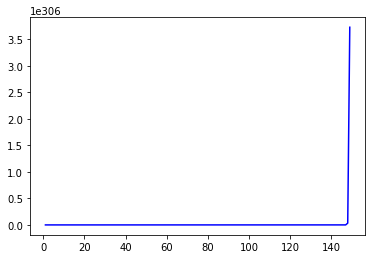

In [23]:
fig = plt.figure()
plt.plot(iters, cost, 'b')
plt.show()

To check if scaling affects the value of the learning rate (alpha), we scale our data with the MinMaxScaler function and follow again the same steps as we did with the original data, such as applying Linear Regression, printing some outcomes and plotting the line of the regression.

In [24]:
scaler_X10 = MinMaxScaler(feature_range=(0, 1))
rescaledX10 = scaler_X10.fit_transform(X10)
set_printoptions(precision=3)
print (rescaledX10)

[[ 0.129]
 [ 0.242]
 [ 0.339]
 ..., 
 [ 0.226]
 [ 0.774]
 [ 0.613]]


In [25]:
scaler_Y = MinMaxScaler(feature_range=(0, 1))
rescaledY = scaler_Y.fit_transform(Y)
set_printoptions(precision=3)
print (rescaledY)

[[ 0.5  ]
 [ 0.5  ]
 [ 0.5  ]
 ..., 
 [ 0.5  ]
 [ 0.667]
 [ 0.5  ]]


In [26]:
regr10scaled = LinearRegression()
regr10scaled.fit(rescaledX10, rescaledY)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [27]:
pred10scaled = regr10scaled.predict(rescaledX10)
print pred10scaled

[[ 0.39 ]
 [ 0.427]
 [ 0.458]
 ..., 
 [ 0.421]
 [ 0.599]
 [ 0.547]]


In [28]:
print 'Coefficients: \n', regr10scaled.coef_
intercept10scaled = regr10scaled.intercept_[0]
w1scaled = regr10scaled.coef_
print("\nThe intercept for our model is {}".format(intercept10scaled))
# The mean squared error
print("\nMean squared error: %.2f" % mean_squared_error(rescaledY, pred10scaled))
# Explained variance score: 1 is perfect prediction
print('\nVariance score: %.2f' % r2_score(rescaledY, pred10scaled))

Coefficients: 
[[ 0.324]]

The intercept for our model is 0.348293969078

Mean squared error: 0.02

Variance score: 0.19


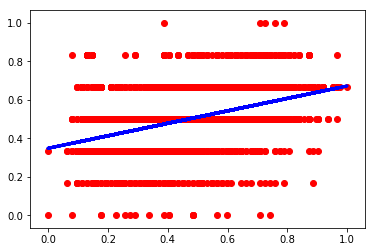

In [29]:
plt.scatter(rescaledX10, rescaledY,  color='red')
plt.plot(rescaledX10, pred10scaled, color='blue', linewidth=3)
plt.show()

Then we call again the Gradient Descent 3 times, with the same alpha values as before. 

As we can see, this time, value 0.001 for alpha makes the model to converge a lot faster, in 20.239 training epochs, value 0.01 for alpha is a bit better than before with 5.762 thraining epochs needed.

Finally value 0.1 for alpha has totally different behaviour than before, as with the data having been scaled, it is the most suitable value for alpha as it makes the model to converge to the best weights (minimum cost) in only 944 training epochs. So, scaling the data does affect the decision that we have to make about the value of the learning rate. 

In [30]:
w0, w1, cost, iters = gradient_descent((rescaledX10, rescaledY), 0.001)

Current model is: ([ 0.001] + [ 0.]x1)
Average Squared Error=[ 0.154]
Iteration:1
Current model is: ([ 0.001] + [ 0.001]x1)
Average Squared Error=[ 0.153]
Iteration:2
Current model is: ([ 0.002] + [ 0.001]x1)
Average Squared Error=[ 0.152]
Iteration:3
Current model is: ([ 0.003] + [ 0.001]x1)
Average Squared Error=[ 0.152]
Iteration:4
Current model is: ([ 0.004] + [ 0.001]x1)
Average Squared Error=[ 0.151]
Iteration:5
Current model is: ([ 0.004] + [ 0.002]x1)
Average Squared Error=[ 0.151]
Iteration:6
Current model is: ([ 0.005] + [ 0.002]x1)
Average Squared Error=[ 0.15]
Iteration:7
Current model is: ([ 0.006] + [ 0.002]x1)
Average Squared Error=[ 0.149]
Iteration:8
Current model is: ([ 0.007] + [ 0.003]x1)
Average Squared Error=[ 0.149]
Iteration:9
Current model is: ([ 0.007] + [ 0.003]x1)
Average Squared Error=[ 0.148]
Iteration:10
Current model is: ([ 0.008] + [ 0.003]x1)
Average Squared Error=[ 0.147]
Iteration:11
Current model is: ([ 0.009] + [ 0.003]x1)
Average Squared Error=[ 0

Iteration:124
Current model is: ([ 0.081] + [ 0.031]x1)
Average Squared Error=[ 0.094]
Iteration:125
Current model is: ([ 0.082] + [ 0.032]x1)
Average Squared Error=[ 0.093]
Iteration:126
Current model is: ([ 0.082] + [ 0.032]x1)
Average Squared Error=[ 0.093]
Iteration:127
Current model is: ([ 0.083] + [ 0.032]x1)
Average Squared Error=[ 0.093]
Iteration:128
Current model is: ([ 0.083] + [ 0.032]x1)
Average Squared Error=[ 0.092]
Iteration:129
Current model is: ([ 0.084] + [ 0.032]x1)
Average Squared Error=[ 0.092]
Iteration:130
Current model is: ([ 0.084] + [ 0.033]x1)
Average Squared Error=[ 0.092]
Iteration:131
Current model is: ([ 0.085] + [ 0.033]x1)
Average Squared Error=[ 0.091]
Iteration:132
Current model is: ([ 0.085] + [ 0.033]x1)
Average Squared Error=[ 0.091]
Iteration:133
Current model is: ([ 0.086] + [ 0.033]x1)
Average Squared Error=[ 0.09]
Iteration:134
Current model is: ([ 0.087] + [ 0.034]x1)
Average Squared Error=[ 0.09]
Iteration:135
Current model is: ([ 0.087] + [

Iteration:265
Current model is: ([ 0.149] + [ 0.059]x1)
Average Squared Error=[ 0.055]
Iteration:266
Current model is: ([ 0.149] + [ 0.059]x1)
Average Squared Error=[ 0.055]
Iteration:267
Current model is: ([ 0.15] + [ 0.059]x1)
Average Squared Error=[ 0.055]
Iteration:268
Current model is: ([ 0.15] + [ 0.059]x1)
Average Squared Error=[ 0.055]
Iteration:269
Current model is: ([ 0.15] + [ 0.06]x1)
Average Squared Error=[ 0.055]
Iteration:270
Current model is: ([ 0.151] + [ 0.06]x1)
Average Squared Error=[ 0.054]
Iteration:271
Current model is: ([ 0.151] + [ 0.06]x1)
Average Squared Error=[ 0.054]
Iteration:272
Current model is: ([ 0.152] + [ 0.06]x1)
Average Squared Error=[ 0.054]
Iteration:273
Current model is: ([ 0.152] + [ 0.06]x1)
Average Squared Error=[ 0.054]
Iteration:274
Current model is: ([ 0.152] + [ 0.06]x1)
Average Squared Error=[ 0.054]
Iteration:275
Current model is: ([ 0.153] + [ 0.061]x1)
Average Squared Error=[ 0.054]
Iteration:276
Current model is: ([ 0.153] + [ 0.061]

Average Squared Error=[ 0.034]
Iteration:420
Current model is: ([ 0.202] + [ 0.082]x1)
Average Squared Error=[ 0.033]
Iteration:421
Current model is: ([ 0.202] + [ 0.082]x1)
Average Squared Error=[ 0.033]
Iteration:422
Current model is: ([ 0.203] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:423
Current model is: ([ 0.203] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:424
Current model is: ([ 0.203] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:425
Current model is: ([ 0.203] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:426
Current model is: ([ 0.204] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:427
Current model is: ([ 0.204] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:428
Current model is: ([ 0.204] + [ 0.083]x1)
Average Squared Error=[ 0.033]
Iteration:429
Current model is: ([ 0.205] + [ 0.084]x1)
Average Squared Error=[ 0.033]
Iteration:430
Current model is: ([ 0.205] + [ 0.084]x1)
Average Squared Error=[ 0.032]
Iteration:43

Iteration:546
Current model is: ([ 0.233] + [ 0.097]x1)
Average Squared Error=[ 0.024]
Iteration:547
Current model is: ([ 0.234] + [ 0.098]x1)
Average Squared Error=[ 0.024]
Iteration:548
Current model is: ([ 0.234] + [ 0.098]x1)
Average Squared Error=[ 0.024]
Iteration:549
Current model is: ([ 0.234] + [ 0.098]x1)
Average Squared Error=[ 0.024]
Iteration:550
Current model is: ([ 0.234] + [ 0.098]x1)
Average Squared Error=[ 0.024]
Iteration:551
Current model is: ([ 0.234] + [ 0.098]x1)
Average Squared Error=[ 0.023]
Iteration:552
Current model is: ([ 0.235] + [ 0.098]x1)
Average Squared Error=[ 0.023]
Iteration:553
Current model is: ([ 0.235] + [ 0.098]x1)
Average Squared Error=[ 0.023]
Iteration:554
Current model is: ([ 0.235] + [ 0.098]x1)
Average Squared Error=[ 0.023]
Iteration:555
Current model is: ([ 0.235] + [ 0.098]x1)
Average Squared Error=[ 0.023]
Iteration:556
Current model is: ([ 0.235] + [ 0.099]x1)
Average Squared Error=[ 0.023]
Iteration:557
Current model is: ([ 0.236] +

Average Squared Error=[ 0.017]
Iteration:714
Current model is: ([ 0.263] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:715
Current model is: ([ 0.263] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:716
Current model is: ([ 0.263] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:717
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:718
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:719
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:720
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:721
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:722
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:723
Current model is: ([ 0.264] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:724
Current model is: ([ 0.265] + [ 0.114]x1)
Average Squared Error=[ 0.017]
Iteration:72

Current model is: ([ 0.278] + [ 0.123]x1)
Average Squared Error=[ 0.014]
Iteration:836
Current model is: ([ 0.278] + [ 0.123]x1)
Average Squared Error=[ 0.014]
Iteration:837
Current model is: ([ 0.278] + [ 0.123]x1)
Average Squared Error=[ 0.014]
Iteration:838
Current model is: ([ 0.279] + [ 0.123]x1)
Average Squared Error=[ 0.014]
Iteration:839
Current model is: ([ 0.279] + [ 0.123]x1)
Average Squared Error=[ 0.014]
Iteration:840
Current model is: ([ 0.279] + [ 0.124]x1)
Average Squared Error=[ 0.014]
Iteration:841
Current model is: ([ 0.279] + [ 0.124]x1)
Average Squared Error=[ 0.014]
Iteration:842
Current model is: ([ 0.279] + [ 0.124]x1)
Average Squared Error=[ 0.014]
Iteration:843
Current model is: ([ 0.279] + [ 0.124]x1)
Average Squared Error=[ 0.014]
Iteration:844
Current model is: ([ 0.279] + [ 0.124]x1)
Average Squared Error=[ 0.014]
Iteration:845
Current model is: ([ 0.279] + [ 0.124]x1)
Average Squared Error=[ 0.014]
Iteration:846
Current model is: ([ 0.279] + [ 0.124]x1)
A

Iteration:937
Current model is: ([ 0.288] + [ 0.13]x1)
Average Squared Error=[ 0.013]
Iteration:938
Current model is: ([ 0.288] + [ 0.13]x1)
Average Squared Error=[ 0.013]
Iteration:939
Current model is: ([ 0.288] + [ 0.13]x1)
Average Squared Error=[ 0.013]
Iteration:940
Current model is: ([ 0.288] + [ 0.13]x1)
Average Squared Error=[ 0.013]
Iteration:941
Current model is: ([ 0.288] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:942
Current model is: ([ 0.288] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:943
Current model is: ([ 0.289] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:944
Current model is: ([ 0.289] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:945
Current model is: ([ 0.289] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:946
Current model is: ([ 0.289] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:947
Current model is: ([ 0.289] + [ 0.131]x1)
Average Squared Error=[ 0.013]
Iteration:948
Current model is: ([ 0.289] + [ 0

Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1093
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1094
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1095
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1096
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1097
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1098
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1099
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1100
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1101
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1102
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:1103
Current model is: ([ 0.299] + [ 0.14]x1)
Av

Current model is: ([ 0.304] + [ 0.145]x1)
Average Squared Error=[ 0.011]
Iteration:1202
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1203
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1204
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1205
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1206
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1207
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1208
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1209
Current model is: ([ 0.304] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1210
Current model is: ([ 0.305] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1211
Current model is: ([ 0.305] + [ 0.146]x1)
Average Squared Error=[ 0.011]
Iteration:1212
Current model is: ([ 0.305] + [ 

Iteration:1350
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1351
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1352
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1353
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1354
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1355
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1356
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1357
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1358
Current model is: ([ 0.309] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1359
Current model is: ([ 0.31] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1360
Current model is: ([ 0.31] + [ 0.153]x1)
Average Squared Error=[ 0.01]
Iteration:1361
Current model is: ([ 0.31] + [

Current model is: ([ 0.312] + [ 0.157]x1)
Average Squared Error=[ 0.01]
Iteration:1459
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1460
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1461
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1462
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1463
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1464
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1465
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1466
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1467
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1468
Current model is: ([ 0.312] + [ 0.158]x1)
Average Squared Error=[ 0.01]
Iteration:1469
Current model is: ([ 0.312] + [ 0.158]x1)
A

Iteration:1581
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1582
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1583
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1584
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1585
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1586
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1587
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1588
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1589
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1590
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1591
Current model is: ([ 0.314] + [ 0.163]x1)
Average Squared Error=[ 0.01]
Iteration:1592
Current model is: ([ 0.314] 

Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1711
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1712
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1713
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1714
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1715
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1716
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1717
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1718
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1719
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1720
Current model is: ([ 0.315] + [ 0.168]x1)
Average Squared Error=[ 0.01]
Iteration:1721
Current model is: ([ 0.315] + [ 0.168]x1)
A

Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1827
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1828
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1829
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1830
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1831
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1832
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1833
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1834
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1835
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1836
Current model is: ([ 0.315] + [ 0.172]x1)
Average Squared Error=[ 0.009]
Iteration:1837
Current model is: ([ 0.315] + [ 

Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1971
Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1972
Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1973
Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1974
Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1975
Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1976
Current model is: ([ 0.316] + [ 0.177]x1)
Average Squared Error=[ 0.009]
Iteration:1977
Current model is: ([ 0.316] + [ 0.178]x1)
Average Squared Error=[ 0.009]
Iteration:1978
Current model is: ([ 0.316] + [ 0.178]x1)
Average Squared Error=[ 0.009]
Iteration:1979
Current model is: ([ 0.316] + [ 0.178]x1)
Average Squared Error=[ 0.009]
Iteration:1980
Current model is: ([ 0.316] + [ 0.178]x1)
Average Squared Error=[ 0.009]
Iteration:1981
Current model is: ([ 0.316] + [ 

Iteration:2102
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2103
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2104
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2105
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2106
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2107
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2108
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2109
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2110
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2111
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2112
Current model is: ([ 0.315] + [ 0.182]x1)
Average Squared Error=[ 0.009]
Iteration:2113
Current model is:

Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2202
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2203
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2204
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2205
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2206
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2207
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2208
Current model is: ([ 0.315] + [ 0.185]x1)
Average Squared Error=[ 0.009]
Iteration:2209
Current model is: ([ 0.315] + [ 0.186]x1)
Average Squared Error=[ 0.009]
Iteration:2210
Current model is: ([ 0.315] + [ 0.186]x1)
Average Squared Error=[ 0.009]
Iteration:2211
Current model is: ([ 0.315] + [ 0.186]x1)
Average Squared Error=[ 0.009]
Iteration:2212
Current model is: ([ 0.315] + [ 

Average Squared Error=[ 0.009]
Iteration:2328
Current model is: ([ 0.314] + [ 0.189]x1)
Average Squared Error=[ 0.009]
Iteration:2329
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2330
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2331
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2332
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2333
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2334
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2335
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2336
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2337
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2338
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:2

Iteration:2435
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2436
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2437
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2438
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2439
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2440
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2441
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2442
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2443
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2444
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2445
Current model is: ([ 0.314] + [ 0.193]x1)
Average Squared Error=[ 0.009]
Iteration:2446
Current model is:

Iteration:2662
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2663
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2664
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2665
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2666
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2667
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2668
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2669
Current model is: ([ 0.312] + [ 0.2]x1)
Average Squared Error=[ 0.008]
Iteration:2670
Current model is: ([ 0.312] + [ 0.201]x1)
Average Squared Error=[ 0.008]
Iteration:2671
Current model is: ([ 0.312] + [ 0.201]x1)
Average Squared Error=[ 0.008]
Iteration:2672
Current model is: ([ 0.312] + [ 0.201]x1)
Average Squared Error=[ 0.008]
Iteration:2673
Current model is: ([ 0.312] + [ 0

Average Squared Error=[ 0.008]
Iteration:2989
Current model is: ([ 0.309] + [ 0.21]x1)
Average Squared Error=[ 0.008]
Iteration:2990
Current model is: ([ 0.309] + [ 0.21]x1)
Average Squared Error=[ 0.008]
Iteration:2991
Current model is: ([ 0.309] + [ 0.21]x1)
Average Squared Error=[ 0.008]
Iteration:2992
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2993
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2994
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2995
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2996
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2997
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2998
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iteration:2999
Current model is: ([ 0.309] + [ 0.211]x1)
Average Squared Error=[ 0.008]
Iter

Average Squared Error=[ 0.008]
Iteration:3240
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3241
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3242
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3243
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3244
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3245
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3246
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3247
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3248
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3249
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
Iteration:3250
Current model is: ([ 0.307] + [ 0.218]x1)
Average Squared Error=[ 0.008]
I

Average Squared Error=[ 0.008]
Iteration:3392
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3393
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3394
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3395
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3396
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3397
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3398
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3399
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3400
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3401
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:3402
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
I

Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3535
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3536
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3537
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3538
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3539
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3540
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3541
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3542
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3543
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3544
Current model is: ([ 0.304] + [ 0.227]x1)
Average Squared Error=[ 0.008]
Iteration:3545
Current model is: ([ 0.304] + [ 

Iteration:3636
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3637
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3638
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3639
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3640
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3641
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3642
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3643
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3644
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3645
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3646
Current model is: ([ 0.303] + [ 0.23]x1)
Average Squared Error=[ 0.007]
Iteration:3647
Current model is: ([ 0.303] 

Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3813
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3814
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3815
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3816
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3817
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3818
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3819
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3820
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3821
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3822
Current model is: ([ 0.302] + [ 0.235]x1)
Average Squared Error=[ 0.007]
Iteration:3823
Current model is: ([ 0.302] + [ 

Iteration:4137
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4138
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4139
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4140
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4141
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4142
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4143
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4144
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4145
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4146
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4147
Current model is: ([ 0.299] + [ 0.244]x1)
Average Squared Error=[ 0.007]
Iteration:4148
Current model is:

Average Squared Error=[ 0.007]
Iteration:4458
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4459
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4460
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4461
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4462
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4463
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4464
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4465
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4466
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4467
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
Iteration:4468
Current model is: ([ 0.296] + [ 0.253]x1)
Average Squared Error=[ 0.007]
I

Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4751
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4752
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4753
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4754
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4755
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4756
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4757
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4758
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4759
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4760
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:4761
Current model is: ([ 0.293] + [ 

Iteration:5024
Current model is: ([ 0.291] + [ 0.268]x1)
Average Squared Error=[ 0.006]
Iteration:5025
Current model is: ([ 0.291] + [ 0.268]x1)
Average Squared Error=[ 0.006]
Iteration:5026
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5027
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5028
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5029
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5030
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5031
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5032
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5033
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5034
Current model is: ([ 0.291] + [ 0.269]x1)
Average Squared Error=[ 0.006]
Iteration:5035
Current model is:

Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5153
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5154
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5155
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5156
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5157
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5158
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5159
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5160
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5161
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5162
Current model is: ([ 0.29] + [ 0.272]x1)
Average Squared Error=[ 0.006]
Iteration:5163
Current model is: ([ 0.29] + [ 0.272]x1)
Av

Average Squared Error=[ 0.006]
Iteration:5258
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5259
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5260
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5261
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5262
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5263
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5264
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5265
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5266
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5267
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
Iteration:5268
Current model is: ([ 0.289] + [ 0.275]x1)
Average Squared Error=[ 0.006]
I

Average Squared Error=[ 0.006]
Iteration:5413
Current model is: ([ 0.288] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5414
Current model is: ([ 0.288] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5415
Current model is: ([ 0.288] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5416
Current model is: ([ 0.288] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5417
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5418
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5419
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5420
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5421
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5422
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
Iteration:5423
Current model is: ([ 0.287] + [ 0.279]x1)
Average Squared Error=[ 0.006]
I

Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5570
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5571
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5572
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5573
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5574
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5575
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5576
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5577
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5578
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5579
Current model is: ([ 0.286] + [ 0.283]x1)
Average Squared Error=[ 0.006]
Iteration:5580
Current model is: ([ 0.286] + [ 

Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5682
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5683
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5684
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5685
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5686
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5687
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5688
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5689
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5690
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5691
Current model is: ([ 0.285] + [ 0.286]x1)
Average Squared Error=[ 0.006]
Iteration:5692
Current model is: ([ 0.285] + [ 

Average Squared Error=[ 0.006]
Iteration:5820
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5821
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5822
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5823
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5824
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5825
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5826
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5827
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5828
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5829
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
Iteration:5830
Current model is: ([ 0.284] + [ 0.289]x1)
Average Squared Error=[ 0.006]
I

Average Squared Error=[ 0.006]
Iteration:6005
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6006
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6007
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6008
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6009
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6010
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6011
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6012
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6013
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6014
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
Iteration:6015
Current model is: ([ 0.283] + [ 0.294]x1)
Average Squared Error=[ 0.006]
I

Iteration:6171
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6172
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6173
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6174
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6175
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6176
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6177
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6178
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6179
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6180
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6181
Current model is: ([ 0.281] + [ 0.298]x1)
Average Squared Error=[ 0.005]
Iteration:6182
Current model is:

Iteration:6501
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6502
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6503
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6504
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6505
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6506
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6507
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6508
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6509
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6510
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6511
Current model is: ([ 0.279] + [ 0.306]x1)
Average Squared Error=[ 0.005]
Iteration:6512
Current model is:

Iteration:6825
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6826
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6827
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6828
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6829
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6830
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6831
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6832
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6833
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6834
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6835
Current model is: ([ 0.276] + [ 0.314]x1)
Average Squared Error=[ 0.005]
Iteration:6836
Current model is:

Average Squared Error=[ 0.005]
Iteration:7165
Current model is: ([ 0.274] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7166
Current model is: ([ 0.274] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7167
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7168
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7169
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7170
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7171
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7172
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7173
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7174
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
Iteration:7175
Current model is: ([ 0.273] + [ 0.322]x1)
Average Squared Error=[ 0.005]
I

Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7473
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7474
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7475
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7476
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7477
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7478
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7479
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7480
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7481
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7482
Current model is: ([ 0.271] + [ 0.329]x1)
Average Squared Error=[ 0.005]
Iteration:7483
Current model is: ([ 0.271] + [ 

Average Squared Error=[ 0.004]
Iteration:7775
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7776
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7777
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7778
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7779
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7780
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7781
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7782
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7783
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7784
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
Iteration:7785
Current model is: ([ 0.269] + [ 0.336]x1)
Average Squared Error=[ 0.004]
I

Iteration:8062
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8063
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8064
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8065
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8066
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8067
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8068
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8069
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8070
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8071
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8072
Current model is: ([ 0.267] + [ 0.342]x1)
Average Squared Error=[ 0.004]
Iteration:8073
Current model is:

Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8388
Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8389
Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8390
Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8391
Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8392
Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8393
Current model is: ([ 0.265] + [ 0.349]x1)
Average Squared Error=[ 0.004]
Iteration:8394
Current model is: ([ 0.265] + [ 0.35]x1)
Average Squared Error=[ 0.004]
Iteration:8395
Current model is: ([ 0.265] + [ 0.35]x1)
Average Squared Error=[ 0.004]
Iteration:8396
Current model is: ([ 0.265] + [ 0.35]x1)
Average Squared Error=[ 0.004]
Iteration:8397
Current model is: ([ 0.265] + [ 0.35]x1)
Average Squared Error=[ 0.004]
Iteration:8398
Current model is: ([ 0.265] + [ 0.35

Average Squared Error=[ 0.004]
Iteration:8665
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8666
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8667
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8668
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8669
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8670
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8671
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8672
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8673
Current model is: ([ 0.263] + [ 0.355]x1)
Average Squared Error=[ 0.004]
Iteration:8674
Current model is: ([ 0.263] + [ 0.356]x1)
Average Squared Error=[ 0.004]
Iteration:8675
Current model is: ([ 0.263] + [ 0.356]x1)
Average Squared Error=[ 0.004]
I

Iteration:8991
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8992
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8993
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8994
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8995
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8996
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8997
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8998
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:8999
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:9000
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:9001
Current model is: ([ 0.26] + [ 0.362]x1)
Average Squared Error=[ 0.004]
Iteration:9002
Current model is: ([ 0.26] +

Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9448
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9449
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9450
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9451
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9452
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9453
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9454
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9455
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9456
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9457
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:9458
Current model is: ([ 0.257] + [ 

Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9798
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9799
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9800
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9801
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9802
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9803
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9804
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9805
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9806
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9807
Current model is: ([ 0.255] + [ 0.379]x1)
Average Squared Error=[ 0.003]
Iteration:9808
Current model is: ([ 0.255] + [ 

Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10186
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10187
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10188
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10189
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10190
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10191
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10192
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10193
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10194
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10195
Current model is: ([ 0.253] + [ 0.386]x1)
Average Squared Error=[ 0.003]
Iteration:10196
Current model is: ([ 

Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10608
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10609
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10610
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10611
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10612
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10613
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10614
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10615
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10616
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10617
Current model is: ([ 0.25] + [ 0.394]x1)
Average Squared Error=[ 0.003]
Iteration:10618
Current model is: ([ 0.25] + [ 0

Average Squared Error=[ 0.003]
Iteration:10920
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10921
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10922
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10923
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10924
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10925
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10926
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10927
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10928
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10929
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10930
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:10

Average Squared Error=[ 0.003]
Iteration:11192
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11193
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11194
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11195
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11196
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11197
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11198
Current model is: ([ 0.247] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11199
Current model is: ([ 0.246] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11200
Current model is: ([ 0.246] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11201
Current model is: ([ 0.246] + [ 0.405]x1)
Average Squared Error=[ 0.003]
Iteration:11202
Current model is: ([ 0.246] + [ 0.405]x1)
Average Squared Error

Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11513
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11514
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11515
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11516
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11517
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11518
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11519
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11520
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11521
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11522
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:11523
Current model is: ([ 

Iteration:11847
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11848
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11849
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11850
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11851
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11852
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11853
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11854
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11855
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11856
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11857
Current model is: ([ 0.243] + [ 0.417]x1)
Average Squared Error=[ 0.003]
Iteration:11858
Curre

Average Squared Error=[ 0.003]
Iteration:12203
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12204
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12205
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12206
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12207
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12208
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12209
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12210
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12211
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12212
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error=[ 0.003]
Iteration:12213
Current model is: ([ 0.241] + [ 0.423]x1)
Average Squared Error

Average Squared Error=[ 0.002]
Iteration:12609
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12610
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12611
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12612
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12613
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12614
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12615
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12616
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12617
Current model is: ([ 0.239] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12618
Current model is: ([ 0.238] + [ 0.43]x1)
Average Squared Error=[ 0.002]
Iteration:12619
Current model is: ([ 0.238] + [ 0.43]x1)
Average Squared Error=[ 0.002]
I

Iteration:12973
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12974
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12975
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12976
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12977
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12978
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12979
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12980
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12981
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12982
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12983
Current model is: ([ 0.237] + [ 0.436]x1)
Average Squared Error=[ 0.002]
Iteration:12984
Curre

Average Squared Error=[ 0.002]
Iteration:13318
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13319
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13320
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13321
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13322
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13323
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13324
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13325
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13326
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13327
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error=[ 0.002]
Iteration:13328
Current model is: ([ 0.235] + [ 0.441]x1)
Average Squared Error

Iteration:13711
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13712
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13713
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13714
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13715
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13716
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13717
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13718
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13719
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13720
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13721
Current model is: ([ 0.233] + [ 0.447]x1)
Average Squared Error=[ 0.002]
Iteration:13722
Curre

Average Squared Error=[ 0.002]
Iteration:14091
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14092
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14093
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14094
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14095
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14096
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14097
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14098
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14099
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14100
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error=[ 0.002]
Iteration:14101
Current model is: ([ 0.231] + [ 0.453]x1)
Average Squared Error

Iteration:14403
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14404
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14405
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14406
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14407
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14408
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14409
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14410
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14411
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14412
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14413
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:14414
Curre

Iteration:14703
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14704
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14705
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14706
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14707
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14708
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14709
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14710
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14711
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14712
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14713
Current model is: ([ 0.228] + [ 0.462]x1)
Average Squared Error=[ 0.002]
Iteration:14714
Curre

Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15105
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15106
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15107
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15108
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15109
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15110
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15111
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15112
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15113
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15114
Current model is: ([ 0.226] + [ 0.468]x1)
Average Squared Error=[ 0.002]
Iteration:15115
Current model is: ([ 

Average Squared Error=[ 0.002]
Iteration:15437
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15438
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15439
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15440
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15441
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15442
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15443
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15444
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15445
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15446
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error=[ 0.002]
Iteration:15447
Current model is: ([ 0.225] + [ 0.473]x1)
Average Squared Error

Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15661
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15662
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15663
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15664
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15665
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15666
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15667
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15668
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15669
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15670
Current model is: ([ 0.224] + [ 0.476]x1)
Average Squared Error=[ 0.002]
Iteration:15671
Current model is: ([ 

Average Squared Error=[ 0.002]
Iteration:15864
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15865
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15866
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15867
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15868
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15869
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15870
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15871
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15872
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15873
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error=[ 0.002]
Iteration:15874
Current model is: ([ 0.223] + [ 0.479]x1)
Average Squared Error

Iteration:16005
Current model is: ([ 0.222] + [ 0.48]x1)
Average Squared Error=[ 0.002]
Iteration:16006
Current model is: ([ 0.222] + [ 0.48]x1)
Average Squared Error=[ 0.002]
Iteration:16007
Current model is: ([ 0.222] + [ 0.48]x1)
Average Squared Error=[ 0.002]
Iteration:16008
Current model is: ([ 0.222] + [ 0.48]x1)
Average Squared Error=[ 0.002]
Iteration:16009
Current model is: ([ 0.222] + [ 0.48]x1)
Average Squared Error=[ 0.002]
Iteration:16010
Current model is: ([ 0.222] + [ 0.481]x1)
Average Squared Error=[ 0.002]
Iteration:16011
Current model is: ([ 0.222] + [ 0.481]x1)
Average Squared Error=[ 0.002]
Iteration:16012
Current model is: ([ 0.222] + [ 0.481]x1)
Average Squared Error=[ 0.002]
Iteration:16013
Current model is: ([ 0.222] + [ 0.481]x1)
Average Squared Error=[ 0.002]
Iteration:16014
Current model is: ([ 0.222] + [ 0.481]x1)
Average Squared Error=[ 0.002]
Iteration:16015
Current model is: ([ 0.222] + [ 0.481]x1)
Average Squared Error=[ 0.002]
Iteration:16016
Current mo

Iteration:16216
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16217
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16218
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16219
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16220
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16221
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16222
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16223
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16224
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16225
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16226
Current model is: ([ 0.221] + [ 0.483]x1)
Average Squared Error=[ 0.002]
Iteration:16227
Curre

Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16427
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16428
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16429
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16430
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16431
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16432
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16433
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16434
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16435
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16436
Current model is: ([ 0.22] + [ 0.486]x1)
Average Squared Error=[ 0.002]
Iteration:16437
Current model is: ([ 0.22] + [ 0

Average Squared Error=[ 0.001]
Iteration:16602
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16603
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16604
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16605
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16606
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16607
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16608
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16609
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16610
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16611
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error=[ 0.001]
Iteration:16612
Current model is: ([ 0.219] + [ 0.488]x1)
Average Squared Error

Current model is: ([ 0.219] + [ 0.49]x1)
Average Squared Error=[ 0.001]
Iteration:16769
Current model is: ([ 0.219] + [ 0.49]x1)
Average Squared Error=[ 0.001]
Iteration:16770
Current model is: ([ 0.219] + [ 0.49]x1)
Average Squared Error=[ 0.001]
Iteration:16771
Current model is: ([ 0.219] + [ 0.49]x1)
Average Squared Error=[ 0.001]
Iteration:16772
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16773
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16774
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16775
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16776
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16777
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16778
Current model is: ([ 0.219] + [ 0.491]x1)
Average Squared Error=[ 0.001]
Iteration:16779
Current model is: ([ 0.21

Iteration:17115
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17116
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17117
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17118
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17119
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17120
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17121
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17122
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17123
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17124
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17125
Current model is: ([ 0.217] + [ 0.495]x1)
Average Squared Error=[ 0.001]
Iteration:17126
Curre

Average Squared Error=[ 0.001]
Iteration:17473
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17474
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17475
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17476
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17477
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17478
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17479
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17480
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17481
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17482
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error=[ 0.001]
Iteration:17483
Current model is: ([ 0.216] + [ 0.499]x1)
Average Squared Error

Average Squared Error=[ 0.001]
Iteration:17805
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17806
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17807
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17808
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17809
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17810
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17811
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17812
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17813
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17814
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:17815
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error

Iteration:18190
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18191
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18192
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18193
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18194
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18195
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18196
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18197
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18198
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18199
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18200
Current model is: ([ 0.213] + [ 0.508]x1)
Average Squared Error=[ 0.001]
Iteration:18201
Curre

Iteration:18534
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18535
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18536
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18537
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18538
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18539
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18540
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18541
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18542
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18543
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18544
Current model is: ([ 0.212] + [ 0.512]x1)
Average Squared Error=[ 0.001]
Iteration:18545
Curre

Iteration:18957
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18958
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18959
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18960
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18961
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18962
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18963
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18964
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18965
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18966
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18967
Current model is: ([ 0.21] + [ 0.517]x1)
Average Squared Error=[ 0.001]
Iteration:18968
Current model is

Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19341
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19342
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19343
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19344
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19345
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19346
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19347
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19348
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19349
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19350
Current model is: ([ 0.209] + [ 0.521]x1)
Average Squared Error=[ 0.001]
Iteration:19351
Current model is: ([ 

Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19440
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19441
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19442
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19443
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19444
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19445
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19446
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19447
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19448
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19449
Current model is: ([ 0.209] + [ 0.522]x1)
Average Squared Error=[ 0.001]
Iteration:19450
Current model is: ([ 

Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19544
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19545
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19546
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19547
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19548
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19549
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19550
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19551
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19552
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19553
Current model is: ([ 0.208] + [ 0.523]x1)
Average Squared Error=[ 0.001]
Iteration:19554
Current model is: ([ 

Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19641
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19642
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19643
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19644
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19645
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19646
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19647
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19648
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19649
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19650
Current model is: ([ 0.208] + [ 0.524]x1)
Average Squared Error=[ 0.001]
Iteration:19651
Current model is: ([ 

Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19781
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19782
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19783
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19784
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19785
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19786
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19787
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19788
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19789
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19790
Current model is: ([ 0.207] + [ 0.526]x1)
Average Squared Error=[ 0.001]
Iteration:19791
Current model is: ([ 

Iteration:19896
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19897
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19898
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19899
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19900
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19901
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19902
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19903
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19904
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19905
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19906
Current model is: ([ 0.207] + [ 0.527]x1)
Average Squared Error=[ 0.001]
Iteration:19907
Curre

Iteration:20012
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20013
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20014
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20015
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20016
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20017
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20018
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20019
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20020
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20021
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20022
Current model is: ([ 0.207] + [ 0.528]x1)
Average Squared Error=[ 0.001]
Iteration:20023
Curre

Iteration:20160
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20161
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20162
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20163
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20164
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20165
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20166
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20167
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20168
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20169
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20170
Current model is: ([ 0.206] + [ 0.53]x1)
Average Squared Error=[ 0.001]
Iteration:20171
Current model is

Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20284
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20285
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20286
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20287
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20288
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20289
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20290
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20291
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20292
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20293
Current model is: ([ 0.206] + [ 0.531]x1)
Average Squared Error=[ 0.001]
Iteration:20294
Current model is: ([ 

Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20392
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20393
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20394
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20395
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20396
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20397
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20398
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20399
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20400
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20401
Current model is: ([ 0.205] + [ 0.532]x1)
Average Squared Error=[ 0.001]
Iteration:20402
Current model is: ([ 

Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20545
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20546
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20547
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20548
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20549
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20550
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20551
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20552
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20553
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20554
Current model is: ([ 0.205] + [ 0.534]x1)
Average Squared Error=[ 0.001]
Iteration:20555
Current model is: ([ 

Average Squared Error=[ 0.001]
Iteration:20720
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20721
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20722
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20723
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20724
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20725
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20726
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20727
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20728
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20729
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error=[ 0.001]
Iteration:20730
Current model is: ([ 0.204] + [ 0.535]x1)
Average Squared Error

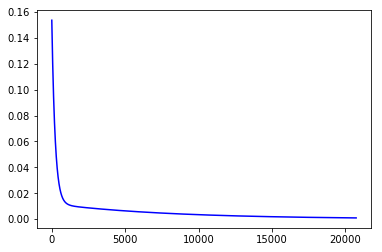

In [31]:
fig = plt.figure()
plt.plot(iters, cost, 'b')
plt.show()

In [32]:
w0, w1, cost, iters = gradient_descent((rescaledX10, rescaledY), 0.01)

Current model is: ([ 0.007] + [ 0.003]x1)
Average Squared Error=[ 0.148]
Iteration:1
Current model is: ([ 0.015] + [ 0.006]x1)
Average Squared Error=[ 0.142]
Iteration:2
Current model is: ([ 0.022] + [ 0.008]x1)
Average Squared Error=[ 0.136]
Iteration:3
Current model is: ([ 0.029] + [ 0.011]x1)
Average Squared Error=[ 0.131]
Iteration:4
Current model is: ([ 0.035] + [ 0.014]x1)
Average Squared Error=[ 0.126]
Iteration:5
Current model is: ([ 0.042] + [ 0.016]x1)
Average Squared Error=[ 0.121]
Iteration:6
Current model is: ([ 0.049] + [ 0.019]x1)
Average Squared Error=[ 0.116]
Iteration:7
Current model is: ([ 0.055] + [ 0.021]x1)
Average Squared Error=[ 0.111]
Iteration:8
Current model is: ([ 0.061] + [ 0.023]x1)
Average Squared Error=[ 0.107]
Iteration:9
Current model is: ([ 0.067] + [ 0.026]x1)
Average Squared Error=[ 0.103]
Iteration:10
Current model is: ([ 0.073] + [ 0.028]x1)
Average Squared Error=[ 0.099]
Iteration:11
Current model is: ([ 0.079] + [ 0.03]x1)
Average Squared Error=

Current model is: ([ 0.296] + [ 0.137]x1)
Average Squared Error=[ 0.012]
Iteration:104
Current model is: ([ 0.297] + [ 0.137]x1)
Average Squared Error=[ 0.012]
Iteration:105
Current model is: ([ 0.298] + [ 0.138]x1)
Average Squared Error=[ 0.012]
Iteration:106
Current model is: ([ 0.298] + [ 0.139]x1)
Average Squared Error=[ 0.012]
Iteration:107
Current model is: ([ 0.299] + [ 0.139]x1)
Average Squared Error=[ 0.011]
Iteration:108
Current model is: ([ 0.299] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:109
Current model is: ([ 0.3] + [ 0.14]x1)
Average Squared Error=[ 0.011]
Iteration:110
Current model is: ([ 0.3] + [ 0.141]x1)
Average Squared Error=[ 0.011]
Iteration:111
Current model is: ([ 0.301] + [ 0.141]x1)
Average Squared Error=[ 0.011]
Iteration:112
Current model is: ([ 0.301] + [ 0.142]x1)
Average Squared Error=[ 0.011]
Iteration:113
Current model is: ([ 0.302] + [ 0.142]x1)
Average Squared Error=[ 0.011]
Iteration:114
Current model is: ([ 0.302] + [ 0.143]x1)
Average

Average Squared Error=[ 0.009]
Iteration:227
Current model is: ([ 0.315] + [ 0.188]x1)
Average Squared Error=[ 0.009]
Iteration:228
Current model is: ([ 0.315] + [ 0.188]x1)
Average Squared Error=[ 0.009]
Iteration:229
Current model is: ([ 0.315] + [ 0.189]x1)
Average Squared Error=[ 0.009]
Iteration:230
Current model is: ([ 0.314] + [ 0.189]x1)
Average Squared Error=[ 0.009]
Iteration:231
Current model is: ([ 0.314] + [ 0.189]x1)
Average Squared Error=[ 0.009]
Iteration:232
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:233
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:234
Current model is: ([ 0.314] + [ 0.19]x1)
Average Squared Error=[ 0.009]
Iteration:235
Current model is: ([ 0.314] + [ 0.191]x1)
Average Squared Error=[ 0.009]
Iteration:236
Current model is: ([ 0.314] + [ 0.191]x1)
Average Squared Error=[ 0.009]
Iteration:237
Current model is: ([ 0.314] + [ 0.191]x1)
Average Squared Error=[ 0.009]
Iteration:238
C

Current model is: ([ 0.306] + [ 0.221]x1)
Average Squared Error=[ 0.008]
Iteration:334
Current model is: ([ 0.306] + [ 0.221]x1)
Average Squared Error=[ 0.008]
Iteration:335
Current model is: ([ 0.306] + [ 0.222]x1)
Average Squared Error=[ 0.008]
Iteration:336
Current model is: ([ 0.306] + [ 0.222]x1)
Average Squared Error=[ 0.008]
Iteration:337
Current model is: ([ 0.306] + [ 0.222]x1)
Average Squared Error=[ 0.008]
Iteration:338
Current model is: ([ 0.306] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:339
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:340
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:341
Current model is: ([ 0.305] + [ 0.223]x1)
Average Squared Error=[ 0.008]
Iteration:342
Current model is: ([ 0.305] + [ 0.224]x1)
Average Squared Error=[ 0.008]
Iteration:343
Current model is: ([ 0.305] + [ 0.224]x1)
Average Squared Error=[ 0.008]
Iteration:344
Current model is: ([ 0.305] + [ 0.224]x1)
A

Average Squared Error=[ 0.007]
Iteration:473
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:474
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:475
Current model is: ([ 0.293] + [ 0.261]x1)
Average Squared Error=[ 0.007]
Iteration:476
Current model is: ([ 0.293] + [ 0.262]x1)
Average Squared Error=[ 0.007]
Iteration:477
Current model is: ([ 0.293] + [ 0.262]x1)
Average Squared Error=[ 0.006]
Iteration:478
Current model is: ([ 0.293] + [ 0.262]x1)
Average Squared Error=[ 0.006]
Iteration:479
Current model is: ([ 0.293] + [ 0.262]x1)
Average Squared Error=[ 0.006]
Iteration:480
Current model is: ([ 0.293] + [ 0.263]x1)
Average Squared Error=[ 0.006]
Iteration:481
Current model is: ([ 0.293] + [ 0.263]x1)
Average Squared Error=[ 0.006]
Iteration:482
Current model is: ([ 0.293] + [ 0.263]x1)
Average Squared Error=[ 0.006]
Iteration:483
Current model is: ([ 0.292] + [ 0.264]x1)
Average Squared Error=[ 0.006]
Iteration:48

Current model is: ([ 0.281] + [ 0.3]x1)
Average Squared Error=[ 0.005]
Iteration:626
Current model is: ([ 0.28] + [ 0.3]x1)
Average Squared Error=[ 0.005]
Iteration:627
Current model is: ([ 0.28] + [ 0.301]x1)
Average Squared Error=[ 0.005]
Iteration:628
Current model is: ([ 0.28] + [ 0.301]x1)
Average Squared Error=[ 0.005]
Iteration:629
Current model is: ([ 0.28] + [ 0.301]x1)
Average Squared Error=[ 0.005]
Iteration:630
Current model is: ([ 0.28] + [ 0.301]x1)
Average Squared Error=[ 0.005]
Iteration:631
Current model is: ([ 0.28] + [ 0.302]x1)
Average Squared Error=[ 0.005]
Iteration:632
Current model is: ([ 0.28] + [ 0.302]x1)
Average Squared Error=[ 0.005]
Iteration:633
Current model is: ([ 0.28] + [ 0.302]x1)
Average Squared Error=[ 0.005]
Iteration:634
Current model is: ([ 0.28] + [ 0.302]x1)
Average Squared Error=[ 0.005]
Iteration:635
Current model is: ([ 0.28] + [ 0.303]x1)
Average Squared Error=[ 0.005]
Iteration:636
Current model is: ([ 0.28] + [ 0.303]x1)
Average Squared 

Current model is: ([ 0.271] + [ 0.331]x1)
Average Squared Error=[ 0.005]
Iteration:754
Current model is: ([ 0.271] + [ 0.331]x1)
Average Squared Error=[ 0.005]
Iteration:755
Current model is: ([ 0.271] + [ 0.331]x1)
Average Squared Error=[ 0.005]
Iteration:756
Current model is: ([ 0.27] + [ 0.331]x1)
Average Squared Error=[ 0.005]
Iteration:757
Current model is: ([ 0.27] + [ 0.331]x1)
Average Squared Error=[ 0.005]
Iteration:758
Current model is: ([ 0.27] + [ 0.332]x1)
Average Squared Error=[ 0.005]
Iteration:759
Current model is: ([ 0.27] + [ 0.332]x1)
Average Squared Error=[ 0.005]
Iteration:760
Current model is: ([ 0.27] + [ 0.332]x1)
Average Squared Error=[ 0.005]
Iteration:761
Current model is: ([ 0.27] + [ 0.332]x1)
Average Squared Error=[ 0.005]
Iteration:762
Current model is: ([ 0.27] + [ 0.333]x1)
Average Squared Error=[ 0.005]
Iteration:763
Current model is: ([ 0.27] + [ 0.333]x1)
Average Squared Error=[ 0.005]
Iteration:764
Current model is: ([ 0.27] + [ 0.333]x1)
Average Sq

Current model is: ([ 0.258] + [ 0.371]x1)
Average Squared Error=[ 0.004]
Iteration:940
Current model is: ([ 0.258] + [ 0.371]x1)
Average Squared Error=[ 0.004]
Iteration:941
Current model is: ([ 0.258] + [ 0.371]x1)
Average Squared Error=[ 0.004]
Iteration:942
Current model is: ([ 0.257] + [ 0.371]x1)
Average Squared Error=[ 0.004]
Iteration:943
Current model is: ([ 0.257] + [ 0.371]x1)
Average Squared Error=[ 0.004]
Iteration:944
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:945
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:946
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:947
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:948
Current model is: ([ 0.257] + [ 0.372]x1)
Average Squared Error=[ 0.004]
Iteration:949
Current model is: ([ 0.257] + [ 0.373]x1)
Average Squared Error=[ 0.004]
Iteration:950
Current model is: ([ 0.257] + [ 0.373]x1)
A

Iteration:1167
Current model is: ([ 0.244] + [ 0.414]x1)
Average Squared Error=[ 0.003]
Iteration:1168
Current model is: ([ 0.244] + [ 0.414]x1)
Average Squared Error=[ 0.003]
Iteration:1169
Current model is: ([ 0.244] + [ 0.414]x1)
Average Squared Error=[ 0.003]
Iteration:1170
Current model is: ([ 0.244] + [ 0.414]x1)
Average Squared Error=[ 0.003]
Iteration:1171
Current model is: ([ 0.243] + [ 0.414]x1)
Average Squared Error=[ 0.003]
Iteration:1172
Current model is: ([ 0.243] + [ 0.415]x1)
Average Squared Error=[ 0.003]
Iteration:1173
Current model is: ([ 0.243] + [ 0.415]x1)
Average Squared Error=[ 0.003]
Iteration:1174
Current model is: ([ 0.243] + [ 0.415]x1)
Average Squared Error=[ 0.003]
Iteration:1175
Current model is: ([ 0.243] + [ 0.415]x1)
Average Squared Error=[ 0.003]
Iteration:1176
Current model is: ([ 0.243] + [ 0.415]x1)
Average Squared Error=[ 0.003]
Iteration:1177
Current model is: ([ 0.243] + [ 0.416]x1)
Average Squared Error=[ 0.003]
Iteration:1178
Current model is:

Current model is: ([ 0.236] + [ 0.437]x1)
Average Squared Error=[ 0.002]
Iteration:1307
Current model is: ([ 0.236] + [ 0.437]x1)
Average Squared Error=[ 0.002]
Iteration:1308
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1309
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1310
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1311
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1312
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1313
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1314
Current model is: ([ 0.236] + [ 0.438]x1)
Average Squared Error=[ 0.002]
Iteration:1315
Current model is: ([ 0.236] + [ 0.439]x1)
Average Squared Error=[ 0.002]
Iteration:1316
Current model is: ([ 0.236] + [ 0.439]x1)
Average Squared Error=[ 0.002]
Iteration:1317
Current model is: ([ 0.236] + [ 

Current model is: ([ 0.23] + [ 0.457]x1)
Average Squared Error=[ 0.002]
Iteration:1432
Current model is: ([ 0.23] + [ 0.457]x1)
Average Squared Error=[ 0.002]
Iteration:1433
Current model is: ([ 0.23] + [ 0.457]x1)
Average Squared Error=[ 0.002]
Iteration:1434
Current model is: ([ 0.23] + [ 0.457]x1)
Average Squared Error=[ 0.002]
Iteration:1435
Current model is: ([ 0.23] + [ 0.457]x1)
Average Squared Error=[ 0.002]
Iteration:1436
Current model is: ([ 0.23] + [ 0.457]x1)
Average Squared Error=[ 0.002]
Iteration:1437
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:1438
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:1439
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:1440
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:1441
Current model is: ([ 0.229] + [ 0.458]x1)
Average Squared Error=[ 0.002]
Iteration:1442
Current model is: ([ 0.229] + [ 0.458]

Iteration:1528
Current model is: ([ 0.225] + [ 0.471]x1)
Average Squared Error=[ 0.002]
Iteration:1529
Current model is: ([ 0.225] + [ 0.471]x1)
Average Squared Error=[ 0.002]
Iteration:1530
Current model is: ([ 0.225] + [ 0.471]x1)
Average Squared Error=[ 0.002]
Iteration:1531
Current model is: ([ 0.225] + [ 0.471]x1)
Average Squared Error=[ 0.002]
Iteration:1532
Current model is: ([ 0.225] + [ 0.471]x1)
Average Squared Error=[ 0.002]
Iteration:1533
Current model is: ([ 0.225] + [ 0.471]x1)
Average Squared Error=[ 0.002]
Iteration:1534
Current model is: ([ 0.225] + [ 0.472]x1)
Average Squared Error=[ 0.002]
Iteration:1535
Current model is: ([ 0.225] + [ 0.472]x1)
Average Squared Error=[ 0.002]
Iteration:1536
Current model is: ([ 0.225] + [ 0.472]x1)
Average Squared Error=[ 0.002]
Iteration:1537
Current model is: ([ 0.225] + [ 0.472]x1)
Average Squared Error=[ 0.002]
Iteration:1538
Current model is: ([ 0.225] + [ 0.472]x1)
Average Squared Error=[ 0.002]
Iteration:1539
Current model is:

Average Squared Error=[ 0.002]
Iteration:1627
Current model is: ([ 0.221] + [ 0.484]x1)
Average Squared Error=[ 0.002]
Iteration:1628
Current model is: ([ 0.221] + [ 0.484]x1)
Average Squared Error=[ 0.002]
Iteration:1629
Current model is: ([ 0.221] + [ 0.484]x1)
Average Squared Error=[ 0.002]
Iteration:1630
Current model is: ([ 0.221] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1631
Current model is: ([ 0.221] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1632
Current model is: ([ 0.221] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1633
Current model is: ([ 0.221] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1634
Current model is: ([ 0.221] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1635
Current model is: ([ 0.22] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1636
Current model is: ([ 0.22] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iteration:1637
Current model is: ([ 0.22] + [ 0.485]x1)
Average Squared Error=[ 0.002]
Iter

Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1766
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1767
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1768
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1769
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1770
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1771
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1772
Current model is: ([ 0.215] + [ 0.502]x1)
Average Squared Error=[ 0.001]
Iteration:1773
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:1774
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:1775
Current model is: ([ 0.215] + [ 0.503]x1)
Average Squared Error=[ 0.001]
Iteration:1776
Current model is: ([ 0.215] + [ 

Average Squared Error=[ 0.001]
Iteration:1906
Current model is: ([ 0.21] + [ 0.518]x1)
Average Squared Error=[ 0.001]
Iteration:1907
Current model is: ([ 0.21] + [ 0.518]x1)
Average Squared Error=[ 0.001]
Iteration:1908
Current model is: ([ 0.21] + [ 0.518]x1)
Average Squared Error=[ 0.001]
Iteration:1909
Current model is: ([ 0.21] + [ 0.518]x1)
Average Squared Error=[ 0.001]
Iteration:1910
Current model is: ([ 0.21] + [ 0.518]x1)
Average Squared Error=[ 0.001]
Iteration:1911
Current model is: ([ 0.21] + [ 0.519]x1)
Average Squared Error=[ 0.001]
Iteration:1912
Current model is: ([ 0.21] + [ 0.519]x1)
Average Squared Error=[ 0.001]
Iteration:1913
Current model is: ([ 0.21] + [ 0.519]x1)
Average Squared Error=[ 0.001]
Iteration:1914
Current model is: ([ 0.21] + [ 0.519]x1)
Average Squared Error=[ 0.001]
Iteration:1915
Current model is: ([ 0.21] + [ 0.519]x1)
Average Squared Error=[ 0.001]
Iteration:1916
Current model is: ([ 0.209] + [ 0.519]x1)
Average Squared Error=[ 0.001]
Iteration:1

Average Squared Error=[ 0.001]
Iteration:2190
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2191
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2192
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2193
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2194
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2195
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2196
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2197
Current model is: ([ 0.2] + [ 0.547]x1)
Average Squared Error=[ 0.001]
Iteration:2198
Current model is: ([ 0.2] + [ 0.548]x1)
Average Squared Error=[ 0.001]
Iteration:2199
Current model is: ([ 0.2] + [ 0.548]x1)
Average Squared Error=[ 0.001]
Iteration:2200
Current model is: ([ 0.2] + [ 0.548]x1)
Average Squared Error=[ 0.001]
Iteration:2201
Current 

Average Squared Error=[ 0.001]
Iteration:2420
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2421
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2422
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2423
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2424
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2425
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2426
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2427
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2428
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2429
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:2430
Current model is: ([ 0.194] + [ 0.568]x1)
Average Squared Error=[ 0.001]
I

Average Squared Error=[ 0.]
Iteration:2742
Current model is: ([ 0.186] + [ 0.59]x1)
Average Squared Error=[ 0.]
Iteration:2743
Current model is: ([ 0.186] + [ 0.59]x1)
Average Squared Error=[ 0.]
Iteration:2744
Current model is: ([ 0.186] + [ 0.59]x1)
Average Squared Error=[ 0.]
Iteration:2745
Current model is: ([ 0.186] + [ 0.59]x1)
Average Squared Error=[ 0.]
Iteration:2746
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2747
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2748
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2749
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2750
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2751
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2752
Current model is: ([ 0.186] + [ 0.591]x1)
Average Squared Error=[ 0.]
Iteration:2753
Current model is: ([ 0.186

Average Squared Error=[ 0.]
Iteration:3086
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3087
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3088
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3089
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3090
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3091
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3092
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3093
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3094
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3095
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3096
Current model is: ([ 0.18] + [ 0.611]x1)
Average Squared Error=[ 0.]
Iteration:3097
Current model is: ([ 0.18] + [ 0.

Average Squared Error=[ 0.]
Iteration:3385
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3386
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3387
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3388
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3389
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3390
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3391
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3392
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3393
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3394
Current model is: ([ 0.175] + [ 0.625]x1)
Average Squared Error=[ 0.]
Iteration:3395
Current model is: ([ 0.175] + [ 0.626]x1)
Average Squared Error=[ 0.]
Iteration:3396
Current model is: ([ 0

Current model is: ([ 0.171] + [ 0.637]x1)
Average Squared Error=[ 0.]
Iteration:3694
Current model is: ([ 0.171] + [ 0.637]x1)
Average Squared Error=[ 0.]
Iteration:3695
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3696
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3697
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3698
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3699
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3700
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3701
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3702
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3703
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:3704
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[

Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.323e-05]
Iteration:3966
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.312e-05]
Iteration:3967
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.302e-05]
Iteration:3968
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.292e-05]
Iteration:3969
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.281e-05]
Iteration:3970
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.271e-05]
Iteration:3971
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.261e-05]
Iteration:3972
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.250e-05]
Iteration:3973
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.240e-05]
Iteration:3974
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.230e-05]
Iteration:3975
Current model is: ([ 0.168] + [ 0.647]x1)
Average Squared Error=[  8.2

Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.560e-05]
Iteration:4289
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.553e-05]
Iteration:4290
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.546e-05]
Iteration:4291
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.539e-05]
Iteration:4292
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.532e-05]
Iteration:4293
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.525e-05]
Iteration:4294
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.518e-05]
Iteration:4295
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.511e-05]
Iteration:4296
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.504e-05]
Iteration:4297
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.498e-05]
Iteration:4298
Current model is: ([ 0.165] + [ 0.656]x1)
Average Squared Error=[  5.4

Iteration:4610
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.719e-05]
Iteration:4611
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.714e-05]
Iteration:4612
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.709e-05]
Iteration:4613
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.705e-05]
Iteration:4614
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.700e-05]
Iteration:4615
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.695e-05]
Iteration:4616
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.691e-05]
Iteration:4617
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.686e-05]
Iteration:4618
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.682e-05]
Iteration:4619
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squared Error=[  3.677e-05]
Iteration:4620
Current model is: ([ 0.163] + [ 0.663]x1)
Average Squar

Average Squared Error=[  2.566e-05]
Iteration:4908
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.563e-05]
Iteration:4909
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.560e-05]
Iteration:4910
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.556e-05]
Iteration:4911
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.553e-05]
Iteration:4912
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.550e-05]
Iteration:4913
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.547e-05]
Iteration:4914
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.544e-05]
Iteration:4915
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.541e-05]
Iteration:4916
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.537e-05]
Iteration:4917
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.534e-05]
Iteration:4918
Current model is: (

Average Squared Error=[  1.670e-05]
Iteration:5252
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.668e-05]
Iteration:5253
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.666e-05]
Iteration:5254
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.664e-05]
Iteration:5255
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.661e-05]
Iteration:5256
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.659e-05]
Iteration:5257
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.657e-05]
Iteration:5258
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.655e-05]
Iteration:5259
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.653e-05]
Iteration:5260
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.651e-05]
Iteration:5261
Current model is: ([ 0.159] + [ 0.674]x1)
Average Squared Error=[  1.649e-05]
Iteration:5262
Current model is: (

Average Squared Error=[  1.131e-05]
Iteration:5564
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.129e-05]
Iteration:5565
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.128e-05]
Iteration:5566
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.127e-05]
Iteration:5567
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.125e-05]
Iteration:5568
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.124e-05]
Iteration:5569
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.122e-05]
Iteration:5570
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.121e-05]
Iteration:5571
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.120e-05]
Iteration:5572
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.118e-05]
Iteration:5573
Current model is: ([ 0.158] + [ 0.678]x1)
Average Squared Error=[  1.117e-05]
Iteration:5574
Current model is: (

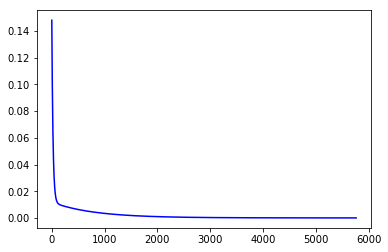

In [33]:
fig = plt.figure()
plt.plot(iters, cost, 'b')
plt.show()

In [34]:
w0, w1, cost, iters = gradient_descent((rescaledX10, rescaledY), 0.1)

Current model is: ([ 0.074] + [ 0.028]x1)
Average Squared Error=[ 0.098]
Iteration:1
Current model is: ([ 0.132] + [ 0.051]x1)
Average Squared Error=[ 0.064]
Iteration:2
Current model is: ([ 0.176] + [ 0.069]x1)
Average Squared Error=[ 0.043]
Iteration:3
Current model is: ([ 0.211] + [ 0.084]x1)
Average Squared Error=[ 0.031]
Iteration:4
Current model is: ([ 0.238] + [ 0.097]x1)
Average Squared Error=[ 0.023]
Iteration:5
Current model is: ([ 0.258] + [ 0.108]x1)
Average Squared Error=[ 0.018]
Iteration:6
Current model is: ([ 0.274] + [ 0.117]x1)
Average Squared Error=[ 0.015]
Iteration:7
Current model is: ([ 0.286] + [ 0.124]x1)
Average Squared Error=[ 0.013]
Iteration:8
Current model is: ([ 0.295] + [ 0.131]x1)
Average Squared Error=[ 0.012]
Iteration:9
Current model is: ([ 0.302] + [ 0.137]x1)
Average Squared Error=[ 0.011]
Iteration:10
Current model is: ([ 0.307] + [ 0.143]x1)
Average Squared Error=[ 0.011]
Iteration:11
Current model is: ([ 0.311] + [ 0.148]x1)
Average Squared Error

Current model is: ([ 0.249] + [ 0.398]x1)
Average Squared Error=[ 0.003]
Iteration:108
Current model is: ([ 0.248] + [ 0.4]x1)
Average Squared Error=[ 0.003]
Iteration:109
Current model is: ([ 0.247] + [ 0.402]x1)
Average Squared Error=[ 0.003]
Iteration:110
Current model is: ([ 0.247] + [ 0.404]x1)
Average Squared Error=[ 0.003]
Iteration:111
Current model is: ([ 0.246] + [ 0.406]x1)
Average Squared Error=[ 0.003]
Iteration:112
Current model is: ([ 0.246] + [ 0.408]x1)
Average Squared Error=[ 0.003]
Iteration:113
Current model is: ([ 0.245] + [ 0.409]x1)
Average Squared Error=[ 0.003]
Iteration:114
Current model is: ([ 0.245] + [ 0.411]x1)
Average Squared Error=[ 0.003]
Iteration:115
Current model is: ([ 0.244] + [ 0.413]x1)
Average Squared Error=[ 0.003]
Iteration:116
Current model is: ([ 0.243] + [ 0.415]x1)
Average Squared Error=[ 0.003]
Iteration:117
Current model is: ([ 0.243] + [ 0.416]x1)
Average Squared Error=[ 0.003]
Iteration:118
Current model is: ([ 0.242] + [ 0.418]x1)
Ave

Iteration:232
Current model is: ([ 0.196] + [ 0.56]x1)
Average Squared Error=[ 0.001]
Iteration:233
Current model is: ([ 0.196] + [ 0.561]x1)
Average Squared Error=[ 0.001]
Iteration:234
Current model is: ([ 0.196] + [ 0.561]x1)
Average Squared Error=[ 0.001]
Iteration:235
Current model is: ([ 0.195] + [ 0.562]x1)
Average Squared Error=[ 0.001]
Iteration:236
Current model is: ([ 0.195] + [ 0.563]x1)
Average Squared Error=[ 0.001]
Iteration:237
Current model is: ([ 0.195] + [ 0.564]x1)
Average Squared Error=[ 0.001]
Iteration:238
Current model is: ([ 0.195] + [ 0.565]x1)
Average Squared Error=[ 0.001]
Iteration:239
Current model is: ([ 0.194] + [ 0.566]x1)
Average Squared Error=[ 0.001]
Iteration:240
Current model is: ([ 0.194] + [ 0.566]x1)
Average Squared Error=[ 0.001]
Iteration:241
Current model is: ([ 0.194] + [ 0.567]x1)
Average Squared Error=[ 0.001]
Iteration:242
Current model is: ([ 0.194] + [ 0.568]x1)
Average Squared Error=[ 0.001]
Iteration:243
Current model is: ([ 0.193] + 

Current model is: ([ 0.171] + [ 0.637]x1)
Average Squared Error=[ 0.]
Iteration:366
Current model is: ([ 0.171] + [ 0.637]x1)
Average Squared Error=[ 0.]
Iteration:367
Current model is: ([ 0.171] + [ 0.637]x1)
Average Squared Error=[ 0.]
Iteration:368
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:369
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:370
Current model is: ([ 0.171] + [ 0.638]x1)
Average Squared Error=[ 0.]
Iteration:371
Current model is: ([ 0.171] + [ 0.639]x1)
Average Squared Error=[ 0.]
Iteration:372
Current model is: ([ 0.171] + [ 0.639]x1)
Average Squared Error=[ 0.]
Iteration:373
Current model is: ([ 0.17] + [ 0.639]x1)
Average Squared Error=[ 0.]
Iteration:374
Current model is: ([ 0.17] + [ 0.64]x1)
Average Squared Error=[ 0.]
Iteration:375
Current model is: ([ 0.17] + [ 0.64]x1)
Average Squared Error=[ 0.]
Iteration:376
Current model is: ([ 0.17] + [ 0.641]x1)
Average Squared Error=[ 0.]
Iteration:37

Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.678e-05]
Iteration:486
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.645e-05]
Iteration:487
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.612e-05]
Iteration:488
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.580e-05]
Iteration:489
Current model is: ([ 0.161] + [ 0.668]x1)
Average Squared Error=[  2.547e-05]
Iteration:490
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.516e-05]
Iteration:491
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.484e-05]
Iteration:492
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.454e-05]
Iteration:493
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.423e-05]
Iteration:494
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.393e-05]
Iteration:495
Current model is: ([ 0.161] + [ 0.669]x1)
Average Squared Error=[  2.363e-05]
It

Current model is: ([ 0.156] + [ 0.685]x1)
Average Squared Error=[  3.748e-06]
Iteration:643
Current model is: ([ 0.156] + [ 0.685]x1)
Average Squared Error=[  3.701e-06]
Iteration:644
Current model is: ([ 0.156] + [ 0.685]x1)
Average Squared Error=[  3.655e-06]
Iteration:645
Current model is: ([ 0.155] + [ 0.685]x1)
Average Squared Error=[  3.610e-06]
Iteration:646
Current model is: ([ 0.155] + [ 0.685]x1)
Average Squared Error=[  3.565e-06]
Iteration:647
Current model is: ([ 0.155] + [ 0.686]x1)
Average Squared Error=[  3.521e-06]
Iteration:648
Current model is: ([ 0.155] + [ 0.686]x1)
Average Squared Error=[  3.477e-06]
Iteration:649
Current model is: ([ 0.155] + [ 0.686]x1)
Average Squared Error=[  3.433e-06]
Iteration:650
Current model is: ([ 0.155] + [ 0.686]x1)
Average Squared Error=[  3.391e-06]
Iteration:651
Current model is: ([ 0.155] + [ 0.686]x1)
Average Squared Error=[  3.348e-06]
Iteration:652
Current model is: ([ 0.155] + [ 0.686]x1)
Average Squared Error=[  3.307e-06]
It

Average Squared Error=[  9.812e-07]
Iteration:750
Current model is: ([ 0.154] + [ 0.69]x1)
Average Squared Error=[  9.689e-07]
Iteration:751
Current model is: ([ 0.154] + [ 0.69]x1)
Average Squared Error=[  9.569e-07]
Iteration:752
Current model is: ([ 0.154] + [ 0.69]x1)
Average Squared Error=[  9.450e-07]
Iteration:753
Current model is: ([ 0.154] + [ 0.69]x1)
Average Squared Error=[  9.332e-07]
Iteration:754
Current model is: ([ 0.154] + [ 0.69]x1)
Average Squared Error=[  9.216e-07]
Iteration:755
Current model is: ([ 0.154] + [ 0.691]x1)
Average Squared Error=[  9.101e-07]
Iteration:756
Current model is: ([ 0.154] + [ 0.691]x1)
Average Squared Error=[  8.988e-07]
Iteration:757
Current model is: ([ 0.154] + [ 0.691]x1)
Average Squared Error=[  8.876e-07]
Iteration:758
Current model is: ([ 0.154] + [ 0.691]x1)
Average Squared Error=[  8.766e-07]
Iteration:759
Current model is: ([ 0.154] + [ 0.691]x1)
Average Squared Error=[  8.656e-07]
Iteration:760
Current model is: ([ 0.154] + [ 0.6

Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.537e-07]
Iteration:898
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.518e-07]
Iteration:899
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.499e-07]
Iteration:900
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.480e-07]
Iteration:901
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.462e-07]
Iteration:902
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.444e-07]
Iteration:903
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.426e-07]
Iteration:904
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.408e-07]
Iteration:905
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.390e-07]
Iteration:906
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.373e-07]
Iteration:907
Current model is: ([ 0.153] + [ 0.694]x1)
Average Squared Error=[  1.356e-07]
It

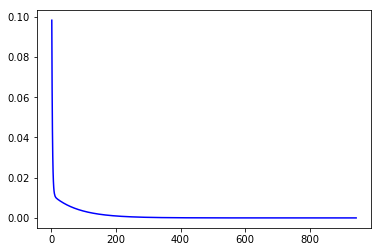

In [35]:
fig = plt.figure()
plt.plot(iters, cost, 'b')
plt.show()

The last step would be to check how well the Gradient Descent did, by ploting the line with the optimum w0 and w1. 

It seems that the model is better than before, because now it seems to be able to predict a wider range of the Y values. 

In [36]:
Ybest = 0.153 + 0.694*rescaledX10

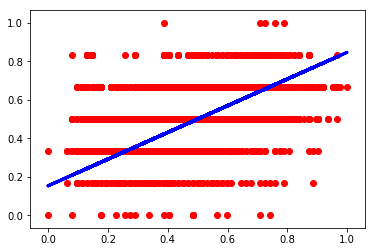

In [37]:
plt.scatter(rescaledX10, rescaledY,  color='red')
plt.plot(rescaledX10, Ybest, color='blue', linewidth=3)
plt.show()

In [38]:
w0plot = np.vstack(w0)
w1plot = np.vstack(w1)
costplot = np.vstack(cost)

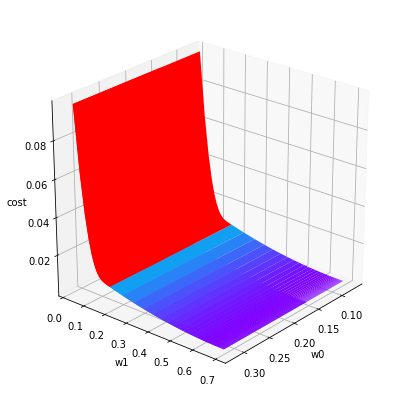

In [39]:
Xs, Ys = np.meshgrid(w0plot, w1plot)

fig = plt.figure(figsize=(7,7))
ax = fig.gca(projection="3d")
ax.set_xlabel(r'w0')
ax.set_ylabel(r'w1')
ax.set_zlabel(r'cost')
ax.view_init(elev=25, azim=40)
ax.plot_surface(Xs, Ys, costplot, cmap=cm.rainbow)